In [1]:
import pandas as pd
import chardet
from prophet import Prophet
import re
import matplotlib.pyplot as plt
%matplotlib inline

/Users/gokul/anaconda3/envs/gk_prophet/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
from scipy.stats import spearmanr
from scipy.stats import chi2_contingency
from scipy.stats import zscore

In [3]:
import numpy as np

In [52]:
try:
    df = pd.DataFrame()
    for i in range(16,25):
        url = "/Users/gokul/Documents/code/FPL/Fantasy-Premier-League/data/"+str(2000+i)+"-"+str(i+1)+ \
              "/gws/merged_gw.csv"
    
        with open(url, 'rb') as f:
            result = chardet.detect(f.read())
        
        df = pd.concat([df, pd.read_csv(url, parse_dates=["kickoff_time"], encoding=result['encoding'])], ignore_index=True)
    
    
    #df = df[["name", "kickoff_time", "total_points", "position", "team"]]
    df['name'] = df['name'].apply(lambda x: re.sub(r'[^\w]|[_\d]', '', str(x)).lower())
except Exception as c:
    print("--------------Exception Occured-------------\n",c,"\n", url)

--------------Exception Occured-------------
 Error tokenizing data. C error: Expected 42 fields in line 14180, saw 49
 
 /Users/gokul/Documents/code/FPL/Fantasy-Premier-League/data/2024-25/gws/merged_gw.csv


In [83]:
df[df['name'].str.lower().str.contains('muril')]

,name,assists,attempted_passes,big_chances_created,big_chances_missed,bonus,bps,clean_sheets,clearances_blocks_interceptions,completed_passes,...,yellow_cards,GW,position,team,xP,expected_assists,expected_goal_involvements,expected_goals,expected_goals_conceded,starts
168871,Murillo Santiago Costa dos Santos,0,NaN,NaN,NaN,0,0,0,NaN,NaN,...,0,4,DEF,Nott'm Forest,2.0,0.00,0.00,0.00,0.00,0.0
169576,Murillo Santiago Costa dos Santos,0,NaN,NaN,NaN,0,0,0,NaN,NaN,...,0,5,DEF,Nott'm Forest,0.5,0.00,0.00,0.00,0.00,0.0
170293,Murillo Santiago Costa dos Santos,0,NaN,NaN,NaN,0,0,0,NaN,NaN,...,0,6,DEF,Nott'm Forest,-1.0,0.00,0.00,0.00,0.00,0.0
171024,Murillo Santiago Costa dos Santos,0,NaN,NaN,NaN,0,18,0,NaN,NaN,...,0,7,DEF,Nott'm Forest,0.7,0.01,0.07,0.06,1.70,1.0
171818,Murillo Santiago Costa dos Santos,0,NaN,NaN,NaN,1,33,1,NaN,NaN,...,0,8,DEF,Nott'm Forest,3.0,0.05,0.58,0.53,0.81,1.0
172545,Murillo Santiago Costa dos Santos,0,NaN,NaN,NaN,0,13,0,NaN,NaN,...,1,9,DEF,Nott'm Forest,3.5,0.01,0.01,0.00,1.71,1.0
173276,Murillo Santiago Costa dos Santos,0,NaN,NaN,NaN,0,12,0,NaN,NaN,...,0,10,DEF,Nott'm Forest,2.2,0.01,0.09,0.08,2.95,1.0
174007,Murillo Santiago Costa dos Santos,0,NaN,NaN,NaN,0,24,1,NaN,NaN,...,0,11,DEF,Nott'm Forest,2.3,0.00,0.00,0.00,1.26,1.0
174741,Murillo Santiago Costa dos Santos,0,NaN,NaN,NaN,0,16,0,NaN,NaN,...,0,12,DEF,Nott'm Forest,2.7,0.01,0.01,0.00,1.14,1.0
175484,Murillo Santiago Costa dos Santos,0,NaN,NaN,NaN,0,6,0,NaN,NaN,...,0,13,DEF,Nott'm Forest,1.4,0.11,0.11,0.00,1.46,1.0


In [ ]:
len(df['name'][df['name'].str.contains('mohamedsalah')])

In [ ]:
df = df[['name', 'kickoff_time', 'assists', 'bonus', 'bps', 'goals_conceded', 'goals_scored', 'saves', 'selected', 'threat', 'value', 'xP', 'total_points', "position", "team", "clean_sheets", "red_cards"]]

In [ ]:
#for col in df_ref.columns:
#    if sum(df_ref[col].notna())/len(df_ref[col]) < 0.5:
#        df_ref.drop(col, axis=1, inplace=True)
len(df)

In [ ]:
df.dropna(inplace=True)

In [ ]:
len(df)

In [ ]:
def nameCleaner(player, daf):
    ddf = df[df['name'] == player]

    ddf.set_index("kickoff_time", inplace=True)
    if not (ddf.sort_index()[:"2023"].empty or ddf.sort_index()["2024":].empty):    
        ddf = ddf.sort_index().asfreq("W", method="bfill")
        ddf.reset_index(inplace=True)
        ddf.rename({"kickoff_time":"ds", "total_points":"y"}, axis=1, inplace=True)
        ddf['ds'] = ddf['ds'].apply(lambda x:x.tz_localize(None))
        return ddf
    else:
        print("Obsolete Player")


In [ ]:
df_ref = nameCleaner('mohamedsalah', df)

In [ ]:
len(df_ref)

In [ ]:
df_ref

In [ ]:
df = df.dropna()

In [ ]:
for col in df.columns:
    print("\n\n--------------------------")
    print(df[col].value_counts()[:4])

In [ ]:
rem/mod: name, penalties_missed, was_home, yellow_cards

In [ ]:
df['kickoff_time'] = df['kickoff_time'].astype(str)

In [ ]:
from datetime import datetime
def timeChange(dateTime):
    time_str = str(dateTime).split(" ")[1]
    time_obj = datetime.strptime(time_str, "%H:%M:%S%z")
    total_seconds = time_obj.hour * 3600 + time_obj.minute * 60 + time_obj.second
    return total_seconds
    

In [ ]:
df['kickoff_time'] = df['kickoff_time'].apply(timeChange)

In [ ]:
df = df[[i for i in df.columns if i not in ["name", "penalties_missed", "was_home", "yellow_cards", "team", "position"]]]

In [ ]:
pd.get_dummies(df['team'], prefix='team')

In [ ]:
anv_df1 = df[["team", "total_points"]]
anv_df2 = df[["position", "total_points"]]

In [ ]:
# Group the data by category
groups1 = [group['total_points'].values for name, group in anv_df1.groupby('team')]

# Perform one-way ANOVA
f_stat, p_value = stats.f_oneway(*groups)

print(f"F-Statistic: {f_stat}")
print(f"P-value: {p_value}")

In [ ]:
# Group the data by category
groups = [group['total_points'].values for name, group in anv_df2.groupby('position')]

# Perform one-way ANOVA
f_stat, p_value = stats.f_oneway(*groups)

print(f"F-Statistic: {f_stat}")
print(f"P-value: {p_value}")

In [ ]:
Cleansheets#penalties_missed, was_home, yellow_cards
#penalties_missed: yellow_cards
#was_home: yellow_cards
red_cards: yellowcard

In [ ]:
df.columns

In [ ]:
df.dtypes

In [ ]:
#removed_by_self_corr = "ict_index", "influence", "minutes", "transfers_out", "transfers_in", "creativity"

In [ ]:
df_cont = df[[i for i in df.columns if i not in ["clean_sheets", "red_cards", "total_points", "team", "position", "ict_index", "influence", "minutes", "transfers_out", "transfers_in", "creativity"] ]]

In [ ]:
conti_ref = df_cont[[i for i in df_cont if i in df_ref.columns]]

In [ ]:
conti_ref.corr(method = 'spearman')

In [ ]:
df_ref[["ict_index", "influence", "minutes", "transfers_out", "transfers_in", "creativity"]].corr(method='spearman')

In [ ]:
corrdf = abs(conti_ref.corr(method='spearman')) > 0.7

In [ ]:
for cr in corrdf.columns:
    if (len(corrdf[corrdf[cr]])) > 1:
        print(list(corrdf[corrdf[cr]].index))
            

In [ ]:
corrdf.columns

In [ ]:
cont_rem = []
for i in df_cont.columns:
    if abs(spearmanr(df_cont[i], df['total_points'])[0]) > 0.2:
        print("\n-----------------------------------\n",i,abs(spearmanr(df_cont[i], df['total_points'])[0]))
    else:
        cont_rem.append(i)

In [ ]:
cont_rem

In [ ]:
df_ref = df[[i for i in df.columns if i not in cont_rem]]

In [ ]:
df_ref.columns

In [ ]:
Dropped assists
Dropped bonus
Dropped goals_conceded
Dropped goals_scored
Dropped saves
Dropped threat
Dropped total_points

In [ ]:
#conti_var = [k for k in df_ref.columns if k not in ["position", "team", "clean_sheets", "red_cards", "assists", "bonus", "goals_conceded", "goals_scored", "saves", "threat", "total_points"]]

In [ ]:
df.columns

In [ ]:
df['name']

In [ ]:
contin_var_final = ['assists', 'bonus', 'bps', 'goals_conceded', 'goals_scored', 'saves', 'selected', 'threat', 'value', 'xP', 'total_points']

In [ ]:
disc_var_final = ["position", "team", "clean_sheets", "red_cards"]

In [ ]:
import pandas as pd
import chardet
from prophet import Prophet
import re
import matplotlib.pyplot as plt
%matplotlib inline
from scipy.stats import spearmanr
from scipy.stats import chi2_contingency
from scipy.stats import zscore
import numpy as np

In [ ]:
df = pd.DataFrame()
for i in range(16,25):
    url = "/Users/gokul/Documents/code/FPL/Fantasy-Premier-League/data/"+str(2000+i)+"-"+str(i+1)+ \
          "/gws/merged_gw.csv"

    with open(url, 'rb') as f:
        result = chardet.detect(f.read())
    
    df = pd.concat([df, pd.read_csv(url, parse_dates=["kickoff_time"], encoding=result['encoding'])], ignore_index=True)


#df = df[["name", "kickoff_time", "total_points", "position", "team"]]
df['name'] = df['name'].apply(lambda x: re.sub(r'[^\w]|[_\d]', '', str(x)).lower())

In [ ]:
df = df[['name', 'kickoff_time', 'assists', 'bonus', 'bps', 'goals_conceded', 'goals_scored', 'saves', 'selected', 'threat', 'value', 'xP', 'total_points', "position", "team", "clean_sheets", "red_cards"]]

In [ ]:
def nameCleaner(player, daf):
    ddf = df[df['name'] == player]

    ddf.set_index("kickoff_time", inplace=True)
    if not (ddf.sort_index()[:"2023"].empty or ddf.sort_index()["2024":].empty):    
        ddf = ddf.sort_index().asfreq("W", method="bfill")
        ddf.reset_index(inplace=True)
        ddf.rename({"kickoff_time":"ds", "total_points":"y"}, axis=1, inplace=True)
        ddf['ds'] = ddf['ds'].apply(lambda x:x.tz_localize(None))
        return ddf
    else:
        print("Obsolete Player")


#----------------------

In [ ]:
df = df[['name', 'kickoff_time', 'assists', 'bonus', 'bps', 'goals_conceded', 'goals_scored', 'saves', 'selected', 'threat', 'value', 'xP', 'total_points', "position", "team", "clean_sheets", "red_cards"]]

In [ ]:
def nameCleaner(player, daf):
    ddf = df[df['name'] == player]

    ddf.set_index("kickoff_time", inplace=True)
    if not (ddf.sort_index()[:"2023"].empty or ddf.sort_index()["2024":].empty):    
        ddf = ddf.sort_index().asfreq("W", method="bfill")
        ddf.reset_index(inplace=True)
        ddf.rename({"kickoff_time":"ds", "total_points":"y"}, axis=1, inplace=True)
        ddf['ds'] = ddf['ds'].apply(lambda x:x.tz_localize(None))
        return ddf
    else:
        print("Obsolete Player")

In [ ]:
df_ref = nameCleaner('mohamedsalah', df)

In [ ]:
df_final = pd.get_dummies(df_ref, columns=["position", "team", "clean_sheets", "red_cards"], prefix=["position", "team", "clean_sheets", "red_cards"], drop_first=True).reset_index(drop=True)

In [ ]:
contin_var_final_rare = [i for i in df_final.columns if i not in ['ds', 'assists', 'bonus', 'goals_conceded', 'goals_scored', 'saves', 'threat']]

In [ ]:
contin_var_final_rare

In [ ]:
def outlierMgmt(dataF, var):

    for cc in [i for i in df_final.columns if i not in contin_var_final_rare]:
        
        if len(dataF[cc].value_counts()) <= 1:
            dataF.drop(cc, axis=1, inplace=True)
            print("Dropped due to singularity", cc)
            continue


    for c in [i for i in df_final.columns if i not in contin_var_final_rare]:

        if len(dataF[c].value_counts()) <= 1:
            
            dataF.drop(c, axis=1, inplace=True)
            print("Dropped due to singularity", c)
            continue
            
        if (dataF[c].dtype == 'int64' or dataF[c].dtype == 'float'):
            
            dataF = dataF[np.abs(zscore(dataF[c])) < 3] # 3sd removal
            
            q1 = dataF[c].quantile(.25)
            q3 = dataF[c].quantile(.75)
            iqr = q3 - q1
            
            #if iqr == 0:
             #   dataF.drop(c, axis=1, inplace=True)
              #  print("Dropped", c)
               # continue
            upper = q3 + 1.5 * iqr
            lower = q1 - 1.5 * iqr
            dataF = dataF[((dataF[c] > lower) & (dataF[c] < upper))] # 1.5 iqr removal

        
            
    return dataF
dffn = outlierMgmt(df_final, contin_var_final_rare)

In [ ]:
len(df_final)

In [ ]:
len(dffn)

In [ ]:
dffn.columns

In [ ]:
dffn[dffn['xP'].isna()]['ds'].min()

In [ ]:
dffn.dropna(inplace=True)

In [ ]:
df_train = dffn.head(len(dffn)-10)

In [ ]:
df_test = dffn.tail(10)

In [ ]:
len(df_train)

In [ ]:
len(df_test)

In [ ]:
model = Prophet()
model.add_regressor("assists", standardize = False)
model.add_regressor("bonus", standardize = False)
model.add_regressor("bps", standardize = False)
model.add_regressor("goals_conceded", standardize = False)
model.add_regressor("goals_scored", standardize = False)
model.add_regressor("selected", standardize = False)
model.add_regressor("threat", standardize = False)
model.add_regressor("value", standardize = False)
model.add_regressor("xP", standardize = False)
model.add_regressor("clean_sheets_1", standardize = False)
model.fit(dffn)

In [ ]:
pred_D = 18
future = model.make_future_dataframe(periods=pred_D)

In [ ]:
fut = future.tail(pred_D).set_index('ds').resample('W').sum().reset_index()

In [ ]:
fut

In [ ]:
dffn

In [ ]:
m = Prophet()
d = dffn[['assists', 'ds']].rename(columns={'assists':'y'})

In [ ]:
m.fit(d)

In [ ]:
def uniFut(col_name, fut_ds):

    m = Prophet()
    pdf = dffn[[col_name, 'ds']].rename(columns={col_name:'y'})
    m.fit(pdf)
    return m.predict(fut_ds)[['ds', 'yhat']].rename(columns={'yhat':col_name})

In [ ]:
unDF = pd.DataFrame(columns=['ds'])
for uncol in df_train.drop(['ds', 'y'], axis=1).columns:
    print(uncol)
    unDF = pd.merge(unDF, uniFut(uncol, fut), on = 'ds', how ='outer' )

In [ ]:
unDF

In [ ]:
def nameCleaner(player, daf):
    ddf = df[df['name'] == player]

    ddf.set_index("kickoff_time", inplace=True)
    if not (ddf.sort_index()[:"2023"].empty or ddf.sort_index()["2024":].empty):    
        ddf = ddf.sort_index().asfreq("W", method="bfill")
        ddf.reset_index(inplace=True)
        ddf.rename({"kickoff_time":"ds", "total_points":"y"}, axis=1, inplace=True)
        ddf['ds'] = ddf['ds'].apply(lambda x:x.tz_localize(None))
        return ddf
    else:
        print("=========Obsolete Player Found==========")
        return {}

### ----------- Starts here ---------------

In [5]:
def outlierMgmt(dataF, var):

    for c in [i for i in dataF.columns if i not in var]:

        if len(dataF[c].value_counts()) <= 1:
            
            dataF.drop(c, axis=1, inplace=True)
            print("Dropped due to singularity", c)
            continue
            
        if (dataF[c].dtype == 'int64' or dataF[c].dtype == 'float'):
            
            q1 = dataF[c].quantile(.25)
            q3 = dataF[c].quantile(.75)
            iqr = q3 - q1
            
            #if iqr == 0:
             #   dataF.drop(c, axis=1, inplace=True)
              #  print("Dropped", c)
               # continue
            upper = q3 + 1.5 * iqr
            lower = q1 - 1.5 * iqr

            if not ((len(dataF[((dataF[c] > lower) & (dataF[c] < upper))]) == 0) and (len(dataF[np.abs(zscore(dataF[c])) < 3]) == 0)):
                dataF.drop(c, axis=1, inplace=True)
                print("Dropped due to singularity by IQR or 3sd filter", c)
                continue
                
            # dataF = dataF[((dataF[c] > lower) & (dataF[c] < upper))] # 1.5 iqr removal 
            dataF = dataF[np.abs(zscore(dataF[c])) < 3] # 3sd removal
            
    return dataF

In [6]:
def uniFut(df, col_name, fut_ds):

    m = Prophet()#changepoint_prior_scale=0.01, interval_width = 0.95)
    pdf = df[[col_name, 'ds']].rename(columns={col_name:'y'})
    m.fit(pdf)
    return m.predict(fut_ds)[['ds', 'yhat']].rename(columns={'yhat':col_name})

In [14]:
def playerRating(name, fut_wks, df_real):

    #try:
    df_ref = df_real.copy()
    
    team_df = pd.read_csv("Fantasy-Premier-League/data/2024-25/teams.csv")
    fix_df = pd.read_excel("epl-2024-GMTStandardTime.xlsx").rename({"Date":"ds"}, axis=1)
    p_team = df_ref[df_ref['name'].str.contains(name)]['team'].unique()[-1]
    #df_ref['team'] = df_ref['team'].apply(lambda x: team_df[team_df['name'] == x ]['id'])
    df_ref['team'] = df_ref['team'].map(team_df.set_index('name')['id'])
    
    df_final = pd.get_dummies(df_ref, columns=["position", "team", "clean_sheets", "red_cards"], prefix=["position", "team", "clean_sheets", "red_cards"], drop_first=True).reset_index(drop=True)
    contin_var_final_rare = [i for i in df_final.columns if i in ['opponent_team', 'was_home', 'name', 'y', 'ds']]
    dffn = outlierMgmt(df_final, contin_var_final_rare)
    dffn.dropna(inplace=True)
    dffn.drop_duplicates(inplace=True)
    dffn = dffn[~dffn.index.duplicated(keep='first')]
    dffn.reset_index(inplace=True, drop=True)
    cap = dffn['y'].max() * 1.2
    
    
    
    # model = Prophet(changepoint_prior_scale=0.01, interval_width = 0.95)
    model = Prophet()
    

    for c in dffn.drop(['name', 'ds', 'y'], axis = 1).columns:
        #print("------------>", c)
        exec(f'model.add_regressor("{c}", standardize = False)')
    dffn['cap'] = cap
    
    model.fit(dffn)
    
    was_home = None
    opposition = ''
    def futDatecreate(row):
        if row['Home Team'] == p_team:
            was_home = True
            opposition = row['Away Team']
        else:
            was_home = False
            opposition = row['Home Team']
        return [was_home, opposition]

    fix_ts = fix_df[['ds', 'Home Team', 'Away Team']].set_index('ds')
    #fix = fix_ts.loc[fix_ts.index > pd.Timestamp(str(dffn.tail(1)['ds'].item().date()))+ pd.Timedelta(days=1)].head(fut_wks * 10)
    fix = fix_ts.loc[fix_ts.index > pd.Timestamp.now().normalize()].head(fut_wks * 10)
    fx = fix[fix['Home Team'].str.contains(p_team) | fix['Away Team'].str.contains(p_team)]
    fx.reset_index(inplace = True)
    fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
    fx.drop(['Home Team', 'Away Team'], axis=1, inplace=True)
    fx['opponent_team'] = fx['opponent_team'].map(team_df.set_index('name')['id'])
    

    
    # unDF = pd.DataFrame(columns=['ds'])
    
    for uncol in dffn.drop(['was_home', 'opponent_team', 'name', 'ds', 'y'], axis=1).columns:
        fx = pd.merge(fx, uniFut(dffn, uncol, fx[['ds']]), on = 'ds', how ='outer' )

    fx['cap'] = cap
    forecast1 = model.predict(fx)

    plt.figure(figsize=(8,5))
    plt.title(name)
    plt.plot(dffn.tail(fut_wks)['ds'], dffn.tail(fut_wks)['y'], color='red', label='actual')
    plt.xticks(rotation = 90)
    # plt.plot(forecast['ds'], forecast['yhat'], color='blue', label='forecast')
    plt.plot(forecast1['ds'], forecast1['yhat'], color='green', label='forecast1')
    plt.legend()
    print("==========AVG score is=============\n",
          "Opponent\n------------------------\n", fx['opponent_team'].map(team_df.set_index('id')['name']), "\n",
          forecast1[['ds', 'was_home', 'opponent_team', 'yhat']],
          '\n', forecast1['yhat'].mean())
    
    return forecast1['yhat'].mean()
    # return forecast1[['ds', 'opponent_team', 'was_home', 'yhat']]
        
        
    #except Exception as e:
    #    print("Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!\n", e) 
        #print(df)

In [15]:
#opponent_team
dfs = df[['was_home', 'opponent_team','name', 'kickoff_time', 'assists', 'bonus', 'bps', 'goals_conceded', 'goals_scored', 'saves', 'selected', 'threat', 'value', 'xP', 'total_points', "position", "team", "clean_sheets", "red_cards"]]

In [97]:
def point_frsct(data, player, fut_wks):
    try:
        print("Player=======>", player)
        ddf = data[data['name'] == player]
    
        ddf.set_index("kickoff_time", inplace=True)
        #if not (ddf.sort_index()[:"2023"].empty or ddf.sort_index()["2024":].empty): 
        if True:
            ddf = ddf.sort_index()#.asfreq("D", method="bfill")
            ddf.reset_index(inplace=True)
            ddf.rename({"kickoff_time":"ds", "total_points":"y"}, axis=1, inplace=True)
            ddf['ds'] = ddf['ds'].apply(lambda x:x.tz_localize(None))
            #return ddf
            
            out= playerRating(player, fut_wks, ddf)
        else:
            out = 0
            print(" Obsolete player found ----------------------:", player)
        return out
        
    except Exception as e:
        print("Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!\n", e) 
        #print(ddf)
    

Player=======> Aaron Connolly


20:14:20 - cmdstanpy - INFO - Chain [1] start processing


Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:14:20 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.388676 -0.193542
1 2025-02-15 15:00:00  0.117178       0.145753 -0.209628
2 2025-02-22 15:00:00  0.000000       0.412968 -0.180652 
 -0.1946070812201123
Player=======> Aaron Cresswell
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG sco

20:14:20 - cmdstanpy - INFO - Chain [1] start processing
20:14:20 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

 Obsolete player found ----------------------: Aaron Mooy
Player=======> Aaron Ramsdale
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:14:20 - cmdstanpy - INFO - Chain [1] start processing
20:14:20 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0     Man City
1    Leicester
2     West Ham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.138174       0.206608 -0.033961
1 2025-02-15 15:00:00  0.000000       0.174822  0.097771
2 2025-02-22 15:00:00  0.138174       0.301965  1.097270 
 0.38702667751039316
Player=======> Abdoulaye Doucouré
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:14:21 - cmdstanpy - INFO - Chain [1] start processing
20:14:21 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0         Leicester
1    Crystal Palace
2           Man Utd
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.276987      -0.148330  2.680573
1 2025-02-15 15:00:00  0.000000      -0.094392  3.011882
2 2025-02-22 15:00:00 -0.276987      -0.188783  2.571109 
 2.754521458496368
Player=======> Aboubakar Kamara
 Obsolete player found ----------------------: Aboubakar Kamara
Player=======> Adama Traoré
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity b

20:14:21 - cmdstanpy - INFO - Chain [1] start processing
20:14:21 - cmdstanpy - INFO - Chain [1] done processing
20:14:21 - cmdstanpy - INFO - Chain [1] start processing
20:14:21 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stabl

==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.102280 -0.396958
1 2025-02-15 15:00:00 -0.045583      -0.109098  0.090193
2 2025-02-22 15:00:00 -0.045583      -0.047731  0.851250 
 0.18149476172198487
Player=======> Adam Forshaw
 Obsolete player found ----------------------: Adam Forshaw
Player=======> Adam Lallana
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR 

20:14:21 - cmdstanpy - INFO - Chain [1] start processing
20:14:21 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.117930  1.586415
1 2025-02-15 15:00:00  0.171288       0.044224  1.404693
2 2025-02-22 15:00:00  0.000000       0.125301  0.504780 
 1.1652961503742618
Player=======> Adrien Silva
 Obsolete player found ----------------------: Adrien Silva
Player=======> Ad

20:14:21 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1         Wolves
2       Man City
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.004719 -0.445381
1 2025-02-15 15:00:00 -0.025413      -0.031461 -0.007445
2 2025-02-22 15:00:00  0.000000      -0.020450  0.568956 
 0.038710121103064654
Player=======> Ahmed El-Sayed Hegazy
 Obsolete player found ----------------------: Ahmed El-Sayed Hegazy
Player=======> Ainsley Maitland-Niles
 Obsolete player found ----------------------: Ainsley Maitland-Niles
Player=======> Albian Ajeti
 Obsolete player found ----------------------: Albian Ajeti
Player=======> Aleksandar Mitrović
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity 

20:14:22 - cmdstanpy - INFO - Chain [1] start processing
20:14:22 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:14:22 - cmdstanpy - INFO - Chain [1] start processing
20:14:22 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1         Wolves
2       Man City
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.00000      -0.068413 -0.526540
1 2025-02-15 15:00:00   0.37792      -0.456090  2.125641
2 2025-02-22 15:00:00   0.00000      -0.296459  3.433964 
 1.6776886050996296
Player=======> Alex Iwobi
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=======

20:14:22 - cmdstanpy - INFO - Chain [1] start processing
20:14:22 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

 Obsolete player found ----------------------: Alex McCarthy
Player=======> Alex Oxlade-Chamberlain
 Obsolete player found ----------------------: Alex Oxlade-Chamberlain
Player=======> Alfie Mawson
 Obsolete player found ----------------------: Alfie Mawson
Player=======> Alireza Jahanbakhsh
 Obsolete player found ----------------------: Alireza Jahanbakhsh
Player=======> Alisson Ramses Becker
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:14:23 - cmdstanpy - INFO - Chain [1] start processing
20:14:23 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1         Wolves
2       Man City
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.081459  2.664937
1 2025-02-15 15:00:00 -0.153383       0.543060  2.563533
2 2025-02-22 15:00:00  0.000000       0.352989  2.918578 
 2.715682445907921
Player=======> Allan Marques Loureiro
 Obsolete player found ----------------------: Allan Marques Loureiro
Player=======> Allan Saint-Maximin
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to sin

20:14:23 - cmdstanpy - INFO - Chain [1] start processing
20:14:23 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:14:23 - cmdstanpy - INFO - Chain [1] start processing
20:14:23 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0      Chelsea
1    Brentford
2      Arsenal
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.247719  4.255527
1 2025-02-15 15:00:00 -0.213404      -0.165146  4.006253
2 2025-02-22 15:00:00  0.000000      -0.041286  5.198371 
 4.4867171817063936
Player=======> Andreas Christensen
 Obsolete player found ----------------------: Andreas Christensen
Player=======> Andrew Robertson
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQ

20:14:23 - cmdstanpy - INFO - Chain [1] start processing
20:14:23 - cmdstanpy - INFO - Chain [1] done processing
20:14:23 - cmdstanpy - INFO - Chain [1] start processing
20:14:23 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stabl

==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1         Wolves
2       Man City
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.00000       0.020860  0.707312
1 2025-02-15 15:00:00   0.30481       0.139064  1.753016
2 2025-02-22 15:00:00   0.00000       0.090391  1.790727 
 1.417018102884346
Player=======> Andriy Yarmolenko
 Obsolete player found ----------------------: Andriy Yarmolenko
Player=======> Andros Townsend
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQ

20:14:23 - cmdstanpy - INFO - Chain [1] done processing
20:14:24 - cmdstanpy - INFO - Chain [1] start processing
20:14:24 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0      Chelsea
1    Brentford
2      Arsenal
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.109709  0.281927
1 2025-02-15 15:00:00 -0.146406      -0.073139 -0.180309
2 2025-02-22 15:00:00  0.000000      -0.018285  0.059798 
 0.05380536345586967
Player=======> Angus Gunn
 Obsolete player found ----------------------: Angus Gunn
Player=======> Anthony Gordon
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter val

20:14:24 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.574654      -0.101191  4.852711
1 2025-02-15 15:00:00  0.000000      -0.146165  6.543782
2 2025-02-22 15:00:00  0.574654      -0.179896  7.071920 
 6.15613794346648
Player=======> Anthony Knockaert
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: oppone

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.668804  4.033972
1 2025-02-15 15:00:00  0.136717       0.713391  5.807267
2 2025-02-22 15:00:00  0.136717       0.312109  4.207005 
 4.682748020216467
Player=======> Antonio Rüdiger
 Obsolete player found ----------------------: Antonio Rüdiger
Player=======> Arthur Masuaku
 Obsolete player found ----------------------: Arthur Masuaku
Player=======> Ayoze Pérez
 Obsolete player found ----------------------: Ayoze Pérez
Player=======> Bamidele Alli
 Obsolete player found ----------------------: Bamidele Alli
Player=======> Barry Douglas
 Obsolete player found ----------------------: Barry Douglas
Player=======> Benjamin Chilwell
 Obsolete player found ----------------------: Benjamin Chilwell
Player=======> Ben Davies
Dropped

20:14:24 - cmdstanpy - INFO - Chain [1] done processing
20:14:24 - cmdstanpy - INFO - Chain [1] start processing
20:14:24 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1         Wolves
2       Man City
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.034845  1.265901
1 2025-02-15 15:00:00  0.007978       0.232302  1.909863
2 2025-02-22 15:00:00  0.000000       0.150996  1.794645 
 1.656803088846743
Player=======> Ben Johnson
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
----

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:64: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(8,5))
20:14:25 - cmdstanpy - INFO - Chain [1] start processing
20:14:25 - cmdstanpy - INFO - Chain [1] done processing


Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Ben White
 Obsolete player found ----------------------: Ben White
Player=======> Bernardo Fernandes da Silva Junior
 Obsolete player found ----------------------: Bernardo Fernandes da Silva Junior
Player=======> Bernard Anício Caldeira Duarte
 Obsolete player found ----------------------: Bernard Anício Caldeira Duarte
Player=======> Bernd Leno
Dropped due to singularity assists
Dropped due to singular

20:14:25 - cmdstanpy - INFO - Chain [1] start processing
20:14:25 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter xP


20:14:25 - cmdstanpy - INFO - Chain [1] start processing
20:14:25 - cmdstanpy - INFO - Chain [1] done processing
20:14:25 - cmdstanpy - INFO - Chain [1] start processing
20:14:25 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stabl

==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.442885  3.809511
1 2025-02-15 15:00:00  0.073669      -0.472410  3.788717
2 2025-02-22 15:00:00  0.073669      -0.206679  4.078863 
 3.8923635095139084
Player=======> Billy Gilmour
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:14:25 - cmdstanpy - INFO - Chain [1] done processing
20:14:25 - cmdstanpy - INFO - Chain [1] start processing
20:14:25 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.087009  1.702907
1 2025-02-15 15:00:00  0.102255       0.032628  1.597400
2 2025-02-22 15:00:00  0.000000       0.092447  1.152944 
 1.4844170811096886
Player=======> Billy Sharp
 Obsolete player found ----------------------: Billy Sharp
Player=======> Bobby Decordova-Reid
 Obsolete player found ----------------------: Bobby Decordova-Reid
Player=======> Brandon Pierrick
 Obsolete player found ----------------------: Brandon Pierrick
Player=======> Bruno André Cavaco Jordao
 Obsolete player found ----------------------: Bruno André Cavaco Jordao
Player=======> Bukayo Saka
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter 

20:14:26 - cmdstanpy - INFO - Chain [1] start processing
20:14:26 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.051949      -0.053707  7.810628
1 2025-02-15 15:00:00  0.000000      -0.096672  6.640678
2 2025-02-22 15:00:00  0.000000      -0.161120  5.065521 
 6.505609299190031
Player=======> Callum Robinson
 Obsolete player found --------

20:14:26 - cmdstanpy - INFO - Chain [1] start processing
20:14:26 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.080543       0.344580  1.351987
1 2025-02-15 15:00:00  0.000000       0.497727 -0.103766
2 2025-02-22 15:00:00  0.080543       0.612587 -0.975711 
 0.09083702343493227
Player=======> Calum Chambers
Dropped due to sin

20:14:26 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.074815 -0.467491
1 2025-02-15 15:00:00  0.035106       0.037408 -0.350689
2 2025-02-22 15:00:00  0.035106       0.022445  0.048887 
 -0.2564309316895733
Player=======> Cameron Carter-Vickers
 Obsolete player found ----------------------: Cameron Carter-Vickers
Player=======> Cedric Kipre
 Obsolete player found ----------------------: Cedric Kipre
Player=======> Cenk Tosun
 Obsolete player found ----------------------: Cenk Tosun
Player=======> Charlie Austin
 Obsolete player found ----------------------: Charlie Austin
Player=======> Cheikhou Kouyaté
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or

20:14:26 - cmdstanpy - INFO - Chain [1] start processing
20:14:26 - cmdstanpy - INFO - Chain [1] done processing
20:14:26 - cmdstanpy - INFO - Chain [1] start processing
20:14:26 - cmdstanpy - INFO - Chain [1] done processing
20:14:27 - cmdstanpy - INFO - Chain [1] start processing
20:14:27 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexe

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.184512      -0.224648 -0.858146
1 2025-02-15 15:00:00  0.000000      -0.404366 -1.387931
2 2025-02-22 15:00:00  0.000000      -0.673943 -1.044585 
 -1.0968873788177174
Player=======> Che Adams
 Obsolete player found ----------------------: Che Adams
Player=======> Christian Atsu
 Obsolete player found ----------------------: Christian Atsu
Player=======> Christian Benteke
 Obsolete player found ----------------------: Christian Benteke
Player=======> Christian Fuchs
 Obsolete player found ----------------------: Christian Fuchs
Player=======> Christian Pulisic
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR o

20:14:27 - cmdstanpy - INFO - Chain [1] start processing
20:14:27 - cmdstanpy - INFO - Chain [1] done processing


Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Ciaran Clark
 Obsolete player found ----------------------: Ciaran Clark
Player=======> Connor Wickham
 Obsolete player found ----------------------: Connor Wickham
Player=======> Conor Coady
 Obsolete player found ----------------------: Conor Coady
Player=======> Conor Townsend
 Obsolete player found ----------------------: Conor Townsend
Player=======> Curtis Jones
D

20:14:27 - cmdstanpy - INFO - Chain [1] start processing
20:14:27 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1         Wolves
2       Man City
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.059222  0.997547
1 2025-02-15 15:00:00 -0.001945       0.394816  1.158872
2 2025-02-22 15:00:00  0.000000       0.256630  1.250365 
 1.1355947839240115
Player=======> Cyrus Christie
 Obsolete player found ----------------------: Cyrus Christie
Player=======> Cédr

20:14:27 - cmdstanpy - INFO - Chain [1] start processing
20:14:27 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.263343      -0.205312  1.305067
1 2025-02-15 15:00:00  0.000000      -0.054029 -1.492168
2 2025-02-22 15:00:00  0.000000      -0.021612 -1.266363 
 -0.48448814630436715
Player=======> Dale Stephens
 Obsolete player found -

20:14:27 - cmdstanpy - INFO - Chain [1] start processing
20:14:27 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.181825      -0.035973 -0.453030
1 2025-02-15 15:00:00  0.000000      -0.215838 -0.791573
2 2025-02-22 15:00:00  0.000000      -0.053960 -0.472268 
 -0.5722902660333312
Player=======> Daniel Ceballos Fernández
 Obsolete pla

20:14:28 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0      Chelsea
1    Brentford
2      Arsenal
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.014639 -1.866197
1 2025-02-15 15:00:00  0.452234       0.009759  0.437728
2 2025-02-22 15:00:00  0.000000       0.002440  1.166744 
 -0.08724176245072097
Player=======> Danny Rose
 Obsolete player found ----------------------: Danny Rose
Player=======> Danny Ward
 Obsolete player found ----------------------: Danny Ward
Player=======> Dan Burn
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity 

20:14:28 - cmdstanpy - INFO - Chain [1] start processing


==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.242325       0.091557  3.246153
1 2025-02-15 15:00:00  0.000000       0.132250  2.991259
2 2025-02-22 15:00:00  0.242325       0.162769  4.091527 
 3.442979930359004
Player=======> Dara O'Shea
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:14:28 - cmdstanpy - INFO - Chain [1] done processing
20:14:28 - cmdstanpy - INFO - Chain [1] start processing
20:14:28 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Darnell Furlong
 Obsolete player found ----------------------: Darnell Furlong
Player=======> Darren Randolph
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:14:29 - cmdstanpy - INFO - Chain [1] done processing
20:14:29 - cmdstanpy - INFO - Chain [1] start processing
20:14:29 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.043281       0.054256 -0.397313
1 2025-02-15 15:00:00  0.000000       0.076862 -0.043722
2 2025-02-22 15:00:00 -0.043281       0.090426 -0.036619 
 -0.15921814223450012
Player=======> David Button
 Obsolete player found ----------------------: David Button
Player=======> David Luiz Moreira Marinho
 Obsolete player found ----------------------: David Luiz Moreira Marinho
Player=======> David Martin
 Obsolete player found ----------------------: David Martin
Player=======> David McGoldrick
 Obsolete player found ----------------------: David McGoldrick
Player=======> Davinson Sánchez
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped

20:14:29 - cmdstanpy - INFO - Chain [1] start processing
20:14:29 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Man City
1    Leicester
2     West Ham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.172474      -0.379061  5.061646
1 2025-02-15 15:00:00  0.000000      -0.320744  7.432743
2 2025-02-22 15:00:00  0.172474      -0.554013  7.035983 
 6.510123835185593
Player=======> Demarai Gray


20:14:29 - cmdstanpy - INFO - Chain [1] start processing
20:14:29 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0         Leicester
1    Crystal Palace
2           Man Utd
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.31563      -0.002650 -1.876296
1 2025-02-15 15:00:00   0.00000      -0.001686 -1.846862
2 2025-02-22 15:00:00   0.31563      -0.003372 -1.639473 
 -1.7875439896427778
Player=======> Denis Odoi
 Obsolete player fo

20:14:29 - cmdstanpy - INFO - Chain [1] start processing
20:14:29 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:14:30 - cmdstanpy - INFO - Chain [1] start processing
20:14:30 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.216679       0.140130  0.513680
1 2025-02-15 15:00:00  0.000000       0.252235  1.253110
2 2025-02-22 15:00:00  0.000000       0.420391  1.622105 
 1.1296314187887926
Player=======> Dominic Calvert-Lewin
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is==

20:14:30 - cmdstanpy - INFO - Chain [1] start processing
20:14:30 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Man Utd
1    Everton
2     Fulham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.699398  6.046554
1 2025-02-15 15:00:00  0.275162       0.399656  3.101124
2 2025-02-22 15:00:00  0.000000       0.449613  2.814662 
 3.9874467334127233
Player=======> Edward Nketiah
 Obsolete player found --------------

20:14:30 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0      Chelsea
1    Brentford
2      Arsenal
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.00000      -0.007229  3.701744
1 2025-02-15 15:00:00   0.46013      -0.004819  4.272134
2 2025-02-22 15:00:00   0.00000      -0.001205  3.587140 
 3.8536726516934077
Player=======> Emile Smith Rowe
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=======

20:14:30 - cmdstanpy - INFO - Chain [1] start processing
20:14:30 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.111609      -0.022206 -0.443680
1 2025-02-15 15:00:00  0.000000      -0.032075  0.138754
2 2025-02-22 15:00:00  0.111609      -0.039477  1.573760 
 0.42294488499292515
Player=======> Enda Stevens
 Obsolete player fou

20:14:31 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Brentford
1      Man Utd
2      Ipswich
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.014006 -2.131156
1 2025-02-15 15:00:00  0.456132       0.049021 -0.092244
2 2025-02-22 15:00:00  0.000000       0.035015  0.086151 
 -0.7124161047466536
Player=======> Erik Lamela
 Obsolete player found ----------------------: Erik Lamela
Player=======> Ethan Ampadu
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3s

20:14:31 - cmdstanpy - INFO - Chain [1] start processing
20:14:31 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.115198       0.242736  6.304016
1 2025-02-15 15:00:00  0.000000       0.350619  5.336656
2 2025-02-22 15:00:00 -0.115198       0.431531  5.944248 
 5.8616398386436686
Player=======> Fabio Henrique Tavares
Dropped due

20:14:31 - cmdstanpy - INFO - Chain [1] start processing
20:14:31 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1         Wolves
2       Man City
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.091984 -0.460241
1 2025-02-15 15:00:00 -0.163368      -0.613226 -0.557257
2 2025-02-22 15:00:00  0.000000      -0.398597 -0.272080 
 -0.4298592509108192
Player=======> Fabio Silva
 Obsolete player found ----------------------: Fabio Silva
Player=======> Fabián Ba

20:14:31 - cmdstanpy - INFO - Chain [1] start processing
20:14:31 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:14:32 - cmdstanpy - INFO - Chain [1] start processing


==========AVG score is=============
 Opponent
------------------------
 0    Brentford
1      Man Utd
2      Ipswich
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.055399 -0.832226
1 2025-02-15 15:00:00  0.258689       0.193896  1.489661
2 2025-02-22 15:00:00  0.000000       0.138497  2.192310 
 0.9499151624020244
Player=======> Gabriel Teodoro Martinelli Silva
 Obsolete player found ----------------------: Gabriel Teodoro Martinelli Silva
Player=======> Gabriel Magalhães
 Obsolete player found ----------------------: Gabriel Magalhães
Player=======> Gary Cahill
 Obsolete player found ----------------------: Gary Cahill
Player=======> Gedson Carvalho Fernandes
 Obsolete player found ----------------------: Gedson Carvalho Fernandes
Player=======> George Baldock
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by I

20:14:32 - cmdstanpy - INFO - Chain [1] done processing
20:14:32 - cmdstanpy - INFO - Chain [1] start processing
20:14:32 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Georginio Wijnaldum
 Obsolete player found ----------------------: Georginio Wijnaldum
Player=======> Giovani Lo Celso
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Brentford
1      Man Utd
2      Ipswich
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00

20:14:32 - cmdstanpy - INFO - Chain [1] start processing
20:14:32 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Man City
1    Leicester
2     West Ham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.817628       0.156308 -1.177783
1 2025-02-15 15:00:00  0.000000       0.132261 -1.628202
2 2025-02-22 15:00:00  0.817628       0.228451 -0.947312 
 -1.2510989967695882
Player=======> Gylfi Sigurdsson
 Obsolete player found -----

20:14:32 - cmdstanpy - INFO - Chain [1] start processing
20:14:32 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  -0.34831      -0.046874 -0.582481
1 2025-02-15 15:00:00   0.00000      -0.012335 -0.106756
2 2025-02-22 15:00:00   0.00000      -0.004934  0.681397 
 -0.0026132173653406663
Player=======> Hal Robson-Kanu
 Obsolete player fou

20:14:33 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.546576  2.158670
1 2025-02-15 15:00:00 -0.647922      -0.583014  1.823163
2 2025-02-22 15:00:00 -0.647922      -0.255069  1.781109 
 1.9209807833276284
Player=======> Harry Kane
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score 

20:14:33 - cmdstanpy - INFO - Chain [1] start processing
20:14:33 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:14:33 - cmdstanpy - INFO - Chain [1] start processing
20:14:33 - cmdstanpy - INFO - Chain [1] done processing
20:14:33 - cmdstanpy - INFO - Chain [1] start processing
20:14:33 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stabl

==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.131255  2.145778
1 2025-02-15 15:00:00 -0.045268      -0.140005  2.226061
2 2025-02-22 15:00:00 -0.045268      -0.061252  3.599721 
 2.6571869007874565
Player=======> Harry Winks
 Obsolete player found ----------------------: Harry Winks
Player=======> Harvey Barnes
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or

20:14:33 - cmdstanpy - INFO - Chain [1] start processing
20:14:33 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1         Wolves
2       Man City
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.039175  3.238820
1 2025-02-15 15:00:00  0.330937       0.261168  4.208199
2 2025-02-22 15:00:00  0.000000       0.169759  4.166167 
 3.8710620872835033
Player=======> Heung-Min Son
 Obsolete player found ---

20:14:34 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Brentford
1      Man Utd
2      Ipswich
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.038288 -1.436282
1 2025-02-15 15:00:00 -0.114509       0.134007 -1.728906
2 2025-02-22 15:00:00  0.000000       0.095719 -1.715504 
 -1.6268975631424443
Player=======> Héctor Bellerín
 Obsolete player found ----------------------: Héctor Bellerín
Player=======> Hélder Wander Sousa de Azevedo e Costa
 Obsolete player found ----------------------: Hélder Wander Sousa de Azevedo e Costa
Player=======> Ian Carlo Poveda-Ocampo
 Obsolete player found ----------------------: Ian Carlo Poveda-Ocampo
Player=======> Illan Meslier
 Obsolete player found ----------------------: Illan Meslier
Player=======> Isaac Hayden
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filt

20:14:34 - cmdstanpy - INFO - Chain [1] start processing
20:14:34 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:14:34 - cmdstanpy - INFO - Chain [1] start processing
20:14:34 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.231527  2.698790
1 2025-02-15 15:00:00  0.213858      -0.246963  3.716254
2 2025-02-22 15:00:00  0.213858      -0.108046  2.966223 
 3.1270889941718187
Player=======> Ivan Ricardo Neves Abreu Cavaleiro
 Obsolete player found ----------------------: Ivan Ricardo Neves Abreu Cavaleiro
Player=======> Jack Harrison
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filt

20:14:34 - cmdstanpy - INFO - Chain [1] start processing
20:14:35 - cmdstanpy - INFO - Chain [1] done processing


Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Jack Stephens
 Obsolete player found ----------------------: Jack Stephens
Player=======> Jack Wilshere
 Obsolete player found ----------------------: Jack Wilshere
Player=======> Jacob Murphy


20:14:35 - cmdstanpy - INFO - Chain [1] start processing
20:14:35 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.205329      -0.067169  1.675122
1 2025-02-15 15:00:00  0.000000      -0.097022  0.835114
2 2025-02-22 15:00:00  0.205329      -0.119412  1.676968 
 1.3957345895229893
Player=======> Jairo Riedewald


20:14:35 - cmdstanpy - INFO - Chain [1] start processing
20:14:35 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Man Utd
1    Everton
2     Fulham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.078568  0.798551
1 2025-02-15 15:00:00 -0.258611      -0.044896  0.011562
2 2025-02-22 15:00:00  0.000000      -0.050508 -0.046458 
 0.2545518876628463
Player=======> Jake Livermore
 Obsolete player found ----------------------: Jake Liverm

20:14:35 - cmdstanpy - INFO - Chain [1] start processing
20:14:35 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.385811      -0.051077  0.614046
1 2025-02-15 15:00:00  0.000000      -0.073778  0.150287
2 2025-02-22 15:00:00  0.385811      -0.090804  1.298804 
 0.6877125717719683
Player=======> Jamal Lewis
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Oppone

20:14:35 - cmdstanpy - INFO - Chain [1] start processing
20:14:35 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Brentford
1      Man Utd
2      Ipswich
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.00000      -0.096653  3.137569
1 2025-02-15 15:00:00  -0.49352      -0.338285  1.292100
2 2025-02-22 15:00:00   0.00000      -0.241632  0.192580 
 1.5407497898504052
Player=======> James McArthur
 Obsolete player found --------

20:14:36 - cmdstanpy - INFO - Chain [1] start processing
20:14:36 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.091711  0.328619
1 2025-02-15 15:00:00  0.071923       0.034392  0.079797
2 2025-02-22 15:00:00  0.000000       0.097443 -0.010605 
 0.13260369059985225
Player=======> James Rodríguez
 Obsolete player found ---------------

20:14:36 - cmdstanpy - INFO - Chain [1] start processing
20:14:36 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Man Utd
1    Everton
2     Fulham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.281869 -0.252927
1 2025-02-15 15:00:00  0.298633      -0.161068  0.987024
2 2025-02-22 15:00:00  0.000000      -0.181202  0.234200 
 0.3227654484914622
Player=======> James Ward-Prowse


20:14:36 - cmdstanpy - INFO - Chain [1] start processing
20:14:36 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:14:36 - cmdstanpy - INFO - Chain [1] start processing
20:14:36 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0      Chelsea
1    Brentford
2      Arsenal
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000        0.35958  3.618777
1 2025-02-15 15:00:00 -1.285283        0.23972  2.045778
2 2025-02-22 15:00:00  0.000000        0.05993  2.698637 
 2.787730946181179
Player=======> Jamie Shackleton
 Obsolete player found ----------------------: Jamie Shackleton
Player=======> Jamie Vardy
 Obsolete player found ----------------------: Jamie Vardy
Player=======> Jannik Vestergaard
 Obsolete player found ----------------------: Jannik Vestergaard
Player=======> Jan Bednarek
 Obsolete player found ----------------------: Jan Bednarek
Player=======> Japhet Tanganga
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to

20:14:37 - cmdstanpy - INFO - Chain [1] start processing
20:14:37 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0    Brentford
1      Man Utd
2      Ipswich
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.019566 -0.709651
1 2025-02-15 15:00:00  0.013559      -0.068480 -0.305663
2 2025-02-22 15:00:00  0.000000      -0.048914 -0.613366 
 -0.5428932448846436
Player=======> Jarrad Branthwaite
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is====

20:14:37 - cmdstanpy - INFO - Chain [1] start processing
20:14:37 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0      Chelsea
1    Brentford
2      Arsenal
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.239214  3.149942
1 2025-02-15 15:00:00  1.126076      -0.159476  6.438441
2 2025-02-22 15:00:00  0.000000      -0.039869  5.982335 
 5.190239204413973
Player=======> Jason Steele
Dropped due to singularity by IQR 

20:14:37 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.00000       0.354496  1.737375
1 2025-02-15 15:00:00  -0.04182       0.132936  1.322470
2 2025-02-22 15:00:00   0.00000       0.376652  1.654125 
 1.571323353964156
Player=======> Javier Manquillo
 Obsolete player found ----------------------: Javier Manquillo
Player=======> Jay-Roy Grot
 Obsolete player found ----------------------: Jay-Roy Grot
Player=======> Jayden Bogle
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to sing

20:14:37 - cmdstanpy - INFO - Chain [1] done processing
20:14:37 - cmdstanpy - INFO - Chain [1] start processing
20:14:37 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Jean Michaël Seri
 Obsolete player found ----------------------: Jean Michaël Seri
Player=======> Jean-Philippe Gbamin
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0         Leicester
1    Crystal Palace
2           Man Utd
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.008093       0.012591 -0.032806
1 2025-02-15 15:00:00  0.000000  

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0    Man Utd
1    Everton
2     Fulham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.523706  1.003024
1 2025-02-15 15:00:00 -0.128208      -0.299261  1.555100
2 2025-02-22 15:00:00  0.000000      -0.336668  1.674225 
 1.4107830288905963
Player=======> Jeff Hendrick
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:14:38 - cmdstanpy - INFO - Chain [1] start processing
20:14:38 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.260337       0.249232 -0.625726
1 2025-02-15 15:00:00  0.000000       0.360001 -0.927955
2 2025-02-22 15:00:00 -0.260337       0.443079 -0.874124 
 -0.8092681459013913
Player=======> Joelinton Cássio Apolinário de Lira
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter 

20:14:38 - cmdstanpy - INFO - Chain [1] start processing
20:14:38 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.074511       0.250946  0.420794
1 2025-02-15 15:00:00  0.000000       0.362478  0.949619
2 2025-02-22 15:00:00 -0.074511       0.446127  1.227241 
 0.8658848581213204
Player=======> Joel Matip
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=

20:14:38 - cmdstanpy - INFO - Chain [1] start processing
20:14:38 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Man Utd
1    Everton
2     Fulham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.146369  0.185155
1 2025-02-15 15:00:00 -0.200903       0.083640  0.570930
2 2025-02-22 15:00:00  0.000000       0.094094  1.714944 
 0.8236763246093523
Player=======> Joe Bryan
 Obsolete player found -------------------

20:14:39 - cmdstanpy - INFO - Chain [1] done processing
20:14:39 - cmdstanpy - INFO - Chain [1] start processing
20:14:39 - cmdstanpy - INFO - Chain [1] done processing


Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> John Fleck
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> John Lundstram
 Obsolete player found ----------------------: John Lundstram
Player=======> John Ruddy


20:14:39 - cmdstanpy - INFO - Chain [1] start processing
20:14:39 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

 Obsolete player found ----------------------: John Ruddy
Player=======> Jonas Lössl
 Obsolete player found ----------------------: Jonas Lössl
Player=======> Jonathan Castro Otto
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:14:39 - cmdstanpy - INFO - Chain [1] start processing
20:14:39 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.143628      -0.007996 -0.050984
1 2025-02-15 15:00:00  0.000000      -0.047974 -0.808636
2 2025-02-22 15:00:00  0.000000      -0.011994 -0.475051 
 -0.4448902932493835
Player=======> Jonathan Leko
 Obsolete player found ----------------------: Jonathan Leko
Player=======> Jonjoe Kenny
 Obsolete player found ----------------------: Jonjoe Kenny
Player=======> Jonjo Shelvey
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped

20:14:39 - cmdstanpy - INFO - Chain [1] done processing
20:14:39 - cmdstanpy - INFO - Chain [1] start processing
20:14:39 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.025813      -0.055697  0.761791
1 2025-02-15 15:00:00  0.000000      -0.100255 -0.234529
2 2025-02-22 15:00:00  0.000000      -0.167092  0.086831 
 0.20469765671433793
Player=======> Jonny Evans
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:14:40 - cmdstanpy - INFO - Chain [1] start processing
20:14:40 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.231102      -0.057908  1.015203
1 2025-02-15 15:00:00  0.000000      -0.148906  0.420583
2 2025-02-22 15:00:00  0.000000      -0.066180  0.266299 
 0.5673615185205825
Player=======> Jordan Ayew
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:14:40 - cmdstanpy - INFO - Chain [1] start processing
20:14:40 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0    Man Utd
1    Everton
2     Fulham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.044002  2.629727
1 2025-02-15 15:00:00  0.053501      -0.025144  3.993611
2 2025-02-22 15:00:00  0.000000      -0.028287  4.371913 
 3.665083312421418
Player=======> Jordan Henderson
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============


20:14:40 - cmdstanpy - INFO - Chain [1] start processing
20:14:40 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0         Leicester
1    Crystal Palace
2           Man Utd
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.002232      -0.049666  3.277352
1 2025-02-15 15:00:00  0.000000      -0.031606  4.287054
2 2025-02-22 15:00:00  0.002232      -0.063211  4.983655 
 4.1826867792362235
Player=======> Jordan Stevens
 Obsolete player found ----------------------: Jordan Stevens
Player=======> Jorge Luiz Frello Filho


20:14:40 - cmdstanpy - INFO - Chain [1] start processing
20:14:40 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Man City
1    Leicester
2     West Ham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.008944      -0.859059  1.662838
1 2025-02-15 15:00:00  0.000000      -0.726896  0.579633
2 2025-02-22 15:00:00 -0.008944      -1.255548 -0.485676 
 0.5855984543483811
Player=======> Joseph Gomez
 Obsolete player found ----------

20:14:41 - cmdstanpy - INFO - Chain [1] start processing
20:14:41 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

 Obsolete player found ----------------------: Josh Sims
Player=======> José Izquierdo
 Obsolete player found ----------------------: José Izquierdo
Player=======> João Filipe Iria Santos Moutinho
 Obsolete player found ----------------------: João Filipe Iria Santos Moutinho
Player=======> João Virgínia
 Obsolete player found ----------------------: João Virgínia
Player=======> Joël Veltman
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
-----------------------

20:14:41 - cmdstanpy - INFO - Chain [1] start processing
20:14:41 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:14:41 - cmdstanpy - INFO - Chain [1] start processing
20:14:41 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0     Man City
1    Leicester
2     West Ham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.109005      -0.364445  4.055668
1 2025-02-15 15:00:00  0.000000      -0.308377  5.323131
2 2025-02-22 15:00:00 -0.109005      -0.532651  6.353700 
 5.244166695710071
Player=======> Kalvin Phillips
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:14:41 - cmdstanpy - INFO - Chain [1] done processing
20:14:41 - cmdstanpy - INFO - Chain [1] start processing
20:14:41 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0      Chelsea
1    Brentford
2      Arsenal
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.091540 -0.195450
1 2025-02-15 15:00:00  0.027542       0.061027 -0.700499
2 2025-02-22 15:00:00  0.000000       0.015257 -1.300742 
 -0.7322305135090197
Player=======> Kamil Grosicki
 Obsolete player found ----------------------: Kamil Grosicki
Player=======> Kamil Miazek
 Obsolete player found ----------------------: Kamil Miazek
Player=======> Karl Darlow
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat


20:14:42 - cmdstanpy - INFO - Chain [1] start processing
20:14:42 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.02424       0.036965 -0.272892
1 2025-02-15 15:00:00   0.00000       0.053394 -0.524712
2 2025-02-22 15:00:00   0.02424       0.065716 -0.908344 
 -0.5686495427863246
Player=======> Kasper Schmeichel
 Obsolete player found ----------------------: Kasper Schmeichel
Player=======> Kelechi Iheanacho
 Obsolete player found ----------------------: Kelechi Iheanacho
Player=======> Kelland Watts
 Obsolete player found ----------------------: Kelland Watts
Player=======> Kenneth Zohore
 Obsolete player found ----------------------: Kenneth Zohore
Player=======> Kenny Tete
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to sin

20:14:42 - cmdstanpy - INFO - Chain [1] start processing
20:14:42 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.056039      -0.332316  1.070558
1 2025-02-15 15:00:00  0.000000      -0.087452  0.400043
2 2025-02-22 15:00:00  0.000000      -0.034981  0.519643 
 0.6634145572218834
Player=======> Kevin McDonald
 Obsolete player found ----------------------: Kevin McDonald
Playe

20:14:42 - cmdstanpy - INFO - Chain [1] start processing
20:14:42 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Man City
1    Leicester
2     West Ham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.132752       0.500992 -1.591886
1 2025-02-15 15:00:00  0.000000       0.423916 -1.496913
2 2025-02-22 15:00:00  0.132752       0.732219 -1.258163 
 -1.4489874545245025
Player=======> Konstantinos Tsimikas


20:14:42 - cmdstanpy - INFO - Chain [1] start processing
20:14:42 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1         Wolves
2       Man City
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.011850  0.613406
1 2025-02-15 15:00:00  0.226755      -0.079001  1.436388
2 2025-02-22 15:00:00  0.000000      -0.051350  1.538882 
 1.1962251170216487
Player=======> Kurt Zouma
Dropped due to singularity by IQR or 3sd filter as

20:14:42 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0      Chelsea
1    Brentford
2      Arsenal
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.331502  1.755354
1 2025-02-15 15:00:00  0.048932      -0.221002  0.926507
2 2025-02-22 15:00:00  0.000000      -0.055250  2.057212 
 1.579691343720422
Player=======> Kyle Bartley
 Obsolete player found ----------------------: Kyle Bartley
Player=======> Kyle Edwards
 Obsolete player found ----------------------: Kyle Edwards
Player=======> Kyle Walker-Peters
 Obsolete player found ----------------------: Kyle Walker-Peters
Player=======> Leander Dendoncker
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dr

20:14:43 - cmdstanpy - INFO - Chain [1] start processing
20:14:43 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.604036  0.319263
1 2025-02-15 15:00:00 -0.103214       0.302018  0.793973
2 2025-02-22 15:00:00 -0.103214       0.181211  0.060204 
 0.3911465302545749
Player=======> Leandro Trossard
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============

20:14:43 - cmdstanpy - INFO - Chain [1] start processing
20:14:43 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

 Obsolete player found ----------------------: Leif Davis
Player=======> Leonardo Campana
 Obsolete player found ----------------------: Leonardo Campana
Player=======> Lewis Dunk
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:14:43 - cmdstanpy - INFO - Chain [1] start processing
20:14:43 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.540008  5.274880
1 2025-02-15 15:00:00 -0.166872       0.202503  3.311392
2 2025-02-22 15:00:00  0.000000       0.573758  2.930661 
 3.838977614586271
Player=======> Liam Cooper
 Obsolete player found ----------------------: Liam Cooper
Player=======> Lucas Digne
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd f

20:14:43 - cmdstanpy - INFO - Chain [1] done processing
20:14:44 - cmdstanpy - INFO - Chain [1] start processing
20:14:44 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.702012 -0.732443
1 2025-02-15 15:00:00  0.068111      -0.351006 -0.020600
2 2025-02-22 15:00:00  0.068111      -0.210604  2.337261 
 0.5280726047746213
Player=======> Lucas Rodrigues Moura da Silva
 Obsolete player found ----------------------: Lucas Rodrigues Moura da Silva
Player=======> Lucas Torreira
 Obsolete player found ----------------------: Lucas Torreira
Player=======> Lukasz Fabianski
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected


20:14:44 - cmdstanpy - INFO - Chain [1] start processing
20:14:44 - cmdstanpy - INFO - Chain [1] done processing


==========AVG score is=============
 Opponent
------------------------
 0      Chelsea
1    Brentford
2      Arsenal
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.177537 -0.613796
1 2025-02-15 15:00:00  0.039367       0.118358 -0.032808
2 2025-02-22 15:00:00  0.000000       0.029589  0.145876 
 -0.1669093128096626
Player=======> Luka Milivojevic
 Obsolete player found ----------------------: Luka Milivojevic
Player=======> Luke Ayling
 Obsolete player found ----------------------: Luke Ayling
Player=======> Luke Freeman
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity 

20:14:44 - cmdstanpy - INFO - Chain [1] start processing
20:14:44 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.016427      -0.036172 -0.042145
1 2025-02-15 15:00:00  0.000000      -0.009519 -0.011705
2 2025-02-22 15:00:00  0.000000      -0.003808 -0.005690 
 -0.019846581439311495
Player=======> Marc Albrighton
 Obsolete player found ----------------------: Marc Albrighton
Player=======> Marek Rodák


20:14:44 - cmdstanpy - INFO - Chain [1] start processing
20:14:44 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.022341 -0.096382
1 2025-02-15 15:00:00  0.079139      -0.023831 -0.145506
2 2025-02-22 15:00:00  0.079139      -0.010426 -0.043418 
 -0.09510197412671212
Player=======> Mario Lemina
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singular

20:14:45 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.013122       0.004750  3.319431
1 2025-02-15 15:00:00  0.000000       0.028499  2.363808
2 2025-02-22 15:00:00  0.000000       0.007125  2.558107 
 2.7471153013645044
Player=======> Mark Gillespie
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, d

20:14:45 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.031344      -0.009621  1.638143
1 2025-02-15 15:00:00  0.000000      -0.024739  2.799627
2 2025-02-22 15:00:00  0.000000      -0.010995  3.841038 
 2.759602777860753
Player=======> Martin Kelly
 Obsolete player found ----------------------: Martin Kelly
Player=======> Martín Montoya
 Obsolete player found ----------------------: Martín Montoya
Player=======> Mason Holgate
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selecte

20:14:46 - cmdstanpy - INFO - Chain [1] start processing
20:14:46 - cmdstanpy - INFO - Chain [1] done processing
20:14:46 - cmdstanpy - INFO - Chain [1] start processing
20:14:46 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stabl

==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.959539       0.428954 -3.055721
1 2025-02-15 15:00:00  0.000000       1.103026 -1.353785
2 2025-02-22 15:00:00  0.000000       0.490234 -1.127584 
 -1.845696705505657
Player=======> Mateo Kovacic
 Obsolete player found ----------------------: Mateo Kovacic
Player=======> Mateusz Klich
 Obsolete player found ----------------------: Mateusz Klich
Player=======> Matheus Pereira
 Obsolete player found ----------------------: Matheus Pereira
Player=======> Mathew Ryan
 Obsolete player found ----------------------: Mathew Ryan
Player=======> Matija Sarkic
 Obsolete player found ----------------------: Matija Sarkic
Player=======> Matteo Guendouzi
 Obsolete player found ----------------------: Matteo Guendouzi
Player=======> Matthew Clarke
 Obsol

20:14:46 - cmdstanpy - INFO - Chain [1] start processing
20:14:46 - cmdstanpy - INFO - Chain [1] done processing
20:14:46 - cmdstanpy - INFO - Chain [1] start processing
20:14:46 - cmdstanpy - INFO - Chain [1] done processing
20:14:46 - cmdstanpy - INFO - Chain [1] start processing
20:14:46 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexe

==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.443322       0.018766 -0.161385
1 2025-02-15 15:00:00  0.000000       0.112596  0.994376
2 2025-02-22 15:00:00  0.000000       0.028149  2.489152 
 1.107380772689012
Player=======> Matt Macey
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Matt Phillips
 Obsolete player found ----------------------: Mat

20:14:47 - cmdstanpy - INFO - Chain [1] done processing
20:14:47 - cmdstanpy - INFO - Chain [1] start processing
20:14:47 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.059126       0.107703 -0.679363
1 2025-02-15 15:00:00  0.000000       0.155571  0.322562
2 2025-02-22 15:00:00 -0.059126       0.191472  0.167652 
 -0.0630496531067969
Player=======> Maxime Le Marchand
 Obsolete player found ----------------------: Maxime Le Marchand
Player=======> Max Kilman
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity 

20:14:47 - cmdstanpy - INFO - Chain [1] start processing
20:14:47 - cmdstanpy - INFO - Chain [1] done processing
20:14:47 - cmdstanpy - INFO - Chain [1] start processing


Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Max Meyer
 Obsolete player found ----------------------: Max Meyer
Player=======> Mesut Özil
 Obsolete player found ----------------------: Mesut Özil
Player=======> Michael Hector
 Obsolete player found ----------------------: Michael Hector
Player=======> Michael Keane
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:14:47 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0         Leicester
1    Crystal Palace
2           Man Utd
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.323831       0.625335 -1.653246
1 2025-02-15 15:00:00  0.000000       0.397941 -1.471238
2 2025-02-22 15:00:00  0.323831       0.795882 -0.184704 
 -1.1030628311061308
Player=======> Michael Obafemi
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must b

20:14:47 - cmdstanpy - INFO - Chain [1] start processing
20:14:47 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0      Chelsea
1    Brentford
2      Arsenal
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.099691  1.062605
1 2025-02-15 15:00:00  0.062968      -0.066461  1.769244
2 2025-02-22 15:00:00  0.000000      -0.016615  1.340859 
 1.390902467961002
Player=======> Michy Batshuayi
 Obsolete player found ----------------------: Michy Batshuayi
Player=======> Miguel Almirón
 Obsolete player found ----------------------: Miguel Almirón
Player=======> Mohamed Naser El Sayed Elneny
 Obsolete player found ----------------------: Mohamed Naser El Sayed Elneny
Player=======> Mohamed Salah
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or

20:14:48 - cmdstanpy - INFO - Chain [1] start processing
20:14:48 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.950197      -0.168295  5.060895
1 2025-02-15 15:00:00  0.000000      -0.302931  5.209436
2 2025-02-22 15:00:00  0.000000      -0.504884  5.085749 
 5.118692998670901
Player=======> Moussa Djenepo
 Obsolete player found ---------

20:14:48 - cmdstanpy - INFO - Chain [1] start processing
20:14:48 - cmdstanpy - INFO - Chain [1] done processing
20:14:48 - cmdstanpy - INFO - Chain [1] start processing
20:14:48 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stabl

 Obsolete player found ----------------------: Naby Keita
Player=======> Nampalys Mendy
 Obsolete player found ----------------------: Nampalys Mendy
Player=======> Nathan Ferguson
 Obsolete player found ----------------------: Nathan Ferguson
Player=======> Nathan Redmond
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Nathan Tella
 Obsolete player found ----------------------: Nathan Tella
Play

20:14:48 - cmdstanpy - INFO - Chain [1] done processing
20:14:48 - cmdstanpy - INFO - Chain [1] start processing
20:14:48 - cmdstanpy - INFO - Chain [1] done processing
20:14:48 - cmdstanpy - INFO - Chain [1] start processing
20:14:48 - cmdstanpy - INFO - Chain [1] done processing
20:14:48 - cmdstanpy - INFO - Chain [1] start processing
20:14:48 - cmdstanpy - INFO - Chain [1] done processing
20:14:48 - cmdstanpy - INFO - Chain [1] start processing
20:14:48 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8

==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.275571       1.090443  1.851465
1 2025-02-15 15:00:00  0.000000       1.151023  2.892304
2 2025-02-22 15:00:00  0.000000       0.666382  1.917713 
 2.2204935657679523
Player=======> Neco Williams
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is==========

20:14:49 - cmdstanpy - INFO - Chain [1] start processing
20:14:49 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

 Obsolete player found ----------------------: Neeskens Kebano
Player=======> Nicolas Pépé
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:14:49 - cmdstanpy - INFO - Chain [1] start processing


==========AVG score is=============
 Opponent
------------------------
 0     Man City
1    Leicester
2     West Ham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.180322       0.076925 -1.472569
1 2025-02-15 15:00:00  0.000000       0.065090 -1.542126
2 2025-02-22 15:00:00 -0.180322       0.112428 -1.028853 
 -1.3478495240771948
Player=======> Oliver Burke
 Obsolete player found ----------------------: Oliver Burke
Player=======> Oliver Casey
 Obsolete player found ----------------------: Oliver Casey
Player=======> Oliver McBurnie
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due t

20:14:49 - cmdstanpy - INFO - Chain [1] done processing
20:14:49 - cmdstanpy - INFO - Chain [1] start processing


Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Oliver Norwood
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:14:49 - cmdstanpy - INFO - Chain [1] done processing
20:14:49 - cmdstanpy - INFO - Chain [1] start processing
20:14:49 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Oliver Skipp
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Brentford
1      Man Utd
2      Ipswich
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.040274  0.454210
1 2025-02-15 15:00:00  0.050957      -0.140959  1.075412
2 2025-02-22 15:00:00  0.000000   

20:14:50 - cmdstanpy - INFO - Chain [1] start processing
20:14:50 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

 Obsolete player found ----------------------: Pablo Marí
Player=======> Pascal Groß
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       1.305326  7.167970
1 2025-02-15 15:00:00  0.504283       0.489497  5.307749
2 2025-02-22 15:00:00  0.000000       1.38

20:14:50 - cmdstanpy - INFO - Chain [1] start processing
20:14:50 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.096246      -0.081071 -0.272515
1 2025-02-15 15:00:00  0.000000      -0.117102 -0.555498
2 2025-02-22 15:00:00 -0.096246      -0.144125 -0.356319 
 -0.3947773995189873
Player=======> Pedro Lomba Neto
Dropped due to singularity by IQR or 

20:14:50 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.023536      -0.032470  2.893539
1 2025-02-15 15:00:00  0.000000      -0.194821  1.561176
2 2025-02-22 15:00:00  0.000000      -0.048705  1.090554 
 1.8484234159890172
Player=======> Phil Jagielka
 Obsolete player found ----------------------: Phil Jagielka
Player=======> Pierre-Emerick Aubameyang
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by

20:14:50 - cmdstanpy - INFO - Chain [1] done processing
20:14:50 - cmdstanpy - INFO - Chain [1] start processing
20:14:50 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.296528       0.055154 -2.011019
1 2025-02-15 15:00:00  0.000000       0.014514 -0.069249
2 2025-02-22 15:00:00  0.000000       0.005806  0.039149 
 -0.6803729909285323
Player=======> Pierre-Emile Højbjerg
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG sco

20:14:51 - cmdstanpy - INFO - Chain [1] start processing
20:14:51 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.577140  0.983611
1 2025-02-15 15:00:00  0.427855       0.615616  2.136978
2 2025-02-22 15:00:00  0.427855       0.269332  2.195156 
 1.7719149487208898
Player=======> Reece James


20:14:51 - cmdstanpy - INFO - Chain [1] start processing
20:14:51 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.222272      -0.808055 -1.974132
1 2025-02-15 15:00:00  0.000000      -0.212646 -1.452405
2 2025-02-22 15:00:00  0.000000      -0.085058 -0.568864 
 -1.3318002622719565
Player=======> Reiss Nelson


20:14:51 - cmdstanpy - INFO - Chain [1] start processing
20:14:51 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Man City
1    Leicester
2     West Ham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.20451      -0.097156 -0.133318
1 2025-02-15 15:00:00   0.00000      -0.082209  0.033420
2 2025-02-22 15:00:00   0.20451      -0.141997  0.660632 
 0.1869111307452581
Player=======> Rekeem Harper
 Obsolete player found ---------

20:14:51 - cmdstanpy - INFO - Chain [1] done processing
20:14:51 - cmdstanpy - INFO - Chain [1] start processing
20:14:51 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Ricardo Domingos Barbosa Pereira
 Obsolete player found ----------------------: Ricardo Domingos Barbosa Pereira
Player=======> Richarlison de Andrade
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:14:52 - cmdstanpy - INFO - Chain [1] done processing
20:14:52 - cmdstanpy - INFO - Chain [1] start processing
20:14:52 - cmdstanpy - INFO - Chain [1] done processing
20:14:52 - cmdstanpy - INFO - Chain [1] start processing
20:14:52 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the do

==========AVG score is=============
 Opponent
------------------------
 0    Brentford
1      Man Utd
2      Ipswich
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.132825  3.687263
1 2025-02-15 15:00:00  0.436326       0.464888  4.664133
2 2025-02-22 15:00:00  0.000000       0.332063  4.609036 
 4.320143976758956
Player=======> Roberto Firmino
 Obsolete player found ----------------------: Roberto Firmino
Player=======> Roberto Jimenez Gago
 Obsolete player found ----------------------: Roberto Jimenez Gago
Player=======> Robert Snodgrass
 Obsolete player found ----------------------: Robert Snodgrass
Player=======> Robin Koch
 Obsolete player found ----------------------: Robin Koch
Player=======> Rob Holding
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by I

20:14:52 - cmdstanpy - INFO - Chain [1] start processing
20:14:52 - cmdstanpy - INFO - Chain [1] done processing
20:14:52 - cmdstanpy - INFO - Chain [1] start processing
20:14:52 - cmdstanpy - INFO - Chain [1] done processing
20:14:52 - cmdstanpy - INFO - Chain [1] start processing


==========AVG score is=============
 Opponent
------------------------
 0    Man Utd
1    Everton
2     Fulham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.045944 -0.658820
1 2025-02-15 15:00:00 -0.148987       0.026254 -1.566954
2 2025-02-22 15:00:00  0.000000       0.029535 -1.778637 
 -1.3348037307469411
Player=======> Rodrigo Moreno
 Obsolete player found ----------------------: Rodrigo Moreno
Player=======> Rolando Aarons
 Obsolete player found ----------------------: Rolando Aarons
Player=======> Romaine Sawyers
 Obsolete player found ----------------------: Romaine Sawyers
Player=======> Romain Saïss
 Obsolete player found ----------------------: Romain Saïss
Player=======> Ross Barkley
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filte

20:14:52 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.45436      -0.375916  0.172265
1 2025-02-15 15:00:00   0.00000      -0.542990 -0.048792
2 2025-02-22 15:00:00   0.45436      -0.668296  1.119515 
 0.4143289525039482
Player=======> Ryan Fredericks
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:14:52 - cmdstanpy - INFO - Chain [1] start processing
20:14:53 - cmdstanpy - INFO - Chain [1] done processing
20:14:53 - cmdstanpy - INFO - Chain [1] start processing
20:14:53 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stabl

==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.098152      -0.096571  0.209745
1 2025-02-15 15:00:00  0.000000      -0.136810  0.444426
2 2025-02-22 15:00:00  0.098152      -0.160952  0.084619 
 0.24626316858701428
Player=======> Ryan Sessegnon
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is==

20:14:53 - cmdstanpy - INFO - Chain [1] start processing
20:14:53 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Man Utd
1    Everton
2     Fulham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.190559 -0.873581
1 2025-02-15 15:00:00 -0.116321       0.108891  0.419649
2 2025-02-22 15:00:00  0.000000       0.122502  2.128003 
 0.5580235036268624
Player=======> Sam Woods
 Obsolete player found ----------------------: Sam Woods
Player

20:14:53 - cmdstanpy - INFO - Chain [1] done processing
20:14:53 - cmdstanpy - INFO - Chain [1] start processing
20:14:53 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Scott Dann
 Obsolete player found ----------------------: Scott Dann
Player=======> Sead Kolasinac
 Obsolete player found ----------------------: Sead Kolasinac
Player=======> Seamus Coleman
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0         Leicester
1    Crystal Palace
2           Man Utd
Name: opponent_team, dtype: 

20:14:53 - cmdstanpy - INFO - Chain [1] start processing
20:14:53 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.105702       0.414490  4.649092
1 2025-02-15 15:00:00  0.000000       0.598708  3.600043
2 2025-02-22 15:00:00 -0.105702       0.736871  2.681722 
 3.6436186936158794
Player=======> Serge Aurier
Dropped due to singul

20:14:54 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.226299       0.066079 -0.102205
1 2025-02-15 15:00:00  0.000000       0.118941  0.371396
2 2025-02-22 15:00:00  0.000000       0.198236  0.640282 
 0.30315758794368564
Player=======> Shane Duffy
 Obsolete player found ----------------------: Shane Duffy
Player=======> Shane Long
 Obsolete player found ----------------------: Shane Long
Player=======> Shkodran Mustafi
 Obsolete player found ----------------------: Shkodran Mustafi
Player=======> Simon Moore
 Obsolete player found ----------------------: Simon Moore
Player=======> Sofiane Boufal
 Obsolete player found ----------------------: Sofiane Boufal
Player=======> Sokratis Papastathopoulos
 Obsolete player found ----------------------: Sokratis Papastathopoulos
Player=======> Solomon March
 Obsolete

20:14:54 - cmdstanpy - INFO - Chain [1] start processing
20:14:54 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.135981  0.464578
1 2025-02-15 15:00:00 -0.136463      -0.050993 -0.294322
2 2025-02-22 15:00:00  0.000000      -0.144480 -0.498806 
 -0.10951664237479512
Player=======> Steven Bergwijn
 Obsolete player found ----------------------: Steven Bergwijn
Player=======> Stuart Armstrong
 Obsolete player found ----------------------: Stuart Armstrong
Player=======> Stuart Dallas
 Obsolete player found ----------------------: Stuart Dallas
Player=======> Sébastien Haller
 Obsolete player found ----------------------: Sébastien Haller
Player=======> Takumi Minamino
 Obsolete player found ----------------------: Takumi Minamino
Player=======> Tammy Abraham
 Obsolete player found ----------------------: Tammy Abraham
Player=======> Tanguy N

20:14:54 - cmdstanpy - INFO - Chain [1] done processing
20:14:54 - cmdstanpy - INFO - Chain [1] start processing
20:14:54 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.856256  2.458306
1 2025-02-15 15:00:00 -0.130183       0.321096  1.974246
2 2025-02-22 15:00:00  0.000000       0.909772  1.818306 
 2.0836191546016707
Player=======> Theo Walcott
 Obsolete player found ----------------------: Theo Walcott
Player=======> Thiago Thiago
 Obsolete player found ----------------------: Thiago Thiago
Player=======> Timothy Castagne
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected

20:14:55 - cmdstanpy - INFO - Chain [1] start processing
20:14:55 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.296648  1.609304
1 2025-02-15 15:00:00  0.313492       0.316425  2.150073
2 2025-02-22 15:00:00  0.313492       0.138436  1.523736 
 1.761037639715787
Player=======> Timo Werner
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score 

20:14:55 - cmdstanpy - INFO - Chain [1] start processing
20:14:55 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.181593  2.475336
1 2025-02-15 15:00:00 -0.058282       0.193699  3.190782
2 2025-02-22 15:00:00 -0.058282       0.084743  1.512403 
 2.3928405814514786
Player=======> Toby Alderweireld
 Obsolete player found -----------

20:14:55 - cmdstanpy - INFO - Chain [1] start processing
20:14:55 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.032929  0.977098
1 2025-02-15 15:00:00  0.715348      -0.035125  1.857426
2 2025-02-22 15:00:00  0.715348      -0.015367  1.606763 
 1.4804289996437727
Player=======> Tom Davies
Dropped due to singu

20:14:55 - cmdstanpy - INFO - Chain [1] start processing
20:14:55 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Trent Alexander-Arnold
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1         Wolves
2       Man City
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.021519  2.920138
1 2025-02-15 15:00:00 -0.623864      -0.143461  2.0663

20:14:55 - cmdstanpy - INFO - Chain [1] start processing
20:14:55 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Man Utd
1    Everton
2     Fulham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.344883  1.388174
1 2025-02-15 15:00:00  0.285948      -0.197076  3.630865
2 2025-02-22 15:00:00  0.000000      -0.221710  4.256460 
 3.0918331451175547
Player=======> Vicente Guaita


20:14:56 - cmdstanpy - INFO - Chain [1] start processing
20:14:56 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Man Utd
1    Everton
2     Fulham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.00000      -0.017042 -0.553258
1 2025-02-15 15:00:00   0.10233      -0.009738 -1.126079
2 2025-02-22 15:00:00   0.00000      -0.010956 -0.594477 
 -0.7579378306404498
Player=======> Virgil van Dijk


20:14:56 - cmdstanpy - INFO - Chain [1] start processing
20:14:56 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1         Wolves
2       Man City
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.00000       0.001061  3.379973
1 2025-02-15 15:00:00   0.44875       0.007076  5.965491
2 2025-02-22 15:00:00   0.00000       0.004600  6.867415 
 5.404293134040754
Player=======> Vitor Ferreira
 Obsolete player found ---

20:14:56 - cmdstanpy - INFO - Chain [1] start processing
20:14:56 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.118856      -0.004240 -0.004634
1 2025-02-15 15:00:00  0.000000      -0.007631  0.087282
2 2025-02-22 15:00:00  0.000000      -0.012719  0.123842 
 0.06882987091888008
Player=======> Wes Foderingham


20:14:56 - cmdstanpy - INFO - Chain [1] start processing


Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:14:56 - cmdstanpy - INFO - Chain [1] done processing
20:14:57 - cmdstanpy - INFO - Chain [1] start processing
20:14:57 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Wes Morgan
 Obsolete player found ----------------------: Wes Morgan
Player=======> Wilfred Ndidi
 Obsolete player found ----------------------: Wilfred Ndidi
Player=======> Wilfried Zaha
 Obsolete player found ----------------------: Wilfried Zaha
Player=======> William Saliba
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 

20:14:57 - cmdstanpy - INFO - Chain [1] start processing
20:14:57 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:14:57 - cmdstanpy - INFO - Chain [1] start processing
20:14:57 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.098158        0.06390  2.013025
1 2025-02-15 15:00:00  0.000000        0.11502 -0.283023
2 2025-02-22 15:00:00  0.000000        0.19170 -0.450335 
 0.4265557290458902
Player=======> Willy Caballero
 Obsolete player found ----------------------: Willy Caballero
Player=======> Xherdan Shaqiri
 Obsolete player found ----------------------: Xherdan Shaqiri
Player=======> Yan Valery
 Obsolete player found ----------------------: Yan Valery
Player=======> Yerry Mina
 Obsolete player found ----------------------: Yerry Mina
Player=======> Yoshinori Muto
 Obsolete player found ----------------------: Yoshinori Muto
Player=======> Youri Tielemans
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped 

20:14:57 - cmdstanpy - INFO - Chain [1] start processing
20:14:57 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       1.036842  3.578401
1 2025-02-15 15:00:00 -0.318211       0.518421  1.732487
2 2025-02-22 15:00:00 -0.318211       0.311052  1.654653 
 2.321847236501545
Player=======> Yves Bissouma
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:14:58 - cmdstanpy - INFO - Chain [1] start processing
20:14:58 - cmdstanpy - INFO - Chain [1] done processing


==========AVG score is=============
 Opponent
------------------------
 0    Brentford
1      Man Utd
2      Ipswich
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.046532  0.376137
1 2025-02-15 15:00:00 -0.397482       0.162861  0.380502
2 2025-02-22 15:00:00  0.000000       0.116329  0.405756 
 0.3874651077554591
Player=======> Zeze Steven Sessegnon
 Obsolete player found ----------------------: Zeze Steven Sessegnon
Player=======> Çaglar Söyüncü
 Obsolete player found ----------------------: Çaglar Söyüncü
Player=======> Aaron Wan-Bissaka
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.043828       0.083317  2.087537
1 2025-02-15 15:00:00  0.000000       0.214245  0.470006
2 2025-02-22 15:00:00  0.000000       0.095220  0.424936 
 0.9941600024822718
Player=======> Adrián Bernabé
 Obsolete player found ----------------------: Adrián Bernabé
Player=======> Ahmed El Mohamady
 Obsolete player found ----------------------: Ahmed El Mohamady
Player=======> Andreas Pereira
 Obsolete player found ----------------------: Andreas Pereira
Player=======> Anthony Driscoll-Glennon
 Obsolete player found ----------------------: Anthony Driscoll-Glennon
Player=======> Anthony Martial
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filt

20:14:58 - cmdstanpy - INFO - Chain [1] start processing
20:14:58 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.231471       0.258098  1.219927
1 2025-02-15 15:00:00  0.000000       0.663680 -0.618967
2 2025-02-22 15:00:00  0.000000       0.294969 -0.990556 
 -0.12986531774309973
Player=======> Anwar El Ghazi
 Obsolete player found ----------------------: Anwar El Ghazi
Player=======> Ashley Barnes
 Obsolete player found ----------------------: Ashley Barnes
Player=======> Ashley Westwood
 Obsolete player found ----------------------: Ashley Westwood
Player=======> Axel Tuanzebe
 Obsolete player found ----------------------: Axel Tuanzebe
Player=======> Aymeric Laporte
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singul

20:14:58 - cmdstanpy - INFO - Chain [1] start processing
20:14:58 - cmdstanpy - INFO - Chain [1] done processing
20:14:58 - cmdstanpy - INFO - Chain [1] start processing
20:14:58 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stabl

==========AVG score is=============
 Opponent
------------------------
 0      Arsenal
1    Newcastle
2    Liverpool
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.014797  1.516296
1 2025-02-15 15:00:00  0.036048       0.221949 -0.031398
2 2025-02-22 15:00:00  0.036048       0.177559 -1.062710 
 0.14072963416292916
Player=======> Bailey Peacock-Farrell
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same l

20:14:58 - cmdstanpy - INFO - Chain [1] start processing
20:14:58 - cmdstanpy - INFO - Chain [1] done processing
20:14:59 - cmdstanpy - INFO - Chain [1] start processing
20:14:59 - cmdstanpy - INFO - Chain [1] done processing


==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.766157       1.000723  4.504434
1 2025-02-15 15:00:00  0.000000       1.056318  2.500587
2 2025-02-22 15:00:00  0.000000       0.611553  1.562260 
 2.855760403831562
Player=======> Bernardo Mota Veiga de Carvalho e Silva
 Obsolete player found ----------------------: Bernardo Mota Veiga de Carvalho e Silva
Player=======> Bjorn Engels
 Obsolete player found ----------------------: Bjorn Engels
Player=======> Bobby Thomas
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR o

20:14:59 - cmdstanpy - INFO - Chain [1] start processing
20:14:59 - cmdstanpy - INFO - Chain [1] done processing
20:14:59 - cmdstanpy - INFO - Chain [1] start processing
20:14:59 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stabl

Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Chris Smalling
 Obsolete player found ----------------------: Chris Smalling
Player=======> Chris Wood
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:14:59 - cmdstanpy - INFO - Chain [1] start processing
20:14:59 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.295778       0.383552  2.537862
1 2025-02-15 15:00:00  0.000000       0.690394  0.170315
2 2025-02-22 15:00:00  0.000000       1.150656  0.877893 
 1.1953566549118768
Player=======> Claudio Bravo
 Obsolete player found ----------------------: Claudio Bravo
Player=======> Conor Hourihane
 Obsolete player found ----------------------: Conor Hourihane
Player=======> Daniel James
 Obsolete player found ----------------------: Daniel James
Player=======> David de Gea
 Obsolete player found ----------------------: David de Gea
Player=======> Dean Henderson
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dro

20:14:59 - cmdstanpy - INFO - Chain [1] start processing
20:14:59 - cmdstanpy - INFO - Chain [1] done processing
20:14:59 - cmdstanpy - INFO - Chain [1] start processing
20:14:59 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stabl

==========AVG score is=============
 Opponent
------------------------
 0    Man Utd
1    Everton
2     Fulham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.032442  0.758947
1 2025-02-15 15:00:00 -0.139273       0.018538  0.102117
2 2025-02-22 15:00:00  0.000000       0.020856  0.486048 
 0.44903746480324475
Player=======> Donny van de Beek
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is===========

20:15:00 - cmdstanpy - INFO - Chain [1] start processing
20:15:00 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.776367  4.980185
1 2025-02-15 15:00:00  0.818157       0.388183  5.797805
2 2025-02-22 15:00:00  0.818157       0.232910  5.404451 
 5.394146693197267
Player=======> Dwight McNeil


20:15:00 - cmdstanpy - INFO - Chain [1] start processing
20:15:00 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0         Leicester
1    Crystal Palace
2           Man Utd
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.06505      -0.738248  4.633444
1 2025-02-15 15:00:00   0.00000      -0.469794  3.296121
2 2025-02-22 15:00:00   0.06505      -0.939589  2.552205 
 3.4939231796574046
Player=======> Ederson Santana de Moraes
Dropp

20:15:00 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0      Arsenal
1    Newcastle
2    Liverpool
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.007363  3.770883
1 2025-02-15 15:00:00  0.091075       0.110443  3.854667
2 2025-02-22 15:00:00  0.091075       0.088354  3.106797 
 3.577449109863895
Player=======> Elia Caprile
 Obsolete player found ----------------------: Elia Caprile
Player=======> Eric Bailly
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd

20:15:00 - cmdstanpy - INFO - Chain [1] start processing
20:15:00 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.111025  1.033492
1 2025-02-15 15:00:00  0.702389       0.055513  1.335088
2 2025-02-22 15:00:00  0.702389       0.033308  2.259331 
 1.5426372021401786
Player=======> Fernando Luiz Rosa
 Obsolete player found ----------

20:15:01 - cmdstanpy - INFO - Chain [1] start processing
20:15:01 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.586766      -0.093257 -0.940881
1 2025-02-15 15:00:00  0.000000      -0.239804 -0.758439
2 2025-02-22 15:00:00  0.000000      -0.106579 -0.471406 
 -0.7235750938230848
Player=======> Frédéric Guilbert
 Obsolete pl

20:15:01 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0     Man City
1    Leicester
2     West Ham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.717912       0.392505  2.706190
1 2025-02-15 15:00:00  0.000000       0.332120  0.051237
2 2025-02-22 15:00:00  0.717912       0.573662  0.329670 
 1.029032249967029
Player=======> Harry Maguire
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:01 - cmdstanpy - INFO - Chain [1] start processing
20:15:01 - cmdstanpy - INFO - Chain [1] done processing
20:15:01 - cmdstanpy - INFO - Chain [1] start processing
20:15:01 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stabl

==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.209584       0.047283  2.222604
1 2025-02-15 15:00:00  0.000000       0.121585  3.220263
2 2025-02-22 15:00:00  0.000000       0.054038  2.886103 
 2.776323395363285
Player=======> Henri Lansbury
 Obsolete player found ----------------------: Henri Lansbury
Player=======> Ilkay Gündogan
 Obsolete player found ----------------------: Ilkay Gündogan
Player=======> Indiana Vassilev
 Obsolete player found ----------------------: Indiana Vassilev
Player=======> Jack Cork
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due t

20:15:01 - cmdstanpy - INFO - Chain [1] start processing
20:15:01 - cmdstanpy - INFO - Chain [1] done processing
20:15:01 - cmdstanpy - INFO - Chain [1] start processing
20:15:01 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stabl

==========AVG score is=============
 Opponent
------------------------
 0      Arsenal
1    Newcastle
2    Liverpool
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.104120  0.061521
1 2025-02-15 15:00:00 -0.228752       1.561806  1.416863
2 2025-02-22 15:00:00 -0.228752       1.249445  0.502494 
 0.6602927143470146
Player=======> James Bree
 Obsolete player found ----------------------: James Bree
Player=======> James Garner
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value


20:15:02 - cmdstanpy - INFO - Chain [1] start processing
20:15:02 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0         Leicester
1    Crystal Palace
2           Man Utd
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.323628      -0.130706  4.987224
1 2025-02-15 15:00:00  0.000000      -0.083176  3.463140
2 2025-02-22 15:00:00  0.323628      -0.166353  2.903011 
 3.7844583817843236
Player=======> Jay Rodriguez
Dropped due to si

20:15:02 - cmdstanpy - INFO - Chain [1] done processing
20:15:02 - cmdstanpy - INFO - Chain [1] start processing
20:15:02 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Jed Steer
 Obsolete player found ----------------------: Jed Steer
Player=======> Jesse Lingard
 Obsolete player found ----------------------: Jesse Lingard
Player=======> Jimmy Dunne
 Obsolete player found ----------------------: Jimmy Dunne
Player=======> Johann Berg Gudmundsson
 Obsolete player found ----------------------: Johann Berg Gudmundsson
Player=======> John McGinn
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singula

20:15:02 - cmdstanpy - INFO - Chain [1] start processing
20:15:02 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.364450  1.601786
1 2025-02-15 15:00:00  0.170931      -0.182225  3.244668
2 2025-02-22 15:00:00  0.170931      -0.109335  3.831195 
 2.892549499224065
Player=======> John Stones
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Oppo

20:15:02 - cmdstanpy - INFO - Chain [1] start processing
20:15:02 - cmdstanpy - INFO - Chain [1] done processing
20:15:02 - cmdstanpy - INFO - Chain [1] start processing
20:15:02 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stabl

 Obsolete player found ----------------------: Josh Benson
Player=======> Josh Brownhill
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> José Diogo Dalot Teixeira
 Obsolete player found ----------------------: José Diogo Dalot Teixeira
Player=======> José Ignacio Peleteiro Romallo
 Obsolete player found ----------------------: José Ignacio Peleteiro Romallo
Player=======> João Pedro Cavaco Cancel

20:15:03 - cmdstanpy - INFO - Chain [1] done processing
20:15:03 - cmdstanpy - INFO - Chain [1] start processing
20:15:03 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.093990 -0.649471
1 2025-02-15 15:00:00  0.131792       0.046995 -0.519785
2 2025-02-22 15:00:00  0.131792       0.028197 -0.448750 
 -0.5393352653379685
Player=======> Kevin De Bruyne
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============

20:15:03 - cmdstanpy - INFO - Chain [1] start processing
20:15:03 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.218099 -0.410284
1 2025-02-15 15:00:00 -0.054362      -0.109049 -0.513521
2 2025-02-22 15:00:00 -0.054362      -0.065430 -0.709053 
 -0.5442861106725366
Player=======> Kyle Walker
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3s

20:15:03 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0      Arsenal
1    Newcastle
2    Liverpool
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.039156  3.464295
1 2025-02-15 15:00:00 -0.432325       0.587333  4.107860
2 2025-02-22 15:00:00 -0.432325       0.469867  3.499650 
 3.690601674876721
Player=======> Liam Delap
 Obsolete player found ----------------------: Liam Delap
Player=======> Luke Shaw
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Drop

20:15:03 - cmdstanpy - INFO - Chain [1] start processing
20:15:03 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.967358      -0.023483  5.115037
1 2025-02-15 15:00:00  0.000000      -0.060384  3.812267
2 2025-02-22 15:00:00  0.000000      -0.026837  3.598026 
 4.175109967522734
Player=======> Marvelous Nakamba
Dropped due to

20:15:04 - cmdstanpy - INFO - Chain [1] done processing
20:15:04 - cmdstanpy - INFO - Chain [1] start processing
20:15:04 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Mason Greenwood
 Obsolete player found ----------------------: Mason Greenwood
Player=======> Matej Vydra
 Obsolete player found ----------------------: Matej Vydra
Player=======> Mateusz Bogusz
 Obsolete player found ----------------------: Mateusz Bogusz
Player=======> Matthew Cash
 Obsolete player found ----------------------: Matthew Cash
Player=======> Matthew Lowton
 Obsolete player found ----------------------: Matthew Lowton
Player=======> Matt Targett
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filte

20:15:04 - cmdstanpy - INFO - Chain [1] start processing
20:15:04 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.013181      -0.326095 -0.534465
1 2025-02-15 15:00:00  0.000000      -0.471026 -2.414864
2 2025-02-22 15:00:00  0.013181      -0.579725 -1.850135 
 -1.599821499576839
Player=======> Mbwana Samatta
 Obsolete player found ----------------------: Mbwana Samatta
Player=======> Nathan Aké
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or

20:15:04 - cmdstanpy - INFO - Chain [1] start processing
20:15:04 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:04 - cmdstanpy - INFO - Chain [1] start processing
20:15:04 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.421367      -0.399432  2.047743
1 2025-02-15 15:00:00  0.000000      -0.576957  1.321152
2 2025-02-22 15:00:00 -0.421367      -0.710100  0.716942 
 1.3619458284707573
Player=======> Nicolás Otamendi
 Obsolete player found ----------------------: Nicolás Otamendi
Player=======> Odion Ighalo
 Obsolete player found ----------------------: Odion Ighalo
Player=======> Oleksandr Zinchenko
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter

20:15:05 - cmdstanpy - INFO - Chain [1] start processing
20:15:05 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0     Man City
1    Leicester
2     West Ham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.210049      -0.374030  3.862819
1 2025-02-15 15:00:00  0.000000      -0.316487  3.160578
2 2025-02-22 15:00:00  0.210049      -0.546660  4.037575 
 3.6869905845607307
Player=======> Ollie Watkins
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is==========

20:15:05 - cmdstanpy - INFO - Chain [1] start processing
20:15:05 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

 Obsolete player found ----------------------: Paul Pogba
Player=======> Phil Bardsley
 Obsolete player found ----------------------: Phil Bardsley
Player=======> Phil Foden
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0      Arsenal
1    Newcastle
2    Liverpool
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.022601  4.032623
1 2025-02-15 15:00:00 

20:15:05 - cmdstanpy - INFO - Chain [1] start processing
20:15:05 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.37191       0.777312  3.846732
1 2025-02-15 15:00:00   0.00000       0.204556  4.109284
2 2025-02-22 15:00:00   0.00000       0.081822  2.215869 
 3.3906281935214992
Player=======> Riyad Mahrez


20:15:05 - cmdstanpy - INFO - Chain [1] start processing
20:15:05 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0      Arsenal
1    Newcastle
2    Liverpool
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.046592 -2.166282
1 2025-02-15 15:00:00  1.662163       0.698884  1.124563
2 2025-02-22 15:00:00  1.662163       0.559107  0.601213 
 -0.14683541353177754
Player=======> Robbie Brady
 Obsolete player found --------

20:15:05 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0      Arsenal
1    Newcastle
2    Liverpool
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.00000       0.013220  4.788742
1 2025-02-15 15:00:00   0.66785       0.198307  5.455249
2 2025-02-22 15:00:00   0.66785       0.158646  4.967422 
 5.070471096986211
Player=======> Ryan Inniss
 Obsolete player found ----------------------: Ryan Inniss
Player=======> Scott McTominay
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter va

20:15:06 - cmdstanpy - INFO - Chain [1] start processing
20:15:06 - cmdstanpy - INFO - Chain [1] done processing
20:15:06 - cmdstanpy - INFO - Chain [1] start processing


Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Teden Mengi
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd 

20:15:06 - cmdstanpy - INFO - Chain [1] done processing
20:15:06 - cmdstanpy - INFO - Chain [1] start processing
20:15:06 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Thiago Alcántara do Nascimento
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1         Wolves
2       Man City
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.037696  0.049569
1 2025-02-15 15:00:00  0.058398       0.251307

20:15:06 - cmdstanpy - INFO - Chain [1] start processing
20:15:06 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.056009      -0.027264  1.956776
1 2025-02-15 15:00:00  0.000000      -0.163584  1.361169
2 2025-02-22 15:00:00  0.000000      -0.040896  1.738657 
 1.6855340099085019
Player=======> Tom Heaton
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singulari

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Tyrone Mings
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due t

20:15:07 - cmdstanpy - INFO - Chain [1] done processing
20:15:07 - cmdstanpy - INFO - Chain [1] start processing
20:15:07 - cmdstanpy - INFO - Chain [1] done processing
20:15:07 - cmdstanpy - INFO - Chain [1] start processing
20:15:07 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the do

==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.234829 -1.498845
1 2025-02-15 15:00:00  0.519487      -0.117414  0.034883
2 2025-02-22 15:00:00  0.519487      -0.070449  1.089487 
 -0.12482488637521039
Player=======> Victor Lindelöf
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is============

20:15:07 - cmdstanpy - INFO - Chain [1] start processing
20:15:07 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0      Arsenal
1    Newcastle
2    Liverpool
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.00000      -0.001520 -0.038953
1 2025-02-15 15:00:00  -0.02299      -0.022797 -0.065741
2 2025-02-22 15:00:00  -0.02299      -0.018238 -0.076130 
 -0.06027474256970749
Player=======> Ørjan Nyland
 Obsolete player found ----------------------: Ørjan Nyland
Player=======

20:15:07 - cmdstanpy - INFO - Chain [1] start processing
20:15:07 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.182551 -1.635012
1 2025-02-15 15:00:00  0.236648      -0.091275 -1.659218
2 2025-02-22 15:00:00  0.236648      -0.054765 -1.592392 
 -1.6288737129324318
Player=======> Cengiz Ünder
 Obsolete player found ---------------

20:15:08 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team       yhat
0 2025-02-01 15:00:00  0.666468       0.764262  10.872891
1 2025-02-15 15:00:00  0.000000       0.201122   9.222824
2 2025-02-22 15:00:00  0.000000       0.080449   9.297597 
 9.797770909897347
Player=======> Conor Gallagher
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:08 - cmdstanpy - INFO - Chain [1] start processing
20:15:08 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.078103      -0.047089  2.743370
1 2025-02-15 15:00:00  0.000000      -0.012392  4.324423
2 2025-02-22 15:00:00  0.000000      -0.004957  4.632041 
 3.8999444381516875
Player=======> Diego Llorente
 Obsolete player found ----------------------: Diego Llorente
Player=======> Edouard Mendy
 Obsolete player found ----------------------: Edouard Mendy
Player=======> Gareth Bale
 Obsolete player found ----------------------: Gareth Bale
Player=======> Jacob Ramsey
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped d

20:15:08 - cmdstanpy - INFO - Chain [1] start processing
20:15:08 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.090763       0.022293  0.099610
1 2025-02-15 15:00:00  0.000000       0.133758 -0.257328
2 2025-02-22 15:00:00  0.000000       0.033439 -0.291973 
 -0.14989697883738543
Player=======> Mace Goodridge
 Obsolete player found ----------------------: Mace Goodridge
Player=======> Meritan S

20:15:08 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000383      -0.019845  2.181024
1 2025-02-15 15:00:00  0.000000      -0.119071  2.976326
2 2025-02-22 15:00:00  0.000000      -0.029768  3.059057 
 2.7388026016347724
Player=======> Rúnar Alex Rúnarsson
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Man City
1    Leicester
2

20:15:09 - cmdstanpy - INFO - Chain [1] start processing
20:15:09 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.494582      -0.190138  2.320679
1 2025-02-15 15:00:00  0.000000      -0.200702  2.782759
2 2025-02-22 15:00:00  0.000000      -0.116196  3.312190 
 2.805209009162294
Player=======> Ademola Lookman
 Obsolete player found ----------------------: Ademola Lookman
Player=======> Caoimhin Kelleher
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity b

20:15:09 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1         Wolves
2       Man City
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.00000      -0.012141  1.172485
1 2025-02-15 15:00:00   0.07777      -0.080937  1.864460
2 2025-02-22 15:00:00   0.00000      -0.052609  2.087704 
 1.7082163222934283
Player=======> Filip Krovinovic
 Obsolete player found ----------------------: Filip Krovinovic
Player=======> Niels Nkounkou
 Obsolete player found ----------------------: Niels Nkounkou
Player=======> Ola Aina
 Obsolete player found ----------------------: Ola Aina
Player=======> Rúben Santos Gato Alves Dias
 Obsolete player found ----------------------: Rúben Santos Gato Alves Dias
Player=======> Vladimir Coufal
 Obsolete player found ----------------------: Vladimir Coufal
Player=======> Wesley Fofana
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singulari

20:15:10 - cmdstanpy - INFO - Chain [1] start processing
20:15:10 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.106123       0.258528 -0.231592
1 2025-02-15 15:00:00  0.000000       0.068034 -1.497199
2 2025-02-22 15:00:00  0.000000       0.027213 -0.789068 
 -0.839285936196485
Player=======> Alex Nicolao Telles
 Obsolete player found ----------------------: Alex Nicolao Telles
Player=======> Andi Zeqiri
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0         Leicester
1    Crystal Palace
2           Man Utd
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  -0.09428       0.174266 -0.264387
1 2025-02-15 15:00:00   0.00000       0.110897 -0.652058
2 2025-02-22 15:00:00  -0.09428       0.221794 -0.148385 
 -0.3549433190996855
Player=======> Carlos Vinicius Alves Morais
 Obsolete player found ----------------------: Carlos Vinicius Alves Morais
Player=======> Craig Dawson
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dr

20:15:10 - cmdstanpy - INFO - Chain [1] done processing
20:15:10 - cmdstanpy - INFO - Chain [1] start processing
20:15:10 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.443142       0.022022  4.969664
1 2025-02-15 15:00:00  0.000000       0.132133  4.257010
2 2025-02-22 15:00:00  0.000000       0.033033  3.941149 
 4.389274238728196
Player=======> Edinson Cavani
 Obsolete player found ----------------------: Edinson Cavani
Player=======> Facundo Pellistri
 Obsolete player found ----------------------: Facundo Pellistri
Player=======> Ibrahima Diallo
 Obsolete player found ----------------------: Ibrahima Diallo
Player=======> Islam Slimani
 Obsolete player found ----------------------: Islam Slimani
Player=======> Joachim Andersen
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singulari

20:15:10 - cmdstanpy - INFO - Chain [1] start processing
20:15:10 - cmdstanpy - INFO - Chain [1] done processing
20:15:10 - cmdstanpy - INFO - Chain [1] start processing
20:15:10 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stabl

==========AVG score is=============
 Opponent
------------------------
 0    Man Utd
1    Everton
2     Fulham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.061779  2.649271
1 2025-02-15 15:00:00 -0.383354      -0.035302  3.557505
2 2025-02-22 15:00:00  0.000000      -0.039715  4.309466 
 3.5054141409034743
Player=======> Karlan Grant
 Obsolete player found ----------------------: Karlan Grant
Player=======> Michael Verrips
 Obsolete player found ----------------------: Michael Verrips
Player=======> Nathaniel Clyne
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR o

20:15:11 - cmdstanpy - INFO - Chain [1] start processing
20:15:11 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:11 - cmdstanpy - INFO - Chain [1] start processing
20:15:11 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.714948 -0.114604
1 2025-02-15 15:00:00 -0.260496      -0.357474 -0.227620
2 2025-02-22 15:00:00 -0.260496      -0.214484 -0.143096 
 -0.16177349080661374
Player=======> Stephen Henderson
 Obsolete player found ----------------------: Stephen Henderson
Player=======> Thomas Partey
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd fi

20:15:11 - cmdstanpy - INFO - Chain [1] start processing
20:15:11 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.525968  0.997634
1 2025-02-15 15:00:00 -0.161293       0.561033  1.273575
2 2025-02-22 15:00:00 -0.161293       0.245452  1.754831 
 1.3420133762712565
Player=======> Will Norris
 Obsolete player fo

20:15:11 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       2.117323  2.258315
1 2025-02-15 15:00:00  0.358907       0.793996  0.731436
2 2025-02-22 15:00:00  0.000000       2.249656  1.272289 
 1.4206798767287954
Player=======> Nathaniel Phillips
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG s

20:15:12 - cmdstanpy - INFO - Chain [1] start processing
20:15:12 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.045605 -0.094217
1 2025-02-15 15:00:00  0.028744       0.048645 -0.070042
2 2025-02-22 15:00:00  0.028744       0.021282 -0.048614 
 -0.07095790259980116
Player=======> Joe Rodon
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_concede

20:15:12 - cmdstanpy - INFO - Chain [1] start processing
20:15:12 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0    Brentford
1      Man Utd
2      Ipswich
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.00000      -0.024223 -0.297605
1 2025-02-15 15:00:00  -0.06638      -0.084779 -0.494959
2 2025-02-22 15:00:00   0.00000      -0.060557 -0.751296 
 -0.5146200149324103
Player=======> Daniel N'Lundulu
 Obsolete player found ----------------------: Daniel N'Lundulu
Player=======> Saïd Benrahma
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd

20:15:12 - cmdstanpy - INFO - Chain [1] start processing
20:15:12 - cmdstanpy - INFO - Chain [1] done processing


Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Max Thompson
 Obsolete player found ----------------------: Max Thompson
Player=======> Robert Sánchez
Dropped due to singularity assists


20:15:12 - cmdstanpy - INFO - Chain [1] start processing
20:15:12 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:13 - cmdstanpy - INFO - Chain [1] done processing
20:15:13 - cmdstanpy - INFO - Chain [1] start processing
20:15:13 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.392646      -0.080089  2.057544
1 2025-02-15 15:00:00  0.000000      -0.021076  0.300232
2 2025-02-22 15:00:00  0.000000      -0.008430 -1.525475 
 0.277433860069054
Player=======> Rhys Williams
 Obsolete player found ----------------------: Rhys Williams
Player=======> Ellis Simms
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==

20:15:13 - cmdstanpy - INFO - Chain [1] start processing
20:15:13 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

 Obsolete player found ----------------------: Leighton Clarkson
Player=======> Kean Bryan
 Obsolete player found ----------------------: Kean Bryan
Player=======> Elliot Anderson
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.06913       0.011908  1.200485
1 2025-02-15 15:00:00   0

20:15:13 - cmdstanpy - INFO - Chain [1] start processing
20:15:13 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

 Obsolete player found ----------------------: Felix Nmecha
Player=======> Scott Carson
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0      Arsenal
1    Newcastle
2    Liverpool
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.006367 -0.119224
1 2025-02-15 15:00:00 -0.092339       0.095501 -0.078869
2 2025-02-22 15:00:00 -0.092339       0.076401 -0.124872 
 -0.10765511174470486
Player=======

20:15:13 - cmdstanpy - INFO - Chain [1] start processing
20:15:13 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.005303       0.009232 -0.035996
1 2025-02-15 15:00:00  0.000000       0.055390  0.097903
2 2025-02-22 15:00:00  0.000000       0.013848 -0.038118 
 0.007929602761643876
Player=======> Joel Mumbongo
 Obsolete player found ----------------------: Joel Mumbongo
Player=======> Anthony Mancini
 Obsolete player found ----------------------: Anthony Mancini
Player=======> Christian Marques
 Obsolete player found ----------------------: Christian Marques
Player=======> Lewis Richards
 Obsolete player found ----------------------: Lewis Richard

20:15:13 - cmdstanpy - INFO - Chain [1] start processing
20:15:14 - cmdstanpy - INFO - Chain [1] done processing


Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Luke Mbete
 Obsolete player found ----------------------: Luke Mbete
Player=======> Charlie Cresswell
 Obsolete player found ----------------------: Charlie Cresswell
Player=======> Taylor Harwood-Bellis
 Obsolete player found ----------------------: Taylor Harwood-Bellis
Player=======> Teddy Jenks
 Obsolete player found ----------------------: Teddy Jenks
Player=======> Jakub Moder
Dropped due to singularity b

20:15:14 - cmdstanpy - INFO - Chain [1] start processing
20:15:14 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.121638 -0.266028
1 2025-02-15 15:00:00 -0.110131      -0.045614  0.020979
2 2025-02-22 15:00:00  0.000000      -0.129240  0.028952 
 -0.07203255680417715
Player=======> Max Sanders
 Obsolete player found ----------------------: Max Sanders
Player=======> Percy Tau
 Obsolete player found ----------------------: Percy Tau
Player=======> Reda Khadra
 Obsolete player found ----------------------: Reda Khadra
Player=======> Jensen Weir
 Obsolete player found ----------------------: Jensen Weir
Player=======> Patrick Cut

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0         Leicester
1    Crystal Palace
2           Man Utd
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Will Ferry
 Obsolete player found ----------------------: Will Ferry
Player=======> Ademipo Odubeko
 Obsolete player found ----------------------: Ademipo Odubeko
Player=======> Allan Tcha

20:15:14 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0         Leicester
1    Crystal Palace
2           Man Utd
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.026569      -0.045815  0.070355
1 2025-02-15 15:00:00  0.000000      -0.029155 -0.103284
2 2025-02-22 15:00:00 -0.026569      -0.058310 -0.065576 
 -0.032834893672493
Player=======> Jean-Philippe Mateta
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========

20:15:14 - cmdstanpy - INFO - Chain [1] start processing
20:15:15 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.194762       0.135622  0.672567
1 2025-02-15 15:00:00  0.000000       0.348743  0.791735
2 2025-02-22 15:00:00  0.000000       0.154997  0.777936 
 0.747412652427578
Player=======> Willian José Da Silva
 Obsolete player found ----------------------: Willian José Da Silva
Player=======> Kyron Gordon
 Obsolete player found 

20:15:15 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0     Man City
1    Leicester
2     West Ham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.764532       0.541154  3.970776
1 2025-02-15 15:00:00  0.000000       0.457899  6.885682
2 2025-02-22 15:00:00 -0.764532       0.790917  6.894933 
 5.917130411030738
Player=======> Morgan Sanson
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswic

20:15:15 - cmdstanpy - INFO - Chain [1] start processing
20:15:15 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:16 - cmdstanpy - INFO - Chain [1] done processing
20:15:16 - cmdstanpy - INFO - Chain [1] start processing
20:15:16 - cmdstanpy - INFO - Chain [1] done processing
20:15:16 - cmdstanpy - INFO - Chain [1] start processing
20:15:16 - cmdstanpy - INFO - Chain [1] done processing
20:15:17 - cmdstanpy - INFO - Chain [1] start processing
20:15:17 - cmdstanpy - INFO - Chain [1] done processing


==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.101869 -0.708063
1 2025-02-15 15:00:00 -0.984845      -0.108661 -0.207683
2 2025-02-22 15:00:00 -0.984845      -0.047539 -0.734190 
 -0.5499787647010207
Player=======> Iliman Ndiaye
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Pl

20:15:17 - cmdstanpy - INFO - Chain [1] start processing
20:15:17 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Brentford
1      Man Utd
2      Ipswich
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.017087  0.131894
1 2025-02-15 15:00:00  0.007828       0.059806  0.190506
2 2025-02-22 15:00:00  0.000000       0.042718  0.233804 
 0.18540119805182295
Player=======> Josh Maja
 Obsolete player found ----------------------: Josh Maja
Player=======> Joe Gelhardt
 Obsolete player found ----------------------: Joe Gelh

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0      Chelsea
1    Brentford
2      Arsenal
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.005421 -0.016959
1 2025-02-15 15:00:00  0.005158       0.003614 -0.005327
2 2025-02-22 15:00:00  0.000000       0.000903 -0.027419 
 -0.016568302340736068
Player=======> Frankie Maguire
 Obsolete player found ----------------------: Frankie Maguire
Player=======> Shola Shoretire
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:17 - cmdstanpy - INFO - Chain [1] done processing
20:15:18 - cmdstanpy - INFO - Chain [1] start processing


==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  -0.00518       0.052617 -0.118093
1 2025-02-15 15:00:00   0.00000       0.135301  0.165653
2 2025-02-22 15:00:00   0.00000       0.060134  0.097915 
 0.048491798987674674
Player=======> Kaine Hayden
 Obsolete player found ----------------------: Kaine Hayden
Player=======> Carney Chukwuemeka
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter 

20:15:18 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.078177       0.174689  1.417409
1 2025-02-15 15:00:00  0.000000       0.045971  0.018968
2 2025-02-22 15:00:00  0.000000       0.018388 -0.204186 
 0.41073041492878143
Player=======> Ryan Astley
 Obsolete player found ----------------------: Ryan Astley
Player=======> Kyle John
 Obsolete player found ----------------------: Kyle John
Player=======> Sidnei Tavares
 Obsolete player found ----------------------: Sidnei Tavares
Player=======> Nathan Trott
 Obsolete player found ----------------------: Nathan Trott
Player=======> Nathan Broadhead
 Obsolete player found ----------------------: Nathan Broadhead
Player=======> Reece Hannam
 Obsolete player found ----------------------: Reece Hannam
Player=======> Jakub Ojrzynski
 Obsolete player found ----

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

 Obsolete player found ----------------------: Thanawat Suengchitthawon
Player=======> Isaac Price
 Obsolete player found ----------------------: Isaac Price
Player=======> Jesurun Rak-Sakyi
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Man Utd
1    Everton
2     Fulham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.035914  0.148683
1 2025-02-15 15:00:00  0.015111      -0.020522  0.142143
2 2025-02-22 15:0

20:15:18 - cmdstanpy - INFO - Chain [1] start processing
20:15:18 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

 Obsolete player found ----------------------: Cody Drameh
Player=======> Fabio Carvalho
 Obsolete player found ----------------------: Fabio Carvalho
Player=======> Ben Woodburn
 Obsolete player found ----------------------: Ben Woodburn
Player=======> Valentino Livramento
 Obsolete player found ----------------------: Valentino Livramento
Player=======> Caleb Taylor
 Obsolete player found ----------------------: Caleb Taylor
Player=======> Billy Koumetio
 Obsolete player found ----------------------: Billy Koumetio
Player=======> Tawanda Maswanhise
 Obsolete player found ----------------------: Tawanda Maswanhise
Player=======> Taylor Gardner-Hickman
 Obsolete player found ----------------------: Taylor Gardner-Hickman
Player=======> Anthony Elanga
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to

20:15:18 - cmdstanpy - INFO - Chain [1] start processing
20:15:19 - cmdstanpy - INFO - Chain [1] done processing


==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.079792       0.067004  5.489957
1 2025-02-15 15:00:00  0.000000       0.120607  6.841311
2 2025-02-22 15:00:00  0.000000       0.201012  7.274020 
 6.535096038857019
Player=======> Daniel Jebbison
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!

20:15:19 - cmdstanpy - INFO - Chain [1] start processing
20:15:19 - cmdstanpy - INFO - Chain [1] done processing
20:15:19 - cmdstanpy - INFO - Chain [1] start processing


Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Toby King
 Obsolete player found ----------------------: Toby King
Player=======> Harry Boyes
 Obsolete player found ----------------------: Harry Boyes
Player=======> Hannibal Mejbri
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity s

20:15:19 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.158695      -0.026155  0.177315
1 2025-02-15 15:00:00  0.000000      -0.067256 -0.327768
2 2025-02-22 15:00:00  0.000000      -0.029891 -0.173912 
 -0.10812168970161196
Player=======> Tyrese Francois
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:19 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.056835 -0.126559
1 2025-02-15 15:00:00 -0.000002       0.060624 -0.089130
2 2025-02-22 15:00:00 -0.000002       0.026523 -0.137238 
 -0.11764236438840103
Player=======> William Fish
 Obsolete player found ----------------------: William Fish
Player=======> Sylvester Jasper
 Obsolete player found ----------------------: Sylvester Jasper
Player=======> William Osula
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR

20:15:20 - cmdstanpy - INFO - Chain [1] start processing
20:15:20 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.076764  0.523839
1 2025-02-15 15:00:00 -0.138261       0.038382  0.490598
2 2025-02-22 15:00:00 -0.138261       0.023029  0.500844 
 0.5050936639241604
Player=======> Nile John
 Obsolete player found ----------------------: Nile John
Player=======> Ayotomiwa Dele-Bashiru
 Obsolete player found ----------------------: Ayotomiwa Dele-Bashiru
Player=======> Kwadwo Baah
 Obsolete player found ----------------------: Kwadwo Baah
Player=======> Sam Byram
 Obsolete player found ----------------------: Sam Byram
Player=======> Armando Broja
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_

20:15:20 - cmdstanpy - INFO - Chain [1] start processing
20:15:20 - cmdstanpy - INFO - Chain [1] done processing
20:15:20 - cmdstanpy - INFO - Chain [1] start processing
20:15:20 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stabl

==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.340308  0.751032
1 2025-02-15 15:00:00  0.344828       0.362995  0.568461
2 2025-02-22 15:00:00  0.344828       0.158810  0.665486 
 0.6616597627409724
Player=======> Stipe Perica
 Obsolete player found ----------------------: Stipe Perica
Player=======> Isaac Success Ajayi
 Obsolete player found ----------------------: Isaac Success Ajayi
Player=======> Robert Street
 Obsolete player found ----------------------: Robert Street
Player=======> Ashley Young
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter g

20:15:20 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0         Leicester
1    Crystal Palace
2           Man Utd
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  -0.14557       0.362920  1.408121
1 2025-02-15 15:00:00   0.00000       0.230949  1.255473
2 2025-02-22 15:00:00  -0.14557       0.461898  1.237255 
 1.3002829224462056
Player=======> Christoph Zimmermann
 Obsolete player found ----------------------: Christoph Zimmermann
Player=======> Juraj Kucka
 Obsolete player found ----------------------: Juraj Kucka
Player=======> Björn Engels
 Obsolete player found ----------------------: Björn Engels
Player=======> Tariqe Fosu-Henry
 Obsolete player found ----------------------: Tariqe Fosu-Henry
Player=======> Karl Hein
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored


20:15:21 - cmdstanpy - INFO - Chain [1] start processing
20:15:21 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.237276      -0.405984 -3.542180
1 2025-02-15 15:00:00  0.000000      -0.730771 -1.929985
2 2025-02-22 15:00:00  0.000000      -1.217952 -2.544860 
 -2.6723416716281014
Player=======> Christian Nørgaard


20:15:21 - cmdstanpy - INFO - Chain [1] start processing
20:15:21 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.383619       0.749443  1.971781
1 2025-02-15 15:00:00  0.000000       0.791078  3.690136
2 2025-02-22 15:00:00  0.000000       0.457993  2.996503 
 2.8861401219022498
Player=======> Kenny McLean
 Obsolete player found ----------

20:15:21 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.592257       0.402608  0.657280
1 2025-02-15 15:00:00  0.000000       0.105950 -2.072014
2 2025-02-22 15:00:00  0.000000       0.042380 -0.838616 
 -0.7511168915777483
Player=======> Bali Mumba
 Obsolete player found ----------------------: Bali Mumba
Player=======> Enock Mwepu
 Obsolete player found ----------------------: Enock Mwepu
Player=======> Onel Hernández
 Obsolete player found ----------------------: Onel Hernández
Player=======> Nathaniel Chalobah
 Obsolete player found ----------------------: Nathaniel Chalobah
Player=======> Pontus Jansson
 Obsolete player found ----------------------: Pontus Jansson
Player=======> Asmir Begović
 Obsolete player found ----------------------: Asmir Begović
Player=======> Nuno Varela Tavares
Dropped due

20:15:21 - cmdstanpy - INFO - Chain [1] start processing
20:15:21 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.231426       0.010110  0.577953
1 2025-02-15 15:00:00  0.000000       0.018199  0.717007
2 2025-02-22 15:00:00  0.000000       0.030331  0.278588 
 0.5245160283437587
Player=======> Yoane Wissa
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is============

20:15:22 - cmdstanpy - INFO - Chain [1] start processing
20:15:22 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

 Obsolete player found ----------------------: Dimitris Giannoulis
Player=======> Mohamed Elyounoussi
 Obsolete player found ----------------------: Mohamed Elyounoussi
Player=======> Christian Kabasele
 Obsolete player found ----------------------: Christian Kabasele
Player=======> Andre Gray
 Obsolete player found ----------------------: Andre Gray
Player=======> Ibrahima Konaté
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:22 - cmdstanpy - INFO - Chain [1] start processing
20:15:22 - cmdstanpy - INFO - Chain [1] done processing
20:15:22 - cmdstanpy - INFO - Chain [1] start processing


==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1         Wolves
2       Man City
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.00000      -0.009785  1.008081
1 2025-02-15 15:00:00  -0.07364      -0.065236  0.535338
2 2025-02-22 15:00:00   0.00000      -0.042403  2.997152 
 1.5135235860819938
Player=======> Albert Sambi Lokonga
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!

20:15:22 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0      Chelsea
1    Brentford
2      Arsenal
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.190987  0.918044
1 2025-02-15 15:00:00 -0.057091      -0.127325  0.556926
2 2025-02-22 15:00:00  0.000000      -0.031831  1.120052 
 0.8650073871250443
Player=======> Marc Guéhi
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============

20:15:23 - cmdstanpy - INFO - Chain [1] start processing


Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:23 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0     Man City
1    Leicester
2     West Ham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.006445      -0.031604 -0.110202
1 2025-02-15 15:00:00  0.000000      -0.026742 -0.064148
2 2025-02-22 15:00:00 -0.006445      -0.046191 -0.046335 
 -0.07356146990916364
Player=======> Francisco Machado Mota de Castro Trincão
 Obsolete player found ----------------------: Francisco Machado Mota de Castro Trincão
Player=======> Dominic Thompson
 Obsolete player found ----------------------: Dominic Thompson
Player=======> Joseph Hungbo
 Obsolete player found ----------------------: Joseph Hungbo
Player=======> Rico Henry
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to

20:15:23 - cmdstanpy - INFO - Chain [1] start processing
20:15:23 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Brentford
1      Man Utd
2      Ipswich
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.283119  2.390357
1 2025-02-15 15:00:00  0.223341      -0.990917  3.677472
2 2025-02-22 15:00:00  0.000000      -0.707798  5.445376 
 3.8377351098382397
Player=======> Dan Gosling
 Obsolete player found -----------

20:15:23 - cmdstanpy - INFO - Chain [1] start processing
20:15:24 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:24 - cmdstanpy - INFO - Chain [1] done processing
20:15:24 - cmdstanpy - INFO - Chain [1] start processing
20:15:24 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.450703       0.345589  0.927071
1 2025-02-15 15:00:00  0.000000       0.489585 -0.406922
2 2025-02-22 15:00:00  0.450703       0.575982 -0.018847 
 0.16710055101020535
Player=======> Philip Zinckernagel
 Obsolete player found ----------------------: Philip Zinckernagel
Player=======> Mads Bech Sørensen
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due

20:15:24 - cmdstanpy - INFO - Chain [1] start processing
20:15:24 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.033058       0.154358  0.470321
1 2025-02-15 15:00:00  0.000000       0.040620 -0.347745
2 2025-02-22 15:00:00  0.000000       0.016248 -0.420768 
 -0.09939736659560716
Player=======> Sergi Canós
 Obsolete player found ----------------------: Sergi Canós
Player=======> Przemyslaw Placheta
 Obsolete player found ----------------------: Przemyslaw Placheta
Player=======> Patson Daka
 Obsolete player found ----------------------: Patson Daka
Player=======> Ismaila Sarr
 Obsolete player found ----------------------: Ismaila Sarr
Player=======> Nathan Collins
Dropped due to singularity by IQR or 

20:15:24 - cmdstanpy - INFO - Chain [1] start processing
20:15:24 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.255756       0.839171  1.801802
1 2025-02-15 15:00:00  0.000000       0.885791  2.242227
2 2025-02-22 15:00:00  0.000000       0.512827  1.709252 
 1.9177604923954161
Player=======> Mattéo Guendouzi
 Obsolete player found ----------------------: Mattéo Guendouzi
Player=======> Shandon Baptiste
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3

20:15:25 - cmdstanpy - INFO - Chain [1] start processing
20:15:25 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

 Obsolete player found ----------------------: Grant Hanley
Player=======> Jarosław Jach
 Obsolete player found ----------------------: Jarosław Jach
Player=======> Tom Cleverley
 Obsolete player found ----------------------: Tom Cleverley
Player=======> Taylor Richards
 Obsolete player found ----------------------: Taylor Richards
Player=======> Ethan Pinnock
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham

20:15:25 - cmdstanpy - INFO - Chain [1] start processing
20:15:25 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.219155      -0.348721  1.808048
1 2025-02-15 15:00:00  0.000000      -0.368095  1.914703
2 2025-02-22 15:00:00  0.000000      -0.213107  1.504195 
 1.7423153253068928
Player=======> Bryan Mbeumo
Dropped due to singularity by IQR

20:15:25 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.895619       0.834584  2.927357
1 2025-02-15 15:00:00  0.000000       0.880949  3.104704
2 2025-02-22 15:00:00  0.000000       0.510023  1.631863 
 2.5546415691663795
Player=======> Tim Krul
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:25 - cmdstanpy - INFO - Chain [1] done processing
20:15:25 - cmdstanpy - INFO - Chain [1] start processing
20:15:25 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Jacob Sørensen
 Obsolete player found ----------------------: Jacob Sørensen
Player=======> Winston Reid
 Obsolete player found ----------------------: Winston Reid
Player=======> Emiliano Buendía Stati
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
 

20:15:26 - cmdstanpy - INFO - Chain [1] start processing
20:15:26 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.022457       0.052376 -0.232786
1 2025-02-15 15:00:00  0.000000       0.055286 -0.056463
2 2025-02-22 15:00:00  0.000000       0.032008 -0.162475 
 -0.15057461065896569
Player=======> Pelenda Joshua Dasilva
 Obsolete player found ----------------------: Pelenda Joshua Dasilva
Player=======>

20:15:26 - cmdstanpy - INFO - Chain [1] start processing
20:15:26 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.018584       0.122618  2.189613
1 2025-02-15 15:00:00  0.000000       0.735707  2.556695
2 2025-02-22 15:00:00  0.000000       0.183927  2.432799 
 2.39303569607034
Player=======> Milot Rashica
 Obsolete player found ----------------------: Milot Rashica
Player=======> Kiernan Dewsbury-Hall
 Obsolete player found ----------------------: Kiernan Dewsbury-Hall
Player=======> Frank Onyeka
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to

20:15:26 - cmdstanpy - INFO - Chain [1] start processing
20:15:26 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.364469       0.259934  0.156222
1 2025-02-15 15:00:00  0.000000       0.274375  0.835697
2 2025-02-22 15:00:00  0.000000       0.158849  1.165184 
 0.7190345720585757
Player=======> Ellery Balcombe
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opponent_team, dtype: object 
   

20:15:26 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.450574       0.097147  0.871686
1 2025-02-15 15:00:00  0.000000       0.140323  2.815993
2 2025-02-22 15:00:00  0.450574       0.172705  3.918723 
 2.535467234245815
Player=======> Mads Bidstrup
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opp

20:15:27 - cmdstanpy - INFO - Chain [1] start processing
20:15:27 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.099656       2.369113  4.056612
1 2025-02-15 15:00:00  0.000000       2.500731  2.304484
2 2025-02-22 15:00:00  0.000000       1.447791  2.333425 
 2.8981737707781132
Player=======> Marc Navarro
 Obsolete player found ----------

20:15:27 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  1.083467       0.489371  4.526915
1 2025-02-15 15:00:00  0.000000       0.516559  2.381799
2 2025-02-22 15:00:00  0.000000       0.299060  1.690770 
 2.8664944135483874
Player=======> Ken Sema
 Obsolete player found ----------------------: Ken Sema
Player=======> Héctor Junior Firpo Adames
 Obsolete player found ----------------------: Héctor Junior Firpo Adames
Player=======> Imrân Louza
 Obsolete player found ----------------------: Imrân Louza
Player=======> Kristoffer Ajer
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_score

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

 Obsolete player found ----------------------: Romelu Lukaku
Player=======> William Troost-Ekong
 Obsolete player found ----------------------: William Troost-Ekong
Player=======> Adam Idah
 Obsolete player found ----------------------: Adam Idah
Player=======> Kjell Scherpen
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0          

20:15:28 - cmdstanpy - INFO - Chain [1] start processing
20:15:28 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.08981      -0.151104  0.324596
1 2025-02-15 15:00:00   0.00000      -0.159498  0.207618
2 2025-02-22 15:00:00   0.00000      -0.092341  0.112330 
 0.2148482027176981
Player=======> Francisco Sierralta
 Obsolete player found ----------------------: Francisco Sierralta
Player=======> Patrik Gunnarsson
 Obsolete player found ----------------------: Patrik Gunnarsson
Player=======> David Raya Martin
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped d

20:15:28 - cmdstanpy - INFO - Chain [1] done processing
20:15:28 - cmdstanpy - INFO - Chain [1] start processing
20:15:28 - cmdstanpy - INFO - Chain [1] done processing


==========AVG score is=============
 Opponent
------------------------
 0     Man City
1    Leicester
2     West Ham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.316822      -0.157752  4.889419
1 2025-02-15 15:00:00  0.000000      -0.133483  5.251481
2 2025-02-22 15:00:00 -0.316822      -0.230561  4.464288 
 4.8683961887453355
Player=======> Kristoffer Klaesson
 Obsolete player found ----------------------: Kristoffer Klaesson
Player=======> Domingos Quina
 Obsolete player found ----------------------: Domingos Quina
Player=======> Aaron Ramsey
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped

20:15:28 - cmdstanpy - INFO - Chain [1] start processing
20:15:28 - cmdstanpy - INFO - Chain [1] done processing


Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -1.716984  5.211056
1 2025-02-15 15:00:00 -0.003637      -0.643869  2.932018
2 2025-02-22 15:00:00  0.000000      -1.824296  0.424024 
 2.855699297249457
Player=======> Yerson Mosquera Valdelamar
 Obsolete player found ----------------------: Yerson Mosquera Valdelamar
Player=======> Romain Perraud
 Obsolete player found ----------------------: Romain Perraud
Player=======> Will Hughes
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQ

20:15:29 - cmdstanpy - INFO - Chain [1] start processing
20:15:29 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.290125      -0.475204  2.120420
1 2025-02-15 15:00:00  0.000000      -0.501604  2.865127
2 2025-02-22 15:00:00  0.000000      -0.290402  3.157637 
 2.714394548416822
Player=======> Juan Camilo Hernández Suárez
 Obsolete player f

20:15:29 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -1.298405  3.598618
1 2025-02-15 15:00:00  1.439228      -0.649202  5.985602
2 2025-02-22 15:00:00  1.439228      -0.389521  6.382373 
 5.322197819767251
Player=======> Michael Olise
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:29 - cmdstanpy - INFO - Chain [1] start processing
20:15:29 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0    Man Utd
1    Everton
2     Fulham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.795211  5.734844
1 2025-02-15 15:00:00  0.466773       0.454406  5.290191
2 2025-02-22 15:00:00  0.000000       0.511207  4.404564 
 5.143199823071662
Player=======> Adam Masina
 Obsolete player found ----------------------: Adam Masina
Player=======> Bryan Gil Salvatierra
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3

20:15:30 - cmdstanpy - INFO - Chain [1] start processing
20:15:30 - cmdstanpy - INFO - Chain [1] done processing


 Obsolete player found ----------------------: Chem Campbell
Player=======> Andrew Omobamidele
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.341122       0.059305  0.042023
1 2025-02-15 15:00:00  0.000000       0.106749  0.103276
2 2025-02-22 15:00:00  0.000000       0.177915  0.539667 
 0.22832207625675624
Player=======> Kieran Dowell
 Obsolete player found ----------------------: Kieran Dowell
Player=======> Samuel Edozie
 Obsolete player found ----------------------: Samuel Edozie
Player=======> Christos Tzolis
 Obsolete player found ----------------------: Christos Tzolis
Player=======> Thiago Emiliano da Silva
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_sco

20:15:30 - cmdstanpy - INFO - Chain [1] start processing
20:15:30 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.056717      -0.019839 -0.142965
1 2025-02-15 15:00:00  0.000000      -0.020941  0.083718
2 2025-02-22 15:00:00  0.000000      -0.012124  0.065305 
 0.00201931362725812
Player=======> Jadon Sancho
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3s

20:15:30 - cmdstanpy - INFO - Chain [1] done processing
20:15:30 - cmdstanpy - INFO - Chain [1] start processing
20:15:30 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.279311       0.125178 -1.435603
1 2025-02-15 15:00:00  0.000000       0.321887  1.885548
2 2025-02-22 15:00:00  0.000000       0.143061  1.252741 
 0.5675620169166417
Player=======> Lukas Rupp
 Obsolete player found ----------------------: Lukas Rupp
Player=======> Josh Martin
 Obsolete player found ----------------------: Josh Martin
Player=======> Ozan Tufan
 Obsolete player found ----------------------: Ozan Tufan
Player=======> Owen Dodgson
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity th

20:15:31 - cmdstanpy - INFO - Chain [1] start processing
20:15:31 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0    Man Utd
1    Everton
2     Fulham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.008002  0.028600
1 2025-02-15 15:00:00  0.014754       0.004573  0.036627
2 2025-02-22 15:00:00  0.000000       0.005144  0.028490 
 0.03123892537955053
Player=======> Raphaël Varane
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============


20:15:31 - cmdstanpy - INFO - Chain [1] start processing
20:15:31 - cmdstanpy - INFO - Chain [1] done processing
20:15:31 - cmdstanpy - INFO - Chain [1] start processing
20:15:31 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stabl

 Obsolete player found ----------------------: Aaron Lennon
Player=======> Cameron Archer
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Lyanco Evangelista Silveira Neves Vojnovic
 Obsolete player found ----------------------: Lyanco Evangelista Silveira Neves Vojnovic
Player=======> Arthur Okonkwo
 Obsolete player found ----------------------: Arthur Okonkwo
Player=======> Finley Stevens
 Obsol

20:15:31 - cmdstanpy - INFO - Chain [1] done processing
20:15:31 - cmdstanpy - INFO - Chain [1] start processing
20:15:31 - cmdstanpy - INFO - Chain [1] done processing


==========AVG score is=============
 Opponent
------------------------
 0      Chelsea
1    Brentford
2      Arsenal
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.00000      -0.253932 -0.178874
1 2025-02-15 15:00:00   0.13552      -0.169288 -0.979051
2 2025-02-22 15:00:00   0.00000      -0.042322 -1.376430 
 -0.8447849547087468
Player=======> Alex Kral
 Obsolete player found ----------------------: Alex Kral
Player=======> Connor Roberts
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value

20:15:31 - cmdstanpy - INFO - Chain [1] start processing


Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:31 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.034457      -0.062334  0.230842
1 2025-02-15 15:00:00  0.000000      -0.090037  0.434554
2 2025-02-22 15:00:00  0.034457      -0.110815  0.417002 
 0.3607993529279727
Player=======> Jürgen Locadia
 Obsolete player found ----------------------: Jürgen Locadia
Player=======> Viljami Sinisalo
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP


20:15:32 - cmdstanpy - INFO - Chain [1] start processing
20:15:32 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Emerson Aparecido Leite de Souza Junior
 Obsolete player found ----------------------: Emerson Aparecido Leite de Souza Junior
Player=======> Nikola Vlasic
 Obsolete player found ----------------------: Nikola Vlasic
Player=======> Takehiro Tomiyasu
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter se

20:15:32 - cmdstanpy - INFO - Chain [1] start processing
20:15:32 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

 Obsolete player found ----------------------: Salomón Rondón
Player=======> Mathias Normann
 Obsolete player found ----------------------: Mathias Normann
Player=======> Tobi Omole
 Obsolete player found ----------------------: Tobi Omole
Player=======> Marc Cucurella
 Obsolete player found ----------------------: Marc Cucurella
Player=======> Odsonne Edouard
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Man Utd
1    Everton
2  

20:15:32 - cmdstanpy - INFO - Chain [1] start processing
20:15:32 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  -0.06864      -0.703026 -0.464352
1 2025-02-15 15:00:00   0.00000      -0.742083  0.099983
2 2025-02-22 15:00:00   0.00000      -0.429627  0.380414 
 0.005348501270735421
Player=======> Dilan Markanday
 Obsolete player found -----

20:15:32 - cmdstanpy - INFO - Chain [1] start processing
20:15:33 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP


20:15:33 - cmdstanpy - INFO - Chain [1] done processing
20:15:33 - cmdstanpy - INFO - Chain [1] start processing
20:15:33 - cmdstanpy - INFO - Chain [1] done processing
20:15:33 - cmdstanpy - INFO - Chain [1] start processing
20:15:33 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the do

==========AVG score is=============
 Opponent
------------------------
 0         Leicester
1    Crystal Palace
2           Man Utd
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.229858       0.119591  0.758471
1 2025-02-15 15:00:00  0.000000       0.076104  0.335720
2 2025-02-22 15:00:00  0.229858       0.152207  0.692017 
 0.5954027559815817
Player=======> Leo Fuhr Hjelde
 Obsolete player found ----------------------: Leo Fuhr Hjelde
Player=======> Charlie Whitaker
 Obsolete player found ----------------------: Charlie Whitaker
Player=======> Jeremy Sarmiento
 Obsolete player found ----------------------: Jeremy Sarmiento
Player=======> Harrison Ashby
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped du

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

 Obsolete player found ----------------------: James Storer
Player=======> Matthew Cox
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:34 - cmdstanpy - INFO - Chain [1] done processing
20:15:34 - cmdstanpy - INFO - Chain [1] start processing
20:15:34 - cmdstanpy - INFO - Chain [1] done processing
20:15:34 - cmdstanpy - INFO - Chain [1] start processing


==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Tyler Morton
 Obsolete player found ----------------------: Tyler Morton
Player=======> Lewis Bate
 Obsolete player found ----------------------: Lewis Bate
Player=======> James McAtee
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to sin

20:15:34 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1         Wolves
2       Man City
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.019599  8.678962
1 2025-02-15 15:00:00  1.483117      -0.130662  1.194218
2 2025-02-22 15:00:00  0.000000      -0.084930  0.822430 
 3.565203514223427
Player=======> Maxwell Haygarth
 Obsolete player found ----------------------: Maxwell Haygarth
Player=======> Kaide Gordon
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1         Wolves
2       Man City
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.003421  0.124505
1 2025-02-15 15:00:00 -0.039877      -0.022809  0.025624
2 2025-02-22 15:00:00  0.000000      -0.014826  0.137426 
 0.09585174727585599
Player=======> James Morris
 Obsolete player found ----------------------: James Morris
Player=======> Sonny Perkins
 Obsolete player found -------------------

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Ajibola Alese
 Obsolete player found ----------------------: Ajibola Alese
Player=======> Filip Marschall


/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Ed Turns
 Obsolete player found ----------------------: Ed Turns
Player=======> Marc Leonard
 Obsolete player found ----------------------: Marc Leonard
Player=======> Jonathan Rowe
 Obsolete player found ----------------------: J

20:15:35 - cmdstanpy - INFO - Chain [1] start processing


Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:36 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.109085  2.046378
1 2025-02-15 15:00:00 -0.130156       0.040907  3.146117
2 2025-02-22 15:00:00  0.000000       0.115903  3.335617 
 2.842703830487563
Player=======> Thomas Dickson-Peters
 Obsolete player found ----------------------: Thomas Dickson-Peters
Player=======> Armstrong Oko-Flex
 Obsolete player found ----------------------: Armstrong Oko-Flex
Player=======> Marcelo de Araújo Pitaluga Filho
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity 

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Brentford
1      Man Utd
2      Ipswich
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Jarell Quansah
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter

20:15:36 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1         Wolves
2       Man City
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.066829  1.113340
1 2025-02-15 15:00:00  0.202311      -0.445524  2.328429
2 2025-02-22 15:00:00  0.000000      -0.289591  2.278190 
 1.9066527719420396
Player=======> Archie Gray
 Obsolete player found ----------------------: Archie Gray
Player=======> Kris Moore
 Obsolete player found ----------------------: Kris Moore
Player=======> Bruno André Cavaco Jordão
 Obsolete player found ----------------------: Bruno André Cavaco Jordão
Player=======> Dynel Simeu
 Obsolete player found ----------------------: Dynel Simeu
Player=======> Kayky da Silva Chagas
 Obsolete player found ----------------------: Kayky da Silva Chagas
Player=======> Charlie Patino
 Obsolete player found ----------------------: Charlie Patino
Player=======> Myles Pe

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

 Obsolete player found ----------------------: Harvey White
Player=======> Jon McCracken
 Obsolete player found ----------------------: Jon McCracken
Player=======> Thierry Small
 Obsolete player found ----------------------: Thierry Small
Player=======> Kamil Conteh
 Obsolete player found ----------------------: Kamil Conteh
Player=======> Nathan Patterson
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:37 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0         Leicester
1    Crystal Palace
2           Man Utd
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.011849       0.130110  0.458495
1 2025-02-15 15:00:00  0.000000       0.082797 -0.122687
2 2025-02-22 15:00:00  0.011849       0.165595  0.232648 
 0.18948527073045662
Player=======> Liam Gibbs
 Obsolete player found ----------------------: Liam Gibbs
Player=======> Vitalii Mykolenko
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0         Leicester
1    Crystal Palace
2           Man Utd
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.075143      -0.286293  2.279972
1 2025-02-15 15:00:00  0.000000      -0.182187  1.786083
2 2025-02-22 15:00:00  0.075143      -0.364373  1.452303 
 1.8394526107001676
Player=======> Lewis Hall
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:38 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.257103       0.523878  0.960406
1 2025-02-15 15:00:00  0.000000       0.756713  1.918410
2 2025-02-22 15:00:00 -0.257103       0.931339  2.426270 
 1.7683618610868654
Player=======> Pierre Ekwah
 Obsolete player found ----------------------: Pierre Ekwah
Player=======> Harvey Vale
 Obsolete player found ----------------------: Harvey Vale
Player=======> Josh Feeney
 Obsolete player found ----------------------: Josh Feeney
Player=======> Samir Caetano de Souza Santos
 Obsolete player found ----------------------: Samir Caetano de Souza Santos
Player=======> Philippe Coutinho Correia
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps


20:15:39 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.479347 -1.831257
1 2025-02-15 15:00:00  0.672728      -0.239674 -1.123005
2 2025-02-22 15:00:00  0.672728      -0.143804 -0.907254 
 -1.2871721143804677
Player=======> Edo Kayembe
 Obsolete player found ----------------------: Edo Kayembe
Player=======> Dion Sanderson
 Obsolete player found ----------------------: Dion Sanderson
Player=======> Toti António Gomes
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to

20:15:39 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.394538       0.036729  2.850507
1 2025-02-15 15:00:00  0.000000       0.220372  2.490680
2 2025-02-22 15:00:00  0.000000       0.055093  2.808503 
 2.716563439311965
Player=======> Kieran Trippier
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:40 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  1.161999      -0.040194  6.249230
1 2025-02-15 15:00:00  0.000000      -0.058058  1.659049
2 2025-02-22 15:00:00  1.161999      -0.071456  0.410244 
 2.772840989522582
Player=======> Ryan Giles
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same len

20:15:40 - cmdstanpy - INFO - Chain [1] start processing


Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:40 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.580675      -0.168463 -1.924353
1 2025-02-15 15:00:00  0.000000      -0.433190  0.590831
2 2025-02-22 15:00:00  0.000000      -0.192529  0.008473 
 -0.44168319700282055
Player=======> Salah-Eddine Oulad M'hand
 Obsolete player found ----------------------: Salah-Eddine Oulad M'hand
Player=======> Mika Biereth
 Obsolete player found ----------------------: Mika Biereth
Player=======> Francisco Jorge Tomás Oliveira
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR 

20:15:41 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.078738       0.007584 -0.658327
1 2025-02-15 15:00:00  0.000000       0.045506 -0.971658
2 2025-02-22 15:00:00  0.000000       0.011377 -0.906768 
 -0.845584360846764
Player=======> Robert Kenedy Nunes do Nascimento
 Obsolete player found ----------------------: Robert Kenedy Nunes do Nascimento
Player=======> Dejan Kulusevski
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threa

20:15:41 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Brentford
1      Man Utd
2      Ipswich
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.268161  0.669407
1 2025-02-15 15:00:00 -1.105242       0.938564  2.613161
2 2025-02-22 15:00:00  0.000000       0.670403  4.044805 
 2.442457761408965
Player=======> Benjamin Chrisene
 Obsolete player found ----------------------: Benjamin Chrisene
Player=======> Bruno Guimarães Rodriguez Moura
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singula

20:15:42 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.512822      -0.002668  5.448408
1 2025-02-15 15:00:00  0.000000      -0.003853  3.848776
2 2025-02-22 15:00:00 -0.512822      -0.004743  2.780912 
 4.026031826453993
Player=======> Luis Díaz
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:42 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1         Wolves
2       Man City
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.138934  5.788155
1 2025-02-15 15:00:00  1.586466      -0.926229  5.493852
2 2025-02-22 15:00:00  0.000000      -0.602049  3.225286 
 4.835764495915618
Player=======> Christian Eriksen
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:43 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.503673      -0.025902 -0.736199
1 2025-02-15 15:00:00  0.000000      -0.066604 -1.586496
2 2025-02-22 15:00:00  0.000000      -0.029602 -1.249071 
 -1.1905885045783628
Player=======> Zach Awe
 Obsolete player found ----------------------: Zach Awe
Player=======> Rodrigo Bentancur
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 

20:15:44 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Brentford
1      Man Utd
2      Ipswich
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.015405  1.186160
1 2025-02-15 15:00:00 -0.370467      -0.053916 -1.334214
2 2025-02-22 15:00:00  0.000000      -0.038511 -1.772842 
 -0.6402986277948445
Player=======> Lucas De Bolle
 Obsolete player found ----------------------: Lucas De Bolle
Player=======> Daniel Chesters
 Obsolete player found ----------------------: Daniel Chesters
Player=======> Zak Swanson
 Obsolete player found ----------------------: Zak Swanson
Player=======> Sam Waller
 Obsolete player found ----------------------: Sam Waller
Player=======> Tayo Adaramola
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity sa

20:15:44 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.037341  0.699297
1 2025-02-15 15:00:00 -0.123393      -0.014003  0.401194
2 2025-02-22 15:00:00  0.000000      -0.039675  0.745301 
 0.6152638075170365
Player=======> Tommi O'Reilly
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                   

20:15:44 - cmdstanpy - INFO - Chain [1] start processing
20:15:44 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

 Obsolete player found ----------------------: Tyler Dibling
Player=======> Tiago Çukur
 Obsolete player found ----------------------: Tiago Çukur
Player=======> Adrian Blake
 Obsolete player found ----------------------: Adrian Blake
Player=======> Jack Grieves
 Obsolete player found ----------------------: Jack Grieves
Player=======> Joseph McGlynn
 Obsolete player found ----------------------: Joseph McGlynn
Player=======> Charlie Savage
 Obsolete player found ----------------------: Charlie Savage
Player=======> Junior Stanislas
 Obsolete player found ----------------------: Junior Stanislas
Player=======> Brennan Johnson
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter

20:15:45 - cmdstanpy - INFO - Chain [1] done processing
20:15:45 - cmdstanpy - INFO - Chain [1] start processing
20:15:45 - cmdstanpy - INFO - Chain [1] done processing
20:15:45 - cmdstanpy - INFO - Chain [1] start processing
20:15:45 - cmdstanpy - INFO - Chain [1] done processing
20:15:45 - cmdstanpy - INFO - Chain [1] start processing
20:15:45 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a cop

==========AVG score is=============
 Opponent
------------------------
 0    Brentford
1      Man Utd
2      Ipswich
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.033980  4.185604
1 2025-02-15 15:00:00  1.059924      -0.118929  5.185024
2 2025-02-22 15:00:00  0.000000      -0.084950  4.171303 
 4.513977030255417
Player=======> Cheick Doucouré
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:45 - cmdstanpy - INFO - Chain [1] done processing
20:15:45 - cmdstanpy - INFO - Chain [1] start processing
20:15:45 - cmdstanpy - INFO - Chain [1] done processing
20:15:45 - cmdstanpy - INFO - Chain [1] start processing
20:15:45 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the do

==========AVG score is=============
 Opponent
------------------------
 0    Man Utd
1    Everton
2     Fulham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.050543 -0.688725
1 2025-02-15 15:00:00 -0.219793       0.028882 -0.982907
2 2025-02-22 15:00:00  0.000000       0.032492 -0.785868 
 -0.8191667505270331
Player=======> Oliver Hammond
 Obsolete player found ----------------------: Oliver Hammond
Player=======> Fin Stevens
 Obsolete player found ----------------------: Fin Stevens
Player=======> Gianluca Scamacca
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or

20:15:46 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0      Chelsea
1    Brentford
2      Arsenal
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.123706 -1.559825
1 2025-02-15 15:00:00  0.178286       0.082471 -1.469394
2 2025-02-22 15:00:00  0.000000       0.020618 -1.732844 
 -1.587354467482754
Player=======> Loïc Mbe Soh
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
      

20:15:46 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  -0.36249       0.106356 -1.727531
1 2025-02-15 15:00:00   0.00000       0.153625 -1.400208
2 2025-02-22 15:00:00  -0.36249       0.189077 -1.768463 
 -1.6320671674956728
Player=======> Roméo Lavia
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:46 - cmdstanpy - INFO - Chain [1] done processing
20:15:46 - cmdstanpy - INFO - Chain [1] start processing
20:15:46 - cmdstanpy - INFO - Chain [1] done processing
20:15:47 - cmdstanpy - INFO - Chain [1] start processing


==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.190902       0.602275 -0.695580
1 2025-02-15 15:00:00  0.000000       0.158493 -1.373501
2 2025-02-22 15:00:00  0.000000       0.063397 -1.490216 
 -1.1864323810216815
Player=======> Joe Ayodele-Aribo
 Obsolete player found ----------------------: Joe Ayodele-Aribo
Player=======> Orel Mangala
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value


20:15:47 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.013423      -0.046650  0.658545
1 2025-02-15 15:00:00  0.000000      -0.083969  0.622430
2 2025-02-22 15:00:00  0.000000      -0.139949  0.560341 
 0.6137717928514107
Player=======> Luke Plange
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Man Utd
1    Everton
2     Fulham
Name: opponent_team, dtype: object 
                    ds  was_home  

20:15:47 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Man Utd
1    Everton
2     Fulham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.153230  3.220535
1 2025-02-15 15:00:00 -0.054464       0.087560  3.154824
2 2025-02-22 15:00:00  0.000000       0.098505  3.247446 
 3.2076016422485427
Player=======> Diogo Teixeira da Silva
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:48 - cmdstanpy - INFO - Chain [1] done processing
20:15:48 - cmdstanpy - INFO - Chain [1] start processing
20:15:48 - cmdstanpy - INFO - Chain [1] done processing
20:15:48 - cmdstanpy - INFO - Chain [1] start processing
20:15:48 - cmdstanpy - INFO - Chain [1] done processing
20:15:48 - cmdstanpy - INFO - Chain [1] start processing
20:15:48 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a cop

==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1         Wolves
2       Man City
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.002084  3.735453
1 2025-02-15 15:00:00 -0.262848      -0.013896  3.500257
2 2025-02-22 15:00:00  0.000000      -0.009033  3.787700 
 3.674470119204211
Player=======> Erling Haaland
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:48 - cmdstanpy - INFO - Chain [1] done processing
20:15:48 - cmdstanpy - INFO - Chain [1] start processing
20:15:48 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0      Arsenal
1    Newcastle
2    Liverpool
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.131962 -0.010280
1 2025-02-15 15:00:00  1.854529       1.979434  3.601020
2 2025-02-22 15:00:00  1.854529       1.583547  3.159784 
 2.2501744678390163
Player=======> Lewis Cook
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:48 - cmdstanpy - INFO - Chain [1] start processing
20:15:48 - cmdstanpy - INFO - Chain [1] done processing
20:15:48 - cmdstanpy - INFO - Chain [1] start processing


==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.830224      -0.027002  1.403715
1 2025-02-15 15:00:00  0.000000      -0.038252  2.230654
2 2025-02-22 15:00:00 -0.830224      -0.045003  1.397664 
 1.6773443116175588
Player=======> Calvin Ramsay
 Obsolete player found ----------------------: Calvin Ramsay
Player=======> Steve Cook
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:49 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.071607       0.023478 -0.449120
1 2025-02-15 15:00:00  0.000000       0.042260 -0.518789
2 2025-02-22 15:00:00  0.000000       0.070433 -0.499038 
 -0.4889821778893528
Player=======> Sékou Mara
 Obsolete player found ----------------------: Sékou Mara
Player=======> Xande Nascimento da Costa Silva
 Obsolete player found ----------------------: Xande Nascimento da Costa Silva
Player=======> Jack Stacey
 Obsolete player found ----------------------: Jack Stacey
Player=======> Armel Bella-Kotchap
 Obsolete player found ----------------------: Armel Bella-Kotchap
Player=======> Keane Lewis-Potter
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dr

20:15:49 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.275219      -0.056253  2.977657
1 2025-02-15 15:00:00  0.000000      -0.059378  3.298026
2 2025-02-22 15:00:00  0.000000      -0.034377  3.347165 
 3.207616308382829
Player=======> Sepp van den Berg
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1         Wolves
2       Man City
Name: opponent_team, dtype: object 
                 

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.222416  2.591450
1 2025-02-15 15:00:00 -0.088714      -0.111208  2.657081
2 2025-02-22 15:00:00 -0.088714      -0.066725  2.723132 
 2.6572210722967196
Player=======> Marcus Oliveira Alencar
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Man City
1    Leicester
2     West Ham
Name: opponent_t

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:50 - cmdstanpy - INFO - Chain [1] done processing
20:15:50 - cmdstanpy - INFO - Chain [1] start processing
20:15:50 - cmdstanpy - INFO - Chain [1] done processing
20:15:50 - cmdstanpy - INFO - Chain [1] start processing
20:15:50 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the do

==========AVG score is=============
 Opponent
------------------------
 0      Arsenal
1    Newcastle
2    Liverpool
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.002486 -3.184484
1 2025-02-15 15:00:00  0.440737      -0.037286 -2.876928
2 2025-02-22 15:00:00  0.440737      -0.029829 -2.918661 
 -2.9933576108802433
Player=======> Bruno Borges Fernandes
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:50 - cmdstanpy - INFO - Chain [1] done processing


==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.83198       0.132982  5.754299
1 2025-02-15 15:00:00   0.00000       0.341953  5.137510
2 2025-02-22 15:00:00   0.00000       0.151979  4.950646 
 5.2808182440535445
Player=======> Tyler Adams


20:15:51 - cmdstanpy - INFO - Chain [1] start processing
20:15:51 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:51 - cmdstanpy - INFO - Chain [1] done processing
20:15:51 - cmdstanpy - INFO - Chain [1] start processing
20:15:51 - cmdstanpy - INFO - Chain [1] done processing
20:15:51 - cmdstanpy - INFO - Chain [1] start processing
20:15:51 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the do

==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.167341      -0.275192 -0.909945
1 2025-02-15 15:00:00  0.000000      -0.389855 -1.233467
2 2025-02-22 15:00:00  0.167341      -0.458653 -1.155683 
 -1.0996981810525988
Player=======> Mark Travers
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:51 - cmdstanpy - INFO - Chain [1] done processing
20:15:51 - cmdstanpy - INFO - Chain [1] start processing
20:15:51 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.174603      -0.121197  0.049581
1 2025-02-15 15:00:00  0.000000      -0.171695  0.166884
2 2025-02-22 15:00:00 -0.174603      -0.201994 -0.041418 
 0.05834920813507608
Player=======> Jordan Zemura
 Obsolete player found ----------------------: Jordan Zemura
Player=======> Fábio Ferreira Vieira
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQ

20:15:52 - cmdstanpy - INFO - Chain [1] done processing
20:15:52 - cmdstanpy - INFO - Chain [1] start processing
20:15:52 - cmdstanpy - INFO - Chain [1] done processing
20:15:52 - cmdstanpy - INFO - Chain [1] start processing
20:15:52 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the do

==========AVG score is=============
 Opponent
------------------------
 0     Man City
1    Leicester
2     West Ham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.433382       0.263416  0.109243
1 2025-02-15 15:00:00  0.000000       0.222891 -0.395245
2 2025-02-22 15:00:00  0.433382       0.384993  0.184949 
 -0.03368417527400865
Player=======> Stanley Mills
 Obsolete player found ----------------------: Stanley Mills
Player=======> Luke Mbete-Tabu
 Obsolete player found ----------------------: Luke Mbete-Tabu
Player=======> Taiwo Awoniyi
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Droppe

20:15:52 - cmdstanpy - INFO - Chain [1] done processing
20:15:52 - cmdstanpy - INFO - Chain [1] start processing
20:15:52 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.359318      -0.058898  1.008795
1 2025-02-15 15:00:00  0.000000      -0.106016  1.306379
2 2025-02-22 15:00:00  0.000000      -0.176693  1.228393 
 1.1811887695325938
Player=======> Levi Colwill
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:52 - cmdstanpy - INFO - Chain [1] done processing
20:15:52 - cmdstanpy - INFO - Chain [1] start processing
20:15:52 - cmdstanpy - INFO - Chain [1] done processing
20:15:52 - cmdstanpy - INFO - Chain [1] start processing
20:15:53 - cmdstanpy - INFO - Chain [1] done processing


==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.210559      -0.031661  1.400927
1 2025-02-15 15:00:00  0.000000      -0.008332  1.219017
2 2025-02-22 15:00:00  0.000000      -0.003333  1.226676 
 1.2822065085460075
Player=======> Ricardo Barbosa Pereira
 Obsolete player found ----------------------: Ricardo Barbosa Pereira
Player=======> Ryan Christie
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singul

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.671767      -0.412543  2.755727
1 2025-02-15 15:00:00  0.000000      -0.584436  1.928567
2 2025-02-22 15:00:00  0.671767      -0.687571  2.505449 
 2.396581094659995
Player=======> Matty Cash
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:53 - cmdstanpy - INFO - Chain [1] start processing
20:15:53 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000        -1.3270  0.369340
1 2025-02-15 15:00:00  0.115256        -0.6635  1.131128
2 2025-02-22 15:00:00  0.115256        -0.3981  1.388044 
 0.9628374045055458
Player=======> Bernardo Veiga de Carvalho e Silva
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:53 - cmdstanpy - INFO - Chain [1] done processing
20:15:53 - cmdstanpy - INFO - Chain [1] start processing
20:15:53 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0      Arsenal
1    Newcastle
2    Liverpool
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.00000       0.081353  3.706306
1 2025-02-15 15:00:00  -1.01708       1.220302  3.842206
2 2025-02-22 15:00:00  -1.01708       0.976241  3.605162 
 3.717891166422272
Player=======> Javier Manquillo Gaitán
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0           Fu

20:15:53 - cmdstanpy - INFO - Chain [1] start processing
20:15:54 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.509604       1.774096  6.395351
1 2025-02-15 15:00:00  0.000000       2.513303  7.688455
2 2025-02-22 15:00:00 -0.509604       2.956827  7.644521 
 7.2427758736857335
Player=======> Hugo Bueno López


20:15:54 - cmdstanpy - INFO - Chain [1] start processing
20:15:54 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:54 - cmdstanpy - INFO - Chain [1] done processing
20:15:54 - cmdstanpy - INFO - Chain [1] start processing
20:15:54 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.405744      -0.015897  0.206251
1 2025-02-15 15:00:00  0.000000      -0.095382  0.521926
2 2025-02-22 15:00:00  0.000000      -0.023845  0.588170 
 0.43878238937717723
Player=======> Lewis Warrington
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0         Leicester
1    Crystal Palace
2           Man

20:15:54 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.099199       0.160938 -0.200706
1 2025-02-15 15:00:00  0.000000       0.169879 -0.326297
2 2025-02-22 15:00:00  0.000000       0.098351 -0.415492 
 -0.31416517762786905
Player=======> Rúben Nascimento Vinagre
 Obsolete player found ----------------------: Rúben Nascimento Vinagre
Player=======> Solly March
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularit

20:15:55 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.783748 -0.931111
1 2025-02-15 15:00:00 -1.152304       0.293906 -2.687810
2 2025-02-22 15:00:00  0.000000       0.832733 -1.053954 
 -1.55762502350768
Player=======> Brenden Aaronson
 Obsolete player found ----------------------: Brenden Aaronson
Player=======> Matija Šarkić
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
-----

20:15:55 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0      Arsenal
1    Newcastle
2    Liverpool
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.069222  4.508436
1 2025-02-15 15:00:00  0.686826       1.038326  6.210648
2 2025-02-22 15:00:00  0.686826       0.830661  6.026124 
 5.581735971408745
Player=======> Mateusz Lis
 Obsolete player found ----------------------: Mateusz Lis
Player=======> Lloyd Kelly
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singul

20:15:55 - cmdstanpy - INFO - Chain [1] done processing
20:15:55 - cmdstanpy - INFO - Chain [1] start processing
20:15:56 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.291054      -0.183656  0.429186
1 2025-02-15 15:00:00  0.000000      -0.260180  0.042653
2 2025-02-22 15:00:00  0.291054      -0.306094  0.278316 
 0.25005175611886826
Player=======> Gavin Bazunu
 Obsolete player found ----------------------: Gavin Bazunu
Player=======> André Tavares Gomes
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singulari

20:15:56 - cmdstanpy - INFO - Chain [1] done processing
20:15:56 - cmdstanpy - INFO - Chain [1] start processing
20:15:56 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0         Leicester
1    Crystal Palace
2           Man Utd
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.174614       0.224225  1.198282
1 2025-02-15 15:00:00  0.000000       0.142688  1.313488
2 2025-02-22 15:00:00 -0.174614       0.285377  1.292626 
 1.2681323915278355
Player=======> Lyanco Silveira Neves Vojnovic
 Obsolete player found ----------------------: Lyanco Silveira Neves Vojnovic
Player=======> Thomas Strakosha
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Drop

20:15:56 - cmdstanpy - INFO - Chain [1] start processing
20:15:56 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:56 - cmdstanpy - INFO - Chain [1] start processing
20:15:56 - cmdstanpy - INFO - Chain [1] done processing


==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.430791       0.591196  0.253759
1 2025-02-15 15:00:00  0.000000       0.155578 -0.657176
2 2025-02-22 15:00:00  0.000000       0.062231 -0.772785 
 -0.3920674949607908
Player=======> Giulian Biancone
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.032017      -0.004025 -0.102803
1 2025-02-15 15:00:00  0.000000      -0.007245 -0.076238
2 2025-02-22 15:00:00  0.000000      -0.012074 -0.082184 
 -0.08707470893251312
Player=======> Son Heung-min
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:57 - cmdstanpy - INFO - Chain [1] done processing
20:15:57 - cmdstanpy - INFO - Chain [1] start processing
20:15:57 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0    Brentford
1      Man Utd
2      Ipswich
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.00000      -0.335234  7.150921
1 2025-02-15 15:00:00   0.30438      -1.173318  6.664536
2 2025-02-22 15:00:00   0.00000      -0.838084  6.719050 
 6.844835563197286
Player=======> Harry Toffolo
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:57 - cmdstanpy - INFO - Chain [1] done processing
20:15:57 - cmdstanpy - INFO - Chain [1] start processing
20:15:57 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.028791      -0.050387  0.915138
1 2025-02-15 15:00:00  0.000000      -0.090696  0.900621
2 2025-02-22 15:00:00  0.000000      -0.151161  0.838657 
 0.8848051270678537
Player=======> Jefferson Lerma Solís
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:57 - cmdstanpy - INFO - Chain [1] done processing
20:15:57 - cmdstanpy - INFO - Chain [1] start processing
20:15:57 - cmdstanpy - INFO - Chain [1] done processing
20:15:57 - cmdstanpy - INFO - Chain [1] start processing
20:15:57 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the do

==========AVG score is=============
 Opponent
------------------------
 0    Man Utd
1    Everton
2     Fulham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.820537 -0.245197
1 2025-02-15 15:00:00  1.042927      -0.468878  1.109976
2 2025-02-22 15:00:00  0.000000      -0.527488 -0.011268 
 0.2845038728978006
Player=======> Chris Mepham
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:58 - cmdstanpy - INFO - Chain [1] done processing
20:15:58 - cmdstanpy - INFO - Chain [1] start processing
20:15:58 - cmdstanpy - INFO - Chain [1] done processing


==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.166873      -0.207447 -0.703919
1 2025-02-15 15:00:00  0.000000      -0.293884 -0.988463
2 2025-02-22 15:00:00  0.166873      -0.345746 -0.889070 
 -0.8604839865070214
Player=======> Alex Mighten
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.025274       0.009924 -0.063224
1 2025-02-15 15:00:00  0.000000       0.017863 -0.031617
2 2025-02-22 15:00:00  0.000000       0.029772 -0.020512 
 -0.038450908613205895
Player=======> Josh Dasilva
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:58 - cmdstanpy - INFO - Chain [1] done processing
20:15:58 - cmdstanpy - INFO - Chain [1] start processing
20:15:58 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000853       0.842735 -1.208818
1 2025-02-15 15:00:00  0.000000       0.889554 -1.231807
2 2025-02-22 15:00:00  0.000000       0.515005 -1.640833 
 -1.3604860452330811
Player=======> João Palhinha Gonçalves
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:58 - cmdstanpy - INFO - Chain [1] start processing
20:15:59 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.225550  2.576984
1 2025-02-15 15:00:00 -0.587536      -0.240587  1.975396
2 2025-02-22 15:00:00 -0.587536      -0.105257  2.111219 
 2.2211995151036383
Player=======> Matt Clarke
 Obsolete player found ----------------------: Matt Clarke
Player=======> Moussa Niakhaté
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
D

20:15:59 - cmdstanpy - INFO - Chain [1] done processing
20:15:59 - cmdstanpy - INFO - Chain [1] start processing
20:15:59 - cmdstanpy - INFO - Chain [1] done processing
20:15:59 - cmdstanpy - INFO - Chain [1] start processing
20:15:59 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the do

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.348392       0.018258  0.562977
1 2025-02-15 15:00:00  0.000000       0.032865  0.927273
2 2025-02-22 15:00:00  0.000000       0.054775  0.949832 
 0.8133608071199528
Player=======> Joe Rothwell
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:15:59 - cmdstanpy - INFO - Chain [1] done processing
20:15:59 - cmdstanpy - INFO - Chain [1] start processing
20:15:59 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.138847      -0.021564  0.178452
1 2025-02-15 15:00:00  0.000000      -0.030549  0.296736
2 2025-02-22 15:00:00 -0.138847      -0.035940  0.146708 
 0.2072985290721352
Player=======> Daniel Iversen
 Obsolete player found ----------------------: Daniel Iversen
Player=======> Connor Ronan
 Obsolete player found ----------------------: Connor Ronan
Player=======> Joseph Hodge
 Obsolete player found ----------------------: Joseph Hodge
Player=======> Ben Pearson
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd

20:15:59 - cmdstanpy - INFO - Chain [1] done processing
20:15:59 - cmdstanpy - INFO - Chain [1] start processing
20:16:00 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.029984      -0.063191 -0.322925
1 2025-02-15 15:00:00  0.000000      -0.089520 -0.330584
2 2025-02-22 15:00:00 -0.029984      -0.105318 -0.382024 
 -0.3451777255206719
Player=======> Sven Botman
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:00 - cmdstanpy - INFO - Chain [1] done processing
20:16:00 - cmdstanpy - INFO - Chain [1] start processing
20:16:00 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.107601       0.244566 -1.504492
1 2025-02-15 15:00:00  0.000000       0.353262 -1.374253
2 2025-02-22 15:00:00 -0.107601       0.434784 -1.443360 
 -1.4407015927902769
Player=======> Lisandro Martínez
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:00 - cmdstanpy - INFO - Chain [1] done processing
20:16:00 - cmdstanpy - INFO - Chain [1] start processing
20:16:00 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.038691      -0.468517 -1.302782
1 2025-02-15 15:00:00  0.000000      -1.204757 -2.137725
2 2025-02-22 15:00:00  0.000000      -0.535447 -1.498422 
 -1.6463095786715771
Player=======> Pape Matar Sarr
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:00 - cmdstanpy - INFO - Chain [1] done processing
20:16:00 - cmdstanpy - INFO - Chain [1] start processing
20:16:01 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0    Brentford
1      Man Utd
2      Ipswich
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.00000      -0.116155  4.090027
1 2025-02-15 15:00:00   0.23989      -0.406543  4.099398
2 2025-02-22 15:00:00   0.00000      -0.290388  4.005597 
 4.065007244948704
Player=======> Junior Firpo Adames
 Obsolete player found ----------------------: Junior Firpo Adames
Player=======> Zidane Iqbal
 Obsolete player found ----------------------: Zidane Iqbal
Player=======> Nayef Aguerd
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularit

20:16:01 - cmdstanpy - INFO - Chain [1] done processing
20:16:01 - cmdstanpy - INFO - Chain [1] start processing
20:16:01 - cmdstanpy - INFO - Chain [1] done processing
20:16:01 - cmdstanpy - INFO - Chain [1] start processing
20:16:01 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the do

==========AVG score is=============
 Opponent
------------------------
 0      Chelsea
1    Brentford
2      Arsenal
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.168805  0.570867
1 2025-02-15 15:00:00  0.122095       0.112537  0.618554
2 2025-02-22 15:00:00  0.000000       0.028134  0.402986 
 0.5308024453092585
Player=======> Manor Solomon
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:01 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Brentford
1      Man Utd
2      Ipswich
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.137486  0.624513
1 2025-02-15 15:00:00 -0.195025      -0.481200  0.070669
2 2025-02-22 15:00:00  0.000000      -0.343714  0.395627 
 0.36360277636034494
Player=======> Luke Chambers
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1         Wolves
2       Man City
Name: opponent_team, dtype: object 
                   

20:16:01 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.315877      -0.036218 -0.935375
1 2025-02-15 15:00:00  0.000000      -0.065192 -0.697573
2 2025-02-22 15:00:00  0.000000      -0.108654 -0.765584 
 -0.799510650019475
Player=======> Andreas Hoelgebaum Pereira
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:02 - cmdstanpy - INFO - Chain [1] done processing
20:16:02 - cmdstanpy - INFO - Chain [1] start processing
20:16:02 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.621497  3.053264
1 2025-02-15 15:00:00  0.020054       0.662930  3.100261
2 2025-02-22 15:00:00  0.020054       0.290032  2.720117 
 2.957880465519049
Player=======> Rúben Gato Alves Dias
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:02 - cmdstanpy - INFO - Chain [1] done processing
20:16:02 - cmdstanpy - INFO - Chain [1] start processing
20:16:02 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0      Arsenal
1    Newcastle
2    Liverpool
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.002432  2.156987
1 2025-02-15 15:00:00 -0.022101       0.036481  2.160329
2 2025-02-22 15:00:00 -0.022101       0.029185  2.148730 
 2.155348721564611
Player=======> Emerson Leite de Souza Junior
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:02 - cmdstanpy - INFO - Chain [1] done processing
20:16:02 - cmdstanpy - INFO - Chain [1] start processing
20:16:02 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0    Brentford
1      Man Utd
2      Ipswich
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.151008 -1.758957
1 2025-02-15 15:00:00  0.005996       0.528528 -1.440049
2 2025-02-22 15:00:00  0.000000       0.377520 -1.629358 
 -1.60945461954174
Player=======> Richie Laryea
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was

20:16:03 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.308306       0.185602 -0.114753
1 2025-02-15 15:00:00  0.000000       0.048843 -0.588010
2 2025-02-22 15:00:00  0.000000       0.019537 -0.631411 
 -0.44472463030165477
Player=======> James Hill
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.075631       0.033727  0.230950
1 2025-02-15 15:00:00  0.000000       0.047780  0.173476
2 2025-02-22 15:00:00  0.075631       0.056212  0.259591 
 0.2213392491563719
Player=======> Adam Smith
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
----

20:16:04 - cmdstanpy - INFO - Chain [1] start processing
20:16:04 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.191833      -0.047374 -0.552181
1 2025-02-15 15:00:00  0.000000      -0.085274 -0.420505
2 2025-02-22 15:00:00  0.000000      -0.142123 -0.488483 
 -0.48705652072822164
Player=======> Benjamin White
Dropped due to singularity by IQR or 3sd filter as

20:16:04 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0     Man City
1    Leicester
2     West Ham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.683378       0.004014  5.536580
1 2025-02-15 15:00:00  0.000000       0.003396  4.880440
2 2025-02-22 15:00:00  0.683378       0.005866  5.580216 
 5.332412216909442
Player=======> Mohamed Elneny
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0 

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

 Obsolete player found ----------------------: Jackson Smith
Player=======> Braian Ojeda Rodríguez
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Kieffer Moore
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singula

20:16:05 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.091414       0.144339 -1.180564
1 2025-02-15 15:00:00  0.000000       0.204480 -1.263902
2 2025-02-22 15:00:00  0.091414       0.240564 -1.162437 
 -1.2023012295383086
Player=======> Kaoru Mitoma
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:05 - cmdstanpy - INFO - Chain [1] done processing
20:16:05 - cmdstanpy - INFO - Chain [1] start processing
20:16:05 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.269407  0.844394
1 2025-02-15 15:00:00 -0.046612      -0.101028  0.903978
2 2025-02-22 15:00:00  0.000000      -0.286245  0.734281 
 0.8275511566043702
Player=======> Flynn Downes
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:05 - cmdstanpy - INFO - Chain [1] done processing
20:16:05 - cmdstanpy - INFO - Chain [1] start processing
20:16:06 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0      Chelsea
1    Brentford
2      Arsenal
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.003461 -0.431242
1 2025-02-15 15:00:00 -0.217493      -0.002308 -0.665045
2 2025-02-22 15:00:00  0.000000      -0.000577 -0.454554 
 -0.5169470882609799
Player=======> Matt Turner
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:06 - cmdstanpy - INFO - Chain [1] done processing
20:16:06 - cmdstanpy - INFO - Chain [1] start processing
20:16:06 - cmdstanpy - INFO - Chain [1] done processing
20:16:06 - cmdstanpy - INFO - Chain [1] start processing
20:16:06 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the do

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.082306       0.061346  0.967171
1 2025-02-15 15:00:00  0.000000       0.110422  1.102070
2 2025-02-22 15:00:00  0.000000       0.184036  1.177443 
 1.082227869404406
Player=======> Sergi Canós Tenés
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP


20:16:06 - cmdstanpy - INFO - Chain [1] done processing
20:16:06 - cmdstanpy - INFO - Chain [1] start processing
20:16:06 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.007953      -0.007113 -0.142541
1 2025-02-15 15:00:00  0.000000      -0.007509 -0.155491
2 2025-02-22 15:00:00  0.000000      -0.004347 -0.154630 
 -0.1508872240687247
Player=======> Hwang Hee-chan
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:06 - cmdstanpy - INFO - Chain [1] done processing
20:16:06 - cmdstanpy - INFO - Chain [1] start processing
20:16:07 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.642754      -0.056036  4.724049
1 2025-02-15 15:00:00  0.000000      -0.336217  3.849267
2 2025-02-22 15:00:00  0.000000      -0.084054  4.125506 
 4.232940913472329
Player=======> Rayan Aït-Nouri
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:07 - cmdstanpy - INFO - Chain [1] done processing
20:16:07 - cmdstanpy - INFO - Chain [1] start processing
20:16:07 - cmdstanpy - INFO - Chain [1] done processing


==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.205651       0.065328  2.399377
1 2025-02-15 15:00:00  0.000000       0.391967  2.549968
2 2025-02-22 15:00:00  0.000000       0.097992  2.270795 
 2.4067135849734256
Player=======> Emiliano Marcondes
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

 Obsolete player found ----------------------: Joe Lolley
Player=======> Harry Arter
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Darko Gyabi
 Obsolete player found ----------------------: Darko Gyabi
Player=======> Stefan Bajcetic
Dropped due to s

20:16:07 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1         Wolves
2       Man City
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.039761 -0.094228
1 2025-02-15 15:00:00 -0.151684      -0.265072 -0.483693
2 2025-02-22 15:00:00  0.000000      -0.172297 -0.245469 
 -0.27446364731775735
Player=======> Adama Traoré Diarra
 Obsolete player found ----------------------: Adama Traoré Diarra
Player=======> Lewis O'Brien
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to 

20:16:08 - cmdstanpy - INFO - Chain [1] done processing
20:16:08 - cmdstanpy - INFO - Chain [1] start processing
20:16:08 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.029886      -0.070488 -0.648561
1 2025-02-15 15:00:00  0.000000      -0.126878 -0.693885
2 2025-02-22 15:00:00  0.000000      -0.211463 -0.787881 
 -0.7101092359031199
Player=======> Gabriel Martinelli Silva
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:08 - cmdstanpy - INFO - Chain [1] start processing
20:16:08 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0     Man City
1    Leicester
2     West Ham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.637357      -0.145705  1.232185
1 2025-02-15 15:00:00  0.000000      -0.123289  0.546840
2 2025-02-22 15:00:00  0.637357      -0.212953  1.059330 
 0.9461181543483029
Player=======> Josh Wilson-Esbrand
 Obsolete player found ----------------------: Josh Wilson-Esbrand
Player=======> Moisés Caicedo Corozo
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity 

20:16:08 - cmdstanpy - INFO - Chain [1] done processing
20:16:08 - cmdstanpy - INFO - Chain [1] start processing
20:16:08 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.347085       0.645738  3.126809
1 2025-02-15 15:00:00  0.000000       0.169931  2.320721
2 2025-02-22 15:00:00  0.000000       0.067972  2.227165 
 2.5582317263635708
Player=======> Omar Richards
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.258771  0.221403
1 2025-02-15 15:00:00 -0.151189       0.276022  0.084040
2 2025-02-22 15:00:00 -0.151189       0.120760 -0.072935 
 0.07750270942176572
Player=======> Rico Lewis
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:09 - cmdstanpy - INFO - Chain [1] done processing
20:16:09 - cmdstanpy - INFO - Chain [1] start processing


==========AVG score is=============
 Opponent
------------------------
 0      Arsenal
1    Newcastle
2    Liverpool
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000        -0.0351  2.174668
1 2025-02-15 15:00:00  0.100598        -0.5265  1.812293
2 2025-02-22 15:00:00  0.100598        -0.4212  1.931807 
 1.9729222971346607
Player=======> Brice Samba
 Obsolete player found ----------------------: Brice Samba
Player=======> Ludwig Augustinsson
 Obsolete player found ----------------------: Ludwig Augustinsson
Player=======> Kevin Mbabu
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to

20:16:09 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.044771 -0.258709
1 2025-02-15 15:00:00 -0.030904      -0.047756 -0.303607
2 2025-02-22 15:00:00 -0.030904      -0.020893 -0.282249 
 -0.28152155060165035
Player=======> Lucas Torreira di Pascua
 Obsolete player found ----------------------: Lucas Torreira di Pascua
Player=======> Rúben da Silva Neves
 Obsolete player found ----------------------: Rúben da Silva Neves
Player=======> Stefan Ortega Moreno
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by 

20:16:10 - cmdstanpy - INFO - Chain [1] done processing
20:16:10 - cmdstanpy - INFO - Chain [1] start processing
20:16:10 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0      Arsenal
1    Newcastle
2    Liverpool
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.008033  1.042665
1 2025-02-15 15:00:00 -0.152331      -0.120501  0.795575
2 2025-02-22 15:00:00 -0.152331      -0.096401  0.828528 
 0.8889228349398007
Player=======> Emiliano Martínez Romero
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:10 - cmdstanpy - INFO - Chain [1] done processing
20:16:10 - cmdstanpy - INFO - Chain [1] start processing
20:16:10 - cmdstanpy - INFO - Chain [1] done processing


==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.828401  4.096606
1 2025-02-15 15:00:00 -0.533787       0.414201  3.132800
2 2025-02-22 15:00:00 -0.533787       0.248520  2.959210 
 3.396205296930679
Player=======> Siriki Dembélé
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southam

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

 Obsolete player found ----------------------: Pablo Marí Villar
Player=======> Scott McKenna
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:10 - cmdstanpy - INFO - Chain [1] start processing
20:16:10 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')


==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.114705      -0.093716 -0.899722
1 2025-02-15 15:00:00  0.000000      -0.168688 -0.900446
2 2025-02-22 15:00:00  0.000000      -0.281147 -1.033133 
 -0.9444335237738232
Player=======> Luke Harris
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1   

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx.drop(['Home Team', 'Away Team'], axis=1, inplace=True)
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Da

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:11 - cmdstanpy - INFO - Chain [1] start processing
20:16:11 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0      Chelsea
1    Brentford
2      Arsenal
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.011198 -0.958297
1 2025-02-15 15:00:00 -0.724011       0.007465 -1.739120
2 2025-02-22 15:00:00  0.000000       0.001866 -1.047248 
 -1.2482216257823024
Player=======> Will Dennis
 Obsolete player found ----------------------: Will Dennis
Player=======> Julio Enciso
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter val

20:16:11 - cmdstanpy - INFO - Chain [1] done processing
20:16:11 - cmdstanpy - INFO - Chain [1] start processing
20:16:11 - cmdstanpy - INFO - Chain [1] done processing
20:16:11 - cmdstanpy - INFO - Chain [1] start processing
20:16:11 - cmdstanpy - INFO - Chain [1] done processing


==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.000680  0.656818
1 2025-02-15 15:00:00  0.022401      -0.000255  0.671315
2 2025-02-22 15:00:00  0.000000      -0.000723  0.644282 
 0.6574717009164738
Player=======> Jay Stansfield
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0         

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:12 - cmdstanpy - INFO - Chain [1] done processing
20:16:12 - cmdstanpy - INFO - Chain [1] start processing
20:16:12 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.690852      -0.059339  2.343467
1 2025-02-15 15:00:00  0.000000      -0.152586  2.948133
2 2025-02-22 15:00:00  0.000000      -0.067816  3.036433 
 2.776011254806742
Player=======> Alejandro Garnacho
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:12 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.160664       0.016995  5.825788
1 2025-02-15 15:00:00  0.000000       0.043702  5.793738
2 2025-02-22 15:00:00  0.000000       0.019423  5.820412 
 5.813312581538057
Player=======> Mohamed Dräger
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
           

20:16:12 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Brentford
1      Man Utd
2      Ipswich
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.003254 -0.150653
1 2025-02-15 15:00:00  0.005437      -0.011390 -0.157764
2 2025-02-22 15:00:00  0.000000      -0.008136 -0.162153 
 -0.15685663963654398
Player=======> Dele Alli
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0         Leicester
1    Crystal Palace
2           Man Utd
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.002834      -0.058929 -0.086162
1 2025-02-15 15:00:00  0.000000      -0.037500 -0.070560
2 2025-02-22 15:00:00  0.002834      -0.075001 -0.106722 
 -0.08781457976922613
Player=======> Malcolm Ebiowei
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:13 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Man Utd
1    Everton
2     Fulham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.023304 -0.094892
1 2025-02-15 15:00:00 -0.043117      -0.013317 -0.131411
2 2025-02-22 15:00:00  0.000000      -0.014981 -0.091654 
 -0.10598551599685983
Player=======> Kacper Kozłowski
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
               

20:16:13 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.034957      -0.088295  0.807627
1 2025-02-15 15:00:00  0.000000      -0.125084  0.816980
2 2025-02-22 15:00:00 -0.034957      -0.147158  0.765542 
 0.7967161100153297
Player=======> Kalidou Koulibaly
 Obsolete player found ----------------------: Kalidou Koulibaly
Player=======> Boubacar Kamara
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter valu

20:16:13 - cmdstanpy - INFO - Chain [1] done processing
20:16:13 - cmdstanpy - INFO - Chain [1] start processing
20:16:14 - cmdstanpy - INFO - Chain [1] done processing
20:16:14 - cmdstanpy - INFO - Chain [1] start processing
20:16:14 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the do

==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.132421  0.283524
1 2025-02-15 15:00:00  0.110972      -0.066210  0.443958
2 2025-02-22 15:00:00  0.110972      -0.039726  0.462068 
 0.3965165553309607
Player=======> Kaine Kesler Hayden
 Obsolete player found ----------------------: Kaine Kesler Hayden
Player=======> Tyrell Malacia
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity b

20:16:14 - cmdstanpy - INFO - Chain [1] done processing
20:16:14 - cmdstanpy - INFO - Chain [1] start processing


==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.065253      -0.060998 -0.956375
1 2025-02-15 15:00:00  0.000000      -0.156852 -1.170753
2 2025-02-22 15:00:00  0.000000      -0.069712 -1.110248 
 -1.079125434263161
Player=======> Jan Paul van Hecke
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:14 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.028728  2.517196
1 2025-02-15 15:00:00 -0.001039      -0.010773  2.572246
2 2025-02-22 15:00:00  0.000000      -0.030524  2.572601 
 2.5540143064469936
Player=======> Ivan Perišić
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:15 - cmdstanpy - INFO - Chain [1] done processing
20:16:15 - cmdstanpy - INFO - Chain [1] start processing
20:16:15 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0    Brentford
1      Man Utd
2      Ipswich
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.002670 -1.804702
1 2025-02-15 15:00:00 -0.233994      -0.009344 -2.128521
2 2025-02-22 15:00:00  0.000000      -0.006674 -1.933432 
 -1.955551678384252
Player=======> Eddie Nketiah
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:15 - cmdstanpy - INFO - Chain [1] done processing
20:16:15 - cmdstanpy - INFO - Chain [1] start processing
20:16:15 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0     Man City
1    Leicester
2     West Ham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  1.091856       0.575393  2.405174
1 2025-02-15 15:00:00  0.000000       0.486871  1.211007
2 2025-02-22 15:00:00  1.091856       0.840960  2.650056 
 2.0887453297319243
Player=======> Jaidon Anthony
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:15 - cmdstanpy - INFO - Chain [1] done processing
20:16:15 - cmdstanpy - INFO - Chain [1] start processing
20:16:15 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.18648       0.572143 -0.949868
1 2025-02-15 15:00:00   0.00000       0.810536 -0.948100
2 2025-02-22 15:00:00   0.18648       0.953572 -0.643656 
 -0.8472080378426771
Player=======> Jamal Lowe
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: oppo

20:16:15 - cmdstanpy - INFO - Chain [1] start processing
20:16:15 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.060469      -0.047396  1.854182
1 2025-02-15 15:00:00  0.000000      -0.085312  1.883898
2 2025-02-22 15:00:00  0.000000      -0.142187  1.830604 
 1.8562279217568898
Player=======> Darwin Núñez Ribeiro
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:16 - cmdstanpy - INFO - Chain [1] done processing
20:16:16 - cmdstanpy - INFO - Chain [1] start processing
20:16:16 - cmdstanpy - INFO - Chain [1] done processing
20:16:16 - cmdstanpy - INFO - Chain [1] start processing
20:16:16 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the do

==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1         Wolves
2       Man City
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.197172  1.517794
1 2025-02-15 15:00:00 -0.156273       1.314482  2.466554
2 2025-02-22 15:00:00  0.000000       0.854413  2.156620 
 2.0469897594354225
Player=======> Rodrigo Muniz Carvalho
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:16 - cmdstanpy - INFO - Chain [1] done processing
20:16:16 - cmdstanpy - INFO - Chain [1] start processing
20:16:16 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.576510  5.620912
1 2025-02-15 15:00:00  0.739816      -0.614944  6.424014
2 2025-02-22 15:00:00  0.739816      -0.269038  6.820780 
 6.28856832588716
Player=======> Marc Roca Junqué
 Obsolete player found ----------------------: Marc Roca Junqué
Player=======> Rasmus Kristensen
 Obsolete player found ----------------------: Rasmus Kristensen
Player=======> Marcus Tavernier
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3s

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -1.393702       1.568383  1.539180
1 2025-02-15 15:00:00  0.000000       2.221876  3.568912
2 2025-02-22 15:00:00 -1.393702       2.613971  2.558573 
 2.555554870631197
Player=======> Ivan Neves Abreu Cavaleiro
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: op

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.291189      -0.280246 -0.826612
1 2025-02-15 15:00:00  0.000000      -0.404801 -1.343594
2 2025-02-22 15:00:00  0.291189      -0.498216 -1.196440 
 -1.1222152029869827
Player=======> Lyle Taylor
 Obsolete player found ----------------------: Lyle Taylor
Player=======> Jack Colback
 Obsolete player found ----------------------: Jack Colback
Player=======> Deniz Undav
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped

20:16:17 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.387938 -0.629731
1 2025-02-15 15:00:00 -0.410082      -0.145477 -0.827595
2 2025-02-22 15:00:00  0.000000      -0.412184 -0.699342 
 -0.7188889707739956
Player=======> Jonathan Panzo
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
            

20:16:18 - cmdstanpy - INFO - Chain [1] start processing
20:16:18 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:18 - cmdstanpy - INFO - Chain [1] start processing
20:16:18 - cmdstanpy - INFO - Chain [1] done processing
20:16:18 - cmdstanpy - INFO - Chain [1] start processing
20:16:18 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stabl

==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.295624  0.534247
1 2025-02-15 15:00:00 -0.163232       0.147812  0.204319
2 2025-02-22 15:00:00 -0.163232       0.088687  0.135752 
 0.29143931624933256
Player=======> Bobby De Cordova-Reid
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -1.171840  1.136470
1 2025-02-15 15:00:00  0.407898      -1.249962  1.447663
2 2025-02-22 15:00:00  0.407898      -0.546858  2.141476 
 1.575203066738852
Player=======> Alex Telles
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity xP
==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0     Man City
1    Leicester
2     West Ham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.075903      -0.221975  3.982389
1 2025-02-15 15:00:00  0.000000      -0.187825  3.942821
2 2025-02-22 15:00:00  0.075903      -0.324424  3.883216 
 3.936141911802205
Player=======> Facundo Pellistri Rebollo
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.069548       0.026543  0.465366
1 2025-02-15 15:00:00  0.000000       0.068252  0.580525
2 2025-02-22 15:00:00  0.000000       0.030334  0.544557 
 0.5301493240413547
Player=======> Jeremy Sarmiento Morante
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP


20:16:19 - cmdstanpy - INFO - Chain [1] done processing
20:16:19 - cmdstanpy - INFO - Chain [1] start processing
20:16:19 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.215953 -0.403036
1 2025-02-15 15:00:00  0.128077      -0.080982 -0.151575
2 2025-02-22 15:00:00  0.000000      -0.229450 -0.433913 
 -0.32950769278639586
Player=======> Philip Billing
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:19 - cmdstanpy - INFO - Chain [1] start processing
20:16:19 - cmdstanpy - INFO - Chain [1] done processing
20:16:19 - cmdstanpy - INFO - Chain [1] start processing
20:16:20 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')


==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.483458      -0.130178 -0.359828
1 2025-02-15 15:00:00  0.000000      -0.184418  0.004610
2 2025-02-22 15:00:00 -0.483458      -0.216963 -0.543781 
 -0.29966616105990057
Player=======> Bobby Clark
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1         Wolves
2   

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx.drop(['Home Team', 'Away Team'], axis=1, inplace=True)
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Da

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0         Leicester
1    Crystal Palace
2           Man Utd
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.318888       0.118351  1.237196
1 2025-02-15 15:00:00  0.000000       0.075315  1.496847
2 2025-02-22 15:00:00 -0.318888       0.150629  1.245174 
 1.326405640090344
Player=======> Norberto Murara Neto


20:16:20 - cmdstanpy - INFO - Chain [1] start processing
20:16:20 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.009302       0.749508  3.181638
1 2025-02-15 15:00:00  0.000000       1.061803  3.495750
2 2025-02-22 15:00:00  0.009302       1.249180  3.697989 
 3.4584588800757916
Player=======> Joel Robles


20:16:20 - cmdstanpy - INFO - Chain [1] start processing
20:16:20 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

 Obsolete player found ----------------------: Joel Robles
Player=======> Mikkel Damsgaard
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:20 - cmdstanpy - INFO - Chain [1] done processing
20:16:20 - cmdstanpy - INFO - Chain [1] start processing
20:16:20 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.128033       0.153801  1.995075
1 2025-02-15 15:00:00  0.000000       0.162345  2.154998
2 2025-02-22 15:00:00  0.000000       0.093989  2.098315 
 2.0827960105701107
Player=======> Marcos Senesi
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:21 - cmdstanpy - INFO - Chain [1] start processing
20:16:21 - cmdstanpy - INFO - Chain [1] done processing


==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.411318      -0.567605  4.277512
1 2025-02-15 15:00:00  0.000000      -0.804107  4.498391
2 2025-02-22 15:00:00 -0.411318      -0.946008  3.968204 
 4.248035383165281
Player=======> Gonçalo Manuel Ganchinho Guedes
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.139012      -0.034396 -1.097193
1 2025-02-15 15:00:00  0.000000      -0.206379 -1.449082
2 2025-02-22 15:00:00  0.000000      -0.051595 -1.314744 
 -1.2870064965507448
Player=======> Pervis Estupiñán
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:21 - cmdstanpy - INFO - Chain [1] done processing
20:16:21 - cmdstanpy - INFO - Chain [1] start processing


==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.025843  0.034346
1 2025-02-15 15:00:00 -0.312018      -0.009691 -0.329238
2 2025-02-22 15:00:00  0.000000      -0.027458 -0.068846 
 -0.12124601384550227
Player=======> Alex Smithies
 Obsolete player found ----------------------: Alex Smithies
Player=======> Harvey Davies
 Obsolete player found ----------------------: Harvey Davies
Player=======> Thilo Kehrer
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singu

20:16:21 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0      Chelsea
1    Brentford
2      Arsenal
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.092859 -2.119364
1 2025-02-15 15:00:00  0.128866       0.061906 -2.089100
2 2025-02-22 15:00:00  0.000000       0.015477 -2.298220 
 -2.1688946221983145
Player=======> Terry Ablade
 Obsolete player found ----------------------: Terry Ablade
Player=======> Matheus Luiz Nunes
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd fi

20:16:22 - cmdstanpy - INFO - Chain [1] done processing
20:16:22 - cmdstanpy - INFO - Chain [1] start processing
20:16:22 - cmdstanpy - INFO - Chain [1] done processing
20:16:22 - cmdstanpy - INFO - Chain [1] start processing
20:16:22 - cmdstanpy - INFO - Chain [1] done processing
20:16:22 - cmdstanpy - INFO - Chain [1] start processing
20:16:22 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a cop

==========AVG score is=============
 Opponent
------------------------
 0      Arsenal
1    Newcastle
2    Liverpool
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.022302 -0.530412
1 2025-02-15 15:00:00  0.215761       0.334523 -0.046253
2 2025-02-22 15:00:00  0.215761       0.267618 -0.135068 
 -0.237244421353086
Player=======> Remo Freuler
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:22 - cmdstanpy - INFO - Chain [1] done processing
20:16:23 - cmdstanpy - INFO - Chain [1] start processing
20:16:23 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.047193       0.112537 -1.672395
1 2025-02-15 15:00:00  0.000000       0.202566 -1.686544
2 2025-02-22 15:00:00  0.000000       0.337610 -1.579993 
 -1.6463105251874417
Player=======> Joseph Whitworth
 Obsolete player found ----------------------: Joseph Whitworth
Player=======> Sergio Gómez
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped 

20:16:23 - cmdstanpy - INFO - Chain [1] done processing
20:16:23 - cmdstanpy - INFO - Chain [1] start processing
20:16:23 - cmdstanpy - INFO - Chain [1] done processing


==========AVG score is=============
 Opponent
------------------------
 0      Arsenal
1    Newcastle
2    Liverpool
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.002547 -0.068820
1 2025-02-15 15:00:00  0.134254      -0.038198  0.020784
2 2025-02-22 15:00:00  0.134254      -0.030558  0.023925 
 -0.008036728836291793
Player=======> Alexander Isak
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  1.983255       1.222005  8.209037
1 2025-02-15 15:00:00  0.000000       1.765119  6.873209
2 2025-02-22 15:00:00  1.983255       2.172454  9.315957 
 8.132734238391647
Player=======> Owen Bevan
 Obsolete player found ----------------------: Owen Bevan
Player=======> Kaden Rodney
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Man Utd


20:16:23 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.048621      -0.478536  1.186226
1 2025-02-15 15:00:00  0.000000      -1.230521  0.449985
2 2025-02-22 15:00:00  0.000000      -0.546898  1.117170 
 0.9177936739903328
Player=======> Lucas Tolentino Coelho de Lima
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:24 - cmdstanpy - INFO - Chain [1] done processing
20:16:24 - cmdstanpy - INFO - Chain [1] start processing
20:16:24 - cmdstanpy - INFO - Chain [1] done processing


==========AVG score is=============
 Opponent
------------------------
 0      Chelsea
1    Brentford
2      Arsenal
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.319772  2.050528
1 2025-02-15 15:00:00  0.428456       0.213181  2.370911
2 2025-02-22 15:00:00  0.000000       0.053295  1.781828 
 2.067755815056104
Player=======> Killian Phillips
 Obsolete player found ----------------------: Killian Phillips
Player=======> Matej Kovár
 Obsolete player found ----------------------: Matej Kovár
Player=======> Renan Augusto Lodi dos Santos
 Obsolete player found ----------------------: Renan Augusto Lodi dos Santos
Player=======> Matthew Smith
 Obsolete player found ----------------------: Matthew Smith
Player=======> Juan Larios López
 Obsolete player found ----------------------: Juan Larios López
Player=======> Loïc Badé
 Obsolete player found ----------------------: Loïc Badé
Player=======> Wout Faes

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.00000       1.407460  1.264768
1 2025-02-15 15:00:00   1.26544       1.501291  2.603066
2 2025-02-22 15:00:00   1.26544       0.656815  1.748103 
 1.8719787412185898
Player=======> Denis Zakaria
 Obsolete player found ----------------------: Denis Zakaria
Player=======> Arthur Henrique Ramos de Oliveira Melo
 Obsolete player found ----------------------: Arthur Henrique Ramos de Oliveira Melo
Player=======> Antony Matheus dos Santos
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularit

20:16:24 - cmdstanpy - INFO - Chain [1] done processing
20:16:25 - cmdstanpy - INFO - Chain [1] start processing
20:16:25 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.314936       0.089268 -0.257844
1 2025-02-15 15:00:00  0.000000       0.229547  0.151377
2 2025-02-22 15:00:00  0.000000       0.102021  0.000855 
 -0.0352040708032893
Player=======> Idrissa Gueye
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:25 - cmdstanpy - INFO - Chain [1] done processing
20:16:25 - cmdstanpy - INFO - Chain [1] start processing
20:16:25 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0         Leicester
1    Crystal Palace
2           Man Utd
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.174298      -0.078600  2.454316
1 2025-02-15 15:00:00  0.000000      -0.050018  2.671380
2 2025-02-22 15:00:00 -0.174298      -0.100037  2.454155 
 2.5266171269751583
Player=======> Layvin Kurzawa
 Obsolete player found ----------------------: Layvin Kurzawa
Player=======> Duje Caleta-Car
 Obsolete player found ----------------------: Duje Caleta-Car
Player=======> Manuel Akanji
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter 

20:16:25 - cmdstanpy - INFO - Chain [1] start processing
20:16:25 - cmdstanpy - INFO - Chain [1] done processing
20:16:25 - cmdstanpy - INFO - Chain [1] start processing
20:16:25 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stabl

==========AVG score is=============
 Opponent
------------------------
 0      Arsenal
1    Newcastle
2    Liverpool
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.055369  3.860871
1 2025-02-15 15:00:00  0.366149      -0.830542  3.463620
2 2025-02-22 15:00:00  0.366149      -0.664433  3.635615 
 3.6533687891336957
Player=======> Sasa Kalajdzic
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:25 - cmdstanpy - INFO - Chain [1] done processing
20:16:25 - cmdstanpy - INFO - Chain [1] start processing
20:16:26 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.506197      -0.062449  0.876722
1 2025-02-15 15:00:00  0.000000      -0.374696  1.079252
2 2025-02-22 15:00:00  0.000000      -0.093674  1.364564 
 1.1068462616201007
Player=======> Carlos Vinícius Alves Morais
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:26 - cmdstanpy - INFO - Chain [1] done processing
20:16:26 - cmdstanpy - INFO - Chain [1] start processing
20:16:26 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.056826 -0.707844
1 2025-02-15 15:00:00  0.553513       0.060614 -0.187160
2 2025-02-22 15:00:00  0.553513       0.026519 -0.239565 
 -0.378189556829126
Player=======> Wilfried Gnonto
 Obsolete player found ----------------------: Wilfried Gnonto
Player=======> Ethan Nwaneri
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is======

20:16:26 - cmdstanpy - INFO - Chain [1] start processing
20:16:26 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  -0.03706      -0.034854  0.055417
1 2025-02-15 15:00:00   0.00000      -0.050345  0.078243
2 2025-02-22 15:00:00  -0.03706      -0.061963  0.030193 
 0.05461758332876319
Player=======> Diego Da Silva Costa
 Obsolete player found ----------------------: Diego Da Silva Costa
Player=======> Boubacar Traoré
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Droppe

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> John-Kymani Gordon
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dro

20:16:26 - cmdstanpy - INFO - Chain [1] start processing
20:16:27 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.140225       0.536602  4.624539
1 2025-02-15 15:00:00  0.000000       1.379835  5.441428
2 2025-02-22 15:00:00  0.000000       0.613260  4.731794 
 4.932586970553657
Player=======> Owen Goodman
 Obsolete player found ----------------------: Owen Goodman
Player=======> Joe Wormleighton
 Obsolete player found ----------------------: Joe Wormleighton
Player=======> Lewis Payne
 Obsolete player found ----------------------: Lewis Payne
Player=======> Tristan Crama
 Obsolete player found ----------------------: Tristan Crama
Player=======> Cameron Plain
 Obsolete player found ----------------------: Cameron Plain
Player=======> Yegor Yarmolyuk
 Obsolete player found ----------------------: Yegor Yarmolyuk
Player=======> Andrew Moran
 Obsolete p

20:16:27 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.074182      -0.002067  0.494262
1 2025-02-15 15:00:00  0.000000      -0.012403  0.568286
2 2025-02-22 15:00:00  0.000000      -0.003101  0.582676 
 0.5484080527582763
Player=======> Ben Doak
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1    

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Thomas Cannon
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP


/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0         Leicester
1    Crystal Palace
2           Man Utd
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.042712       0.058903 -0.093255
1 2025-02-15 15:00:00  0.000000       0.037484 -0.161941
2 2025-02-22 15:00:00  0.042712       0.074967 -0.084023 
 -0.11307305365084451
Player=======> Jimmy Morgan
 Obsolete player found ----------------------: Jimmy Morgan
Player=======> Jordan Smith
 Obsolete player found ----------------------: Jordan Smith
Player=======> Bashir Humphreys
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due t

20:16:28 - cmdstanpy - INFO - Chain [1] start processing
20:16:28 - cmdstanpy - INFO - Chain [1] done processing


Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0      Chelsea
1    Brentford
2      Arsenal
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.00000       0.006837 -0.011089
1 2025-02-15 15:00:00  -0.11158       0.004558 -0.128057
2 2025-02-22 15:00:00   0.00000       0.001140 -0.021451 
 -0.05353213313795433
Player=======> Rhys Bennett
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Amario Cozier-Duberry
 Obsolete player found ----------------------: Amario Cozier-Duberry
Player=======> David Ozoh
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
----

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP


20:16:29 - cmdstanpy - INFO - Chain [1] done processing
20:16:29 - cmdstanpy - INFO - Chain [1] start processing
20:16:29 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.688211  1.447683
1 2025-02-15 15:00:00  0.798232      -0.258079  2.721470
2 2025-02-22 15:00:00  0.000000      -0.731224  1.472804 
 1.8806523788981038
Player=======> Gustavo Henrique Furtado Scarpa
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
-------------------

20:16:29 - cmdstanpy - INFO - Chain [1] start processing
20:16:29 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.094797      -0.595068  0.595197
1 2025-02-15 15:00:00  0.000000      -0.156597  0.921263
2 2025-02-22 15:00:00  0.000000      -0.062639  1.006417 
 0.8409590950365646
Player=======> David Datro Fofana


20:16:29 - cmdstanpy - INFO - Chain [1] start processing
20:16:29 - cmdstanpy - INFO - Chain [1] done processing
20:16:29 - cmdstanpy - INFO - Chain [1] start processing


Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Cody Gakpo
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd f

20:16:29 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1         Wolves
2       Man City
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.402865  0.898083
1 2025-02-15 15:00:00 -0.264513       2.685768  2.890148
2 2025-02-22 15:00:00  0.000000       1.745749  2.201480 
 1.9965704235195514
Player=======> Garang Kuol
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
          

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.680373  2.298265
1 2025-02-15 15:00:00 -0.463991       0.255140  1.432333
2 2025-02-22 15:00:00  0.000000       0.722896  2.375725 
 2.0354411222925806
Player=======> Nathan Butler-Oyedeji
 Obsolete player found ----------------------: Nathan Butler-Oyedeji
Player=======> Matheus Santos Carneiro Da Cunha
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat


20:16:30 - cmdstanpy - INFO - Chain [1] start processing
20:16:30 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.564373      -0.008618  4.854921
1 2025-02-15 15:00:00  0.000000      -0.051711  5.430928
2 2025-02-22 15:00:00  0.000000      -0.012928  5.497074 
 5.260974009943035
Player=======> Mislav Orsic
 Obsolete player found ----------------------: Mislav Orsic
Player=======> Maximilian Wöber
 Obsolete player found ----------------------: Maximilian Wöber
Player=======> Alexandre Moreno Lopera
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter se

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.153924  1.026676
1 2025-02-15 15:00:00 -1.130259      -0.076962 -0.092002
2 2025-02-22 15:00:00 -1.130259      -0.046177 -0.093907 
 0.2802554728423657
Player=======> Carlos Alcaraz
 Obsolete player found ----------------------: Carlos Alcaraz
Player=======> Daniel Adu-Adjei
 Obsolete player found ----------------------: Daniel Adu-Adjei
Player=======> Michael Dacosta Gonzalez
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to s

20:16:31 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.583887       0.310277  0.605475
1 2025-02-15 15:00:00  0.000000       0.327515  0.011062
2 2025-02-22 15:00:00  0.000000       0.189614 -0.140721 
 0.15860503921942315
Player=======> Dominic Sadi
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP


20:16:31 - cmdstanpy - INFO - Chain [1] done processing
20:16:31 - cmdstanpy - INFO - Chain [1] start processing
20:16:31 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.059975      -0.070204  0.083571
1 2025-02-15 15:00:00  0.000000      -0.099456 -0.003851
2 2025-02-22 15:00:00  0.059975      -0.117007  0.039476 
 0.039732045468171474
Player=======> Andrey Nascimento dos Santos
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:31 - cmdstanpy - INFO - Chain [1] start processing
20:16:31 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.046881      -0.009595 -0.015507
1 2025-02-15 15:00:00  0.000000      -0.017271  0.023629
2 2025-02-22 15:00:00  0.000000      -0.028785  0.012080 
 0.006734016466812265
Player=======> Euan Pollock
 Obsolete player found ----------------------: Euan Pollock
Player=======> Danilo dos Santos de Oliveira
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by I

20:16:32 - cmdstanpy - INFO - Chain [1] start processing
20:16:32 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.29551       0.109308  2.938570
1 2025-02-15 15:00:00   0.00000       0.196754  2.752665
2 2025-02-22 15:00:00   0.00000       0.327924  2.894914 
 2.862049847010582
Player=======> Georginio Rutter
 Obsolete player found ----------------------: Georginio Rutter
Player=======> Pablo Sarabia
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd f

20:16:32 - cmdstanpy - INFO - Chain [1] start processing
20:16:32 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.770358       0.265923  3.415538
1 2025-02-15 15:00:00  0.000000       1.595537  4.047599
2 2025-02-22 15:00:00  0.000000       0.398884  2.887349 
 3.450162041308482
Player=======> Mykhailo Mudryk
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is===

20:16:32 - cmdstanpy - INFO - Chain [1] start processing
20:16:32 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:33 - cmdstanpy - INFO - Chain [1] start processing
20:16:33 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.32077       0.590397  1.689251
1 2025-02-15 15:00:00   0.00000       0.836396  1.599423
2 2025-02-22 15:00:00   0.32077       0.983995  2.060264 
 1.782979283744168
Player=======> Enzo Fernández
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:33 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.03444      -0.881450 -0.159172
1 2025-02-15 15:00:00   0.00000      -0.231960  0.410772
2 2025-02-22 15:00:00   0.00000      -0.092784  0.527396 
 0.25966556839371846
Player=======> Keylor Navas
 Obsolete player found ----------------------: Keylor Navas
Player=======> Ben Greenwood
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0      Liver

20:16:33 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.676382       0.126015  2.040419
1 2025-02-15 15:00:00  0.000000       0.756092  3.376073
2 2025-02-22 15:00:00  0.000000       0.189023  2.823602 
 2.746697893079802
Player=======> Noni Madueke
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:33 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.503677      -0.090442  4.453608
1 2025-02-15 15:00:00  0.000000      -0.023800  5.109401
2 2025-02-22 15:00:00  0.000000      -0.009520  5.166418 
 4.909809008096781
Player=======> Joseph Anang
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0      Chelsea
1    Brentford
2      Arsenal
Name: opponent_team, dtype: object 
                    ds

20:16:34 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0     Man City
1    Leicester
2     West Ham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.972162       0.749572  3.442157
1 2025-02-15 15:00:00  0.000000       0.634254  2.390450
2 2025-02-22 15:00:00  0.972162       1.095529  3.841774 
 3.224793460490973
Player=======> Harry Souttar
 Obsolete player found ----------------------: Harry Souttar
Player=======> Yasin Ayari
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=======

20:16:34 - cmdstanpy - INFO - Chain [1] start processing
20:16:34 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:34 - cmdstanpy - INFO - Chain [1] start processing
20:16:34 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.428454      -0.162295  4.173174
1 2025-02-15 15:00:00  0.000000      -0.229917  3.732949
2 2025-02-22 15:00:00  0.428454      -0.270491  4.148754 
 4.018292488432458
Player=======> Marcel Sabitzer
 Obsolete player found ----------------------: Marcel Sabitzer
Player=======> Illia Zabarnyi
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Drop

20:16:34 - cmdstanpy - INFO - Chain [1] done processing
20:16:35 - cmdstanpy - INFO - Chain [1] start processing
20:16:35 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.441237       0.191024  3.477235
1 2025-02-15 15:00:00  0.000000       0.270618  3.173084
2 2025-02-22 15:00:00  0.441237       0.318374  3.690823 
 3.447047253103115
Player=======> Hamed Traorè
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:35 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.04476      -0.038841 -0.836520
1 2025-02-15 15:00:00   0.00000      -0.055024 -0.932822
2 2025-02-22 15:00:00   0.04476      -0.064735 -0.915451 
 -0.8949312287048086
Player=======> Max Kinsey-Wellings
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
       

20:16:35 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.041373       0.116369 -0.632334
1 2025-02-15 15:00:00  0.000000       0.209464 -0.621898
2 2025-02-22 15:00:00  0.000000       0.349106 -0.502899 
 -0.5857101482330569
Player=======> Máximo Perrone
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0      Arsenal
1    N

20:16:35 - cmdstanpy - INFO - Chain [1] start processing
20:16:36 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:36 - cmdstanpy - INFO - Chain [1] start processing
20:16:36 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.103208       0.012573  0.496342
1 2025-02-15 15:00:00  0.000000       0.075437  0.666451
2 2025-02-22 15:00:00  0.000000       0.018859  0.611892 
 0.5915616191754103
Player=======> Naouirou Ahamada
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:36 - cmdstanpy - INFO - Chain [1] done processing
20:16:36 - cmdstanpy - INFO - Chain [1] start processing
20:16:36 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0    Man Utd
1    Everton
2     Fulham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.446162  0.162983
1 2025-02-15 15:00:00 -0.069449      -0.254950  0.280417
2 2025-02-22 15:00:00  0.000000      -0.286818  0.315833 
 0.2530774622022408
Player=======> André Ayew
 Obsolete player found ----------------------: André Ayew
Player=======> Pedro Porro
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped

20:16:36 - cmdstanpy - INFO - Chain [1] done processing
20:16:36 - cmdstanpy - INFO - Chain [1] start processing
20:16:36 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0    Brentford
1      Man Utd
2      Ipswich
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.433562  3.448577
1 2025-02-15 15:00:00  0.608346       1.517467  5.169920
2 2025-02-22 15:00:00  0.000000       1.083905  4.142558 
 4.253685201932343
Player=======> Jhon Durán
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============


/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Sil Swinkels
 Obsolete player found ----------------------: Sil Swinkels
Player=======> Lewis Miley
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity value
Drop

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.162677      -0.069760  2.373158
1 2025-02-15 15:00:00  0.000000      -0.100764  2.218760
2 2025-02-22 15:00:00  0.162677      -0.124018  2.377825 
 2.3232475327931845
Player=======> Kaelan Casey
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0      Chelsea
1    Brentford
2      Arsenal
Name: opponent_team, dtype: ob

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Romaine Mundle
 Obsolete player found ----------------------: Romaine Mundle
Player=======> Reuell Walters
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Man City
1    Leicester
2     West Ham


/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.050935      -0.050201  0.141741
1 2025-02-15 15:00:00  0.000000      -0.052990  0.088414
2 2025-02-22 15:00:00  0.000000      -0.030679  0.110925 
 0.11369343041242612
Player=======> James Wright
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                    ds  was_home

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Cameron Peupion
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to sing

20:16:38 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.035219 -0.020276
1 2025-02-15 15:00:00 -0.151881       0.013207 -0.198850
2 2025-02-22 15:00:00  0.000000       0.037420 -0.025097 
 -0.08140746500576738
Player=======> Matthew Dibley-Dias
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: opponent_team, dtype:

20:16:38 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.635423      -0.149069  2.445572
1 2025-02-15 15:00:00  0.000000      -0.039229  1.989752
2 2025-02-22 15:00:00  0.000000      -0.015691  2.048171 
 2.1611650967450977
Player=======> Mauro Bandeira
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Man City
1    Leicester
2     West Ham
Name: opponent_team, dtype: object 
                   

20:16:38 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0      Arsenal
1    Newcastle
2    Liverpool
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.005276 -0.093853
1 2025-02-15 15:00:00 -0.039978      -0.079142 -0.213801
2 2025-02-22 15:00:00 -0.039978      -0.063314 -0.201025 
 -0.16955977733874786
Player=======> Kamari Doyle
 Obsolete player found ----------------------: Kamari Doyle
Player=======> Sean McAllister
 Obsolete player found ----------------------: Sean McAllister
Player=======> Ethan Wady
 Obsolete player found ----------------------: Ethan Wady
Player=======> Alex Robertson
 Obsolete player found ----------------------: Alex Robertson
Player=======> Samuel Amo-Ameyaw
 Obsolete player found ----------------------: Samuel Amo-Ameyaw
Player=======> Yago de Santiago Alonso
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
D

20:16:39 - cmdstanpy - INFO - Chain [1] done processing
20:16:39 - cmdstanpy - INFO - Chain [1] start processing
20:16:39 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Ionuț Radu
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.250348      -0.232018 -0.002629
1 2025-02-15 15:00:00  0.000000      -0.328692 -0.356354
2 2025-02-22 15:00:00  0.250348      -0.386697 -0.167363 
 -0.1754488094

20:16:39 - cmdstanpy - INFO - Chain [1] start processing
20:16:39 - cmdstanpy - INFO - Chain [1] done processing
20:16:39 - cmdstanpy - INFO - Chain [1] start processing


Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Denis Franchi
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd 

20:16:39 - cmdstanpy - INFO - Chain [1] done processing
20:16:39 - cmdstanpy - INFO - Chain [1] start processing
20:16:39 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Alex Murphy
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.088639       0.020445  0.221576
1 2025-02-15 15:00:00  0.000000       0.029532  0.145736
2 2025-02-22 15:00:00  0.088639       0.036347  0.243046 
 0.20345223496054934
Player=======> Matheus Franç

20:16:39 - cmdstanpy - INFO - Chain [1] start processing
20:16:39 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Man Utd
1    Everton
2     Fulham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.469537  1.130514
1 2025-02-15 15:00:00  0.447378      -0.268307  1.808988
2 2025-02-22 15:00:00  0.000000      -0.301845  1.343006 
 1.4275025867160365
Player=======> Rasmus Højlund
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Droppe

20:16:39 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.043594       1.013904  4.348823
1 2025-02-15 15:00:00  0.000000       2.607181  6.018423
2 2025-02-22 15:00:00  0.000000       1.158747  4.629946 
 4.999064009202995
Player=======> Luca Koleosho
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Jake O'Brien
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Man Utd
1    Everton
2     Fulham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-

20:16:40 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.069063       0.669065  6.328458
1 2025-02-15 15:00:00  0.000000       0.947842  6.807398
2 2025-02-22 15:00:00 -0.069063       1.115108  6.971151 
 6.7023356582305285
Player=======> Lesley Ugochukwu
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:41 - cmdstanpy - INFO - Chain [1] start processing
20:16:41 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.045563      -0.394418 -0.878941
1 2025-02-15 15:00:00  0.000000      -0.103794 -0.571672
2 2025-02-22 15:00:00  0.000000      -0.041518 -0.523854 
 -0.6581557121727063
Player=======> Arnaut Danjuma Groeneveld
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:41 - cmdstanpy - INFO - Chain [1] done processing
20:16:41 - cmdstanpy - INFO - Chain [1] start processing
20:16:41 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0         Leicester
1    Crystal Palace
2           Man Utd
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.271526       0.437874 -2.932395
1 2025-02-15 15:00:00  0.000000       0.278647 -2.936269
2 2025-02-22 15:00:00 -0.271526       0.557294 -2.987235 
 -2.951966612073757
Player=======> Fábio Silva
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:41 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.012941      -0.030250 -1.068458
1 2025-02-15 15:00:00  0.000000      -0.181499 -1.281584
2 2025-02-22 15:00:00  0.000000      -0.045375 -1.169927 
 -1.1733231269321807
Player=======> Alfie Whiteman
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Brentford
1      Man Utd
2      Ipswich
Name: opponent_team, dtype: objec

20:16:41 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Luke McNally
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Abdul Rahman Baba
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity xP
=======

20:16:42 - cmdstanpy - INFO - Chain [1] start processing
20:16:42 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       1.081080  0.939172
1 2025-02-15 15:00:00  0.605957       0.405405  0.827861
2 2025-02-22 15:00:00  0.000000       1.148647  0.944351 
 0.9037943440369105
Player=======> Scott Twine
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Thomas Kaminski
Dropped due to sing

20:16:42 - cmdstanpy - INFO - Chain [1] start processing
20:16:42 - cmdstanpy - INFO - Chain [1] done processing
20:16:42 - cmdstanpy - INFO - Chain [1] start processing


Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Victor da Silva
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Destiny Udogie
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dro

20:16:42 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Brentford
1      Man Utd
2      Ipswich
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.099650 -2.240412
1 2025-02-15 15:00:00  0.327362      -0.348775 -2.321770
2 2025-02-22 15:00:00  0.000000      -0.249125 -2.629281 
 -2.397154151990143
Player=======> Dion Pereira
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Mark Flekken
Dropped due to singularity by IQR

20:16:43 - cmdstanpy - INFO - Chain [1] start processing
20:16:43 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.746012      -1.743034  3.620331
1 2025-02-15 15:00:00  0.000000      -1.839869  2.804784
2 2025-02-22 15:00:00  0.000000      -1.065187  3.593116 
 3.3394102185668566
Player=======> James McConnell
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1         Wolves
2       Man City
Name: oppone

20:16:43 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1         Wolves
2       Man City
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.003059 -0.352663
1 2025-02-15 15:00:00 -0.279573      -0.020395 -0.707387
2 2025-02-22 15:00:00  0.000000      -0.013257 -0.449584 
 -0.5032115408604424
Player=======> Manuel Benson Hedilazio
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be

20:16:43 - cmdstanpy - INFO - Chain [1] done processing
20:16:43 - cmdstanpy - INFO - Chain [1] start processing
20:16:43 - cmdstanpy - INFO - Chain [1] done processing


Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Gabriel Osho
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Elliot Thorpe
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to sin

20:16:43 - cmdstanpy - INFO - Chain [1] start processing
20:16:43 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1         Wolves
2       Man City
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.109372 -4.471568
1 2025-02-15 15:00:00 -0.106646       0.729146 -4.182709
2 2025-02-22 15:00:00  0.000000       0.473945 -4.443398 
 -4.365891606116925
Player=======> Jordan Clark
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Anass Zaroury
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded


20:16:44 - cmdstanpy - INFO - Chain [1] start processing
20:16:44 - cmdstanpy - INFO - Chain [1] done processing
20:16:44 - cmdstanpy - INFO - Chain [1] start processing
20:16:44 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stabl

Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Oscar Bobb
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:44 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0      Arsenal
1    Newcastle
2    Liverpool
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.024739  1.951193
1 2025-02-15 15:00:00 -1.089536       0.371086  1.213914
2 2025-02-22 15:00:00 -1.089536       0.296868  1.142652 
 1.4359198682269785
Player=======> Ângelo Gabriel Borges Damaceno
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity xP
==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0    Brentford
1      Man Utd
2      Ipswich
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.107966  2.342827
1 2025-02-15 15:00:00  1.299801      -0.377880  3.377387
2 2025-02-22 15:00:00  0.000000      -0.269915  2.187888 
 2.636033933944788
Player=======> Omari Kellyman
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name:

20:16:45 - cmdstanpy - INFO - Chain [1] start processing
20:16:45 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.070263      -0.035914  0.150121
1 2025-02-15 15:00:00  0.000000      -0.064645  0.195230
2 2025-02-22 15:00:00  0.000000      -0.107741  0.153922 
 0.16642429290343988
Player=======> Joe Taylor
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Allan Campbell
Dropped due to singularity assists
Dropped due to singularity bonus
Droppe

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity xP
==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Vladimír Coufal
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped du

20:16:46 - cmdstanpy - INFO - Chain [1] done processing
20:16:46 - cmdstanpy - INFO - Chain [1] start processing
20:16:46 - cmdstanpy - INFO - Chain [1] done processing
20:16:46 - cmdstanpy - INFO - Chain [1] start processing
20:16:46 - cmdstanpy - INFO - Chain [1] done processing


==========AVG score is=============
 Opponent
------------------------
 0      Chelsea
1    Brentford
2      Arsenal
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.198495 -1.108780
1 2025-02-15 15:00:00  1.503072       0.132330  0.210228
2 2025-02-22 15:00:00  0.000000       0.033083 -1.451041 
 -0.7831973414084157
Player=======> Auston Trusty
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as 

20:16:46 - cmdstanpy - INFO - Chain [1] start processing
20:16:46 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0      Chelsea
1    Brentford
2      Arsenal
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.187204  2.000441
1 2025-02-15 15:00:00 -0.224252      -0.124803  1.841722
2 2025-02-22 15:00:00  0.000000      -0.031201  2.161142 
 2.001101480382085
Player=======> Aidan Francis-Clarke
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Alejo Véliz
Dropped due to singularity assists
Dropped due t

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Brentford
1      Man Utd
2      Ipswich
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.112845 -0.749394
1 2025-02-15 15:00:00  1.370072       0.394958  0.796449
2 2025-02-22 15:00:00  0.000000       0.282113 -0.739638 
 -0.2308612420784603
Player=======> Nicolas Jackson


20:16:47 - cmdstanpy - INFO - Chain [1] start processing
20:16:47 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team       yhat
0 2025-02-01 15:00:00  0.977835       3.812251  11.462465
1 2025-02-15 15:00:00  0.000000       1.003224   7.875149
2 2025-02-22 15:00:00  0.000000       0.401290   7.372988 
 8.903534241199152
Player=======> Nikola Vlašić


/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity xP
==========AVG score is=============
 Opponent
------------------------
 0      Chelsea
1    Brentford
2      Arsenal
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Aribim Pepple
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to si

20:16:47 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.947967  6.150114
1 2025-02-15 15:00:00 -0.067995       1.011165  6.273433
2 2025-02-22 15:00:00 -0.067995       0.442385  5.768710 
 6.06408597829214
Player=======> Mahmoud Dahoud
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:48 - cmdstanpy - INFO - Chain [1] start processing
20:16:48 - cmdstanpy - INFO - Chain [1] done processing
20:16:48 - cmdstanpy - INFO - Chain [1] start processing
20:16:48 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stabl

==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.534172 -2.203699
1 2025-02-15 15:00:00  0.289094      -0.200315 -1.660415
2 2025-02-22 15:00:00  0.000000      -0.567558 -2.356585 
 -2.073566240396279
Player=======> Ian Maatsen
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0       West 

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0    Man Utd
1    Everton
2     Fulham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Bart Verbruggen
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.687181  5.317452
1 2025-02-15 15:00:00 -0.310971      -0.257693  5.559878
2 2025-02-22 15:00:00  0.000000      -0.730130  5.460366 
 5.4458988444340735
Player=======> Josh Bowler
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity xP
==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opp

20:16:49 - cmdstanpy - INFO - Chain [1] start processing
20:16:49 - cmdstanpy - INFO - Chain [1] done processing
20:16:49 - cmdstanpy - INFO - Chain [1] start processing


Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Issa Kaboré
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropp

20:16:49 - cmdstanpy - INFO - Chain [1] done processing
20:16:49 - cmdstanpy - INFO - Chain [1] start processing
20:16:49 - cmdstanpy - INFO - Chain [1] done processing
20:16:49 - cmdstanpy - INFO - Chain [1] start processing


Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Reece Burke
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Mateo Kovačić
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter go

20:16:49 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0      Arsenal
1    Newcastle
2    Liverpool
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.003513  3.493070
1 2025-02-15 15:00:00 -0.072739      -0.052702  3.430811
2 2025-02-22 15:00:00 -0.072739      -0.042162  3.471185 
 3.465021847186396
Player=======> Igor Julio dos Santos de Paulo
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.176707  2.532946
1 2025-02-15 15:00:00  0.491584       0.066265  2.987522
2 2025-02-22 15:00:00  0.000000       0.187751  2.654142 
 2.7248697167897418
Player=======> Michał Karbownik
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity xP
==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    

20:16:50 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.086341       0.098041 -0.172034
1 2025-02-15 15:00:00  0.000000       0.025800 -0.163835
2 2025-02-22 15:00:00  0.000000       0.010320 -0.182266 
 -0.17271181007358052
Player=======> André Onana
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:50 - cmdstanpy - INFO - Chain [1] start processing
20:16:50 - cmdstanpy - INFO - Chain [1] done processing


==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.259779       0.003510  3.773528
1 2025-02-15 15:00:00  0.000000       0.009026  3.525940
2 2025-02-22 15:00:00  0.000000       0.004012  3.524264 
 3.6079106430422816
Player=======> Samuel Bastien
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Arijanet Muric
Dropped due to

20:16:50 - cmdstanpy - INFO - Chain [1] start processing
20:16:50 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Joe Hodge
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02

20:16:50 - cmdstanpy - INFO - Chain [1] start processing
20:16:50 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.066389       0.150133  0.370567
1 2025-02-15 15:00:00  0.000000       0.386055  0.551736
2 2025-02-22 15:00:00  0.000000       0.171580  0.343079 
 0.42179415411314486
Player=======> Youssef Ramalho Chermiti
Dropped due to singularity assists
Dropped due 

20:16:51 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0         Leicester
1    Crystal Palace
2           Man Utd
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.003696       0.183963  1.336796
1 2025-02-15 15:00:00  0.000000       0.117067  1.305249
2 2025-02-22 15:00:00 -0.003696       0.234135  1.434446 
 1.3588303001306443
Player=======> Bendegúz Bolla
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
    

20:16:51 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.082123      -0.899811  4.113876
1 2025-02-15 15:00:00  0.000000      -0.236792  4.975524
2 2025-02-22 15:00:00  0.000000      -0.094717  5.175852 
 4.75508399515472
Player=======> Amari'i Bell
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns 

20:16:51 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.339259      -0.397679  0.725285
1 2025-02-15 15:00:00  0.000000      -0.563379  0.192545
2 2025-02-22 15:00:00  0.339259      -0.662798  0.418492 
 0.44544090872575054
Player=======> Luke Berry
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Olu Aina
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP


20:16:52 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.797142       0.278205 -2.586872
1 2025-02-15 15:00:00  0.000000       0.500769 -3.283353
2 2025-02-22 15:00:00  0.000000       0.834616 -3.010458 
 -2.9602276473793907
Player=======> Lucas Bergström
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: obje

20:16:52 - cmdstanpy - INFO - Chain [1] done processing
20:16:52 - cmdstanpy - INFO - Chain [1] start processing
20:16:52 - cmdstanpy - INFO - Chain [1] done processing


Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Vini de Souza Costa
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Louie Marsh
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due t

20:16:52 - cmdstanpy - INFO - Chain [1] start processing
20:16:53 - cmdstanpy - INFO - Chain [1] done processing


Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Hwang Ui-jo
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
 

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Tom Lockyer
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Anis Slimane
Dropped due to si

20:16:53 - cmdstanpy - INFO - Chain [1] done processing
20:16:53 - cmdstanpy - INFO - Chain [1] start processing
20:16:53 - cmdstanpy - INFO - Chain [1] done processing
20:16:53 - cmdstanpy - INFO - Chain [1] start processing


Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Jacob Bruun Larsen
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Moussa Diaby
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dr

20:16:53 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.00000      -0.523452 -0.163564
1 2025-02-15 15:00:00   1.32393      -0.261726  1.306771
2 2025-02-22 15:00:00   1.32393      -0.157035  1.353801 
 0.8323360472890965
Player=======> Alfie Doughty
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!

20:16:54 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       1.655662 -0.425847
1 2025-02-15 15:00:00 -0.380849       0.827831 -1.745731
2 2025-02-22 15:00:00 -0.380849       0.496699 -2.132465 
 -1.4346812136586313
Player=======> Tom King
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
         

20:16:54 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0      Chelsea
1    Brentford
2      Arsenal
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00   0.00000      -0.188745  3.080638
1 2025-02-15 15:00:00   0.54496      -0.125830  3.649854
2 2025-02-22 15:00:00   0.00000      -0.031457  3.179937 
 3.303476206808801
Player=======> Joško Gvardiol
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is==========

20:16:54 - cmdstanpy - INFO - Chain [1] start processing
20:16:54 - cmdstanpy - INFO - Chain [1] done processing


Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Anel Ahmedhodžić
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter va

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Yasser Larouci
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Carlton Morr

20:16:55 - cmdstanpy - INFO - Chain [1] done processing
20:16:55 - cmdstanpy - INFO - Chain [1] start processing
20:16:55 - cmdstanpy - INFO - Chain [1] done processing
20:16:55 - cmdstanpy - INFO - Chain [1] start processing


Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Adam Davies
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Cauley Woodrow
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3s

20:16:55 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.039763      -1.204722 -2.505422
1 2025-02-15 15:00:00  0.000000      -0.317032 -1.726825
2 2025-02-22 15:00:00  0.000000      -0.126813 -1.611034 
 -1.9477606024812264
Player=======> Enock Agyei
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Ismaila Coulibaly
Dropped due to singula

20:16:55 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> João Neves Virgínia
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0         Leicester
1    Crystal Palace
2           Man Utd
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Saša Lukić
Dropped due to singularity assists
Dropped d

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.680959  3.325505
1 2025-02-15 15:00:00 -0.011723       0.726356  3.404649
2 2025-02-22 15:00:00 -0.011723       0.317781  3.018809 
 3.2496543571781875
Player=======> Sandro Tonali
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
-------------

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Christopher Nkunku
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter g

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Jurriën Timber
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter valu

20:16:57 - cmdstanpy - INFO - Chain [1] start processing
20:16:57 - cmdstanpy - INFO - Chain [1] done processing
20:16:57 - cmdstanpy - INFO - Chain [1] start processing


Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Lyle Foster
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:16:57 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Kell Watts
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity xP
==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Mads Juel Andersen
Dropped due to singularity assists
Dropped due to singularity by IQR or 3sd filter bonus
D

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Alex Scott
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singulari

20:16:57 - cmdstanpy - INFO - Chain [1] done processing
20:16:57 - cmdstanpy - INFO - Chain [1] start processing
20:16:57 - cmdstanpy - INFO - Chain [1] done processing


==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  -0.46039       0.496562  1.906886
1 2025-02-15 15:00:00   0.00000       0.703463  2.626118
2 2025-02-22 15:00:00  -0.46039       0.827604  2.315838 
 2.2829472163354048
Player=======> Glen Rea
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Jacob Brown
Dropped due to singularity by IQ

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Wataru Endo
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1  

20:16:58 - cmdstanpy - INFO - Chain [1] start processing
20:16:58 - cmdstanpy - INFO - Chain [1] done processing


Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Eddie Beach
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
D

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Joseph Johnson
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped du

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Hannes Delcroix
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularit

20:16:59 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       1.527060  2.237635
1 2025-02-15 15:00:00 -0.358621       0.763530  1.140954
2 2025-02-22 15:00:00 -0.358621       0.458118  0.848277 
 1.4089554435223484
Player=======> Deivid Washington de Souza Eugênio
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brig

20:16:59 - cmdstanpy - INFO - Chain [1] start processing
20:16:59 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0      Arsenal
1    Newcastle
2    Liverpool
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.087062  3.391880
1 2025-02-15 15:00:00  2.147466      -1.305926  4.307820
2 2025-02-22 15:00:00  2.147466      -1.044740  4.562673 
 4.087457739865333
Player=======> Gonzalo Montiel


20:16:59 - cmdstanpy - INFO - Chain [1] start processing
20:17:00 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.316882      -0.220883  1.981353
1 2025-02-15 15:00:00  0.000000      -0.397590  2.160852
2 2025-02-22 15:00:00  0.000000      -0.662650  1.915455 
 2.019219876522182
Player=======> Diego Manuel Jadon da Silva Moreira
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 

20:17:00 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000752      -0.009093 -0.065971
1 2025-02-15 15:00:00  0.000000      -0.023381 -0.083687
2 2025-02-22 15:00:00  0.000000      -0.010391 -0.072035 
 -0.07389755138136277
Player=======> Anssumane Fati Vieira
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:17:00 - cmdstanpy - INFO - Chain [1] start processing
20:17:00 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.485882 -0.213580
1 2025-02-15 15:00:00 -0.018785       0.182206 -0.592256
2 2025-02-22 15:00:00  0.000000       0.516249 -0.267535 
 -0.35779054526600174
Player=======> Carlos Baleba
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP


/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.000364  1.900948
1 2025-02-15 15:00:00  0.215646       0.000136  2.158558
2 2025-02-22 15:00:00  0.000000       0.000387  1.964258 
 2.0079210338878055
Player=======> Ashley Phillips
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Brentford
1      Man Utd
2      Ipswich
Name: opponent_team, dtype: object 
            

20:17:01 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.042654       0.114727  0.354214
1 2025-02-15 15:00:00  0.000000       0.206508  0.367258
2 2025-02-22 15:00:00  0.000000       0.344181  0.486889 
 0.40278697703853855
Player=======> Enso González
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object

20:17:01 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0         Leicester
1    Crystal Palace
2           Man Utd
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.486254      -0.371052  1.809034
1 2025-02-15 15:00:00  0.000000      -0.236124  2.448248
2 2025-02-22 15:00:00 -0.486254      -0.472248  1.734886 
 1.9973895479013157
Player=======> Mohammed Kudus
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP


20:17:01 - cmdstanpy - INFO - Chain [1] start processing
20:17:02 - cmdstanpy - INFO - Chain [1] done processing


==========AVG score is=============
 Opponent
------------------------
 0      Chelsea
1    Brentford
2      Arsenal
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.147501  4.515205
1 2025-02-15 15:00:00 -0.053602       0.098334  4.394523
2 2025-02-22 15:00:00  0.000000       0.024584  4.365417 
 4.425048502079881
Player=======> Han-Noah Massengo
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Steven Benda
Dropped 

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  -0.12685       0.000352  1.215153
1 2025-02-15 15:00:00   0.00000       0.002115  1.379354
2 2025-02-22 15:00:00   0.00000       0.000529  1.395563 
 1.3300234964453337
Player=======> Altay Bayindir
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped du

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0      Liverpool
1    Southampton
2         Wolves
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.016411       0.978928 -1.516132
1 2025-02-15 15:00:00  0.000000       1.386814 -1.219436
2 2025-02-22 15:00:00  0.016411       1.631546 -1.005684 
 -1.247084014764975
Player=======> Ibrahim Sangaré


20:17:02 - cmdstanpy - INFO - Chain [1] start processing
20:17:02 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.120443       0.100334 -1.752508
1 2025-02-15 15:00:00  0.000000       0.180601 -1.632554
2 2025-02-22 15:00:00  0.000000       0.301001 -1.552531 
 -1.645864442940803
Player=======> Fodé Ballo-Touré


20:17:02 - cmdstanpy - INFO - Chain [1] start processing
20:17:02 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0         Newcastle
1     Nott'm Forest
2    Crystal Palace
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000      -0.239653  0.293559
1 2025-02-15 15:00:00  0.045371      -0.255630  0.332998
2 2025-02-22 15:00:00  0.045371      -0.111838  0.481813 
 0.36945674314713534
Player=======> Jean-Ricner Bellegarde
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR o

20:17:03 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -1.452591       0.171777 -1.590086
1 2025-02-15 15:00:00  0.000000       1.030663  0.671008
2 2025-02-22 15:00:00  0.000000       0.257666 -0.127180 
 -0.3487528227294447
Player=======> Mike Trésor
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1         Wolves
2       Man City
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.050455  1.231464
1 2025-02-15 15:00:00 -0.874899       0.336370  0.655433
2 2025-02-22 15:00:00  0.000000       0.218640  1.419080 
 1.1019924523069253
Player=======> Sofyan Amrabat
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP


20:17:03 - cmdstanpy - INFO - Chain [1] start processing
20:17:04 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.108052      -0.353520  0.270462
1 2025-02-15 15:00:00  0.000000      -0.909050 -0.412144
2 2025-02-22 15:00:00  0.000000      -0.404022  0.083372 
 -0.0194365120269847
Player=======> Odysseas Vlachodimos
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity by IQR or 3sd filter saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP


20:17:04 - cmdstanpy - INFO - Chain [1] done processing
20:17:04 - cmdstanpy - INFO - Chain [1] start processing
20:17:04 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

==========AVG score is=============
 Opponent
------------------------
 0     Brighton
1       Fulham
2    Newcastle
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.164537       0.077852 -2.132967
1 2025-02-15 15:00:00  0.000000       0.140134 -2.318187
2 2025-02-22 15:00:00  0.000000       0.233557 -2.266246 
 -2.2391333868063543
Player=======> Nicolás Domínguez
Dropped due to singularity by IQR or 3sd filter assists
Dropped due to singularity by IQR or 3sd filter bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity by IQR or 3sd filter goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
--

20:17:04 - cmdstanpy - INFO - Chain [1] start processing
20:17:04 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0       West Ham
1       Brighton
2    Aston Villa
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.058192      -0.037746 -0.257791
1 2025-02-15 15:00:00  0.000000      -0.009933 -0.179174
2 2025-02-22 15:00:00  0.000000      -0.003973 -0.176908 
 -0.20462450709197663
Player=======> Ronnie Stutter
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped 

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0         Leicester
1    Crystal Palace
2           Man Utd
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Josh Brooking
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to

20:17:04 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Brentford
1      Man Utd
2      Ipswich
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.044142 -0.480171
1 2025-02-15 15:00:00  0.004559       0.154498 -0.380194
2 2025-02-22 15:00:00  0.000000       0.110356 -0.436365 
 -0.43224345439098455
Player=======> Ademola Ola-Adebomi
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Man Utd
1    Everton
2     Fulham
Name: opponent_team, dtype: object 
                    ds  

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Man Utd
1    Everton
2     Fulham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Jayden Luker
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Jili Buyabu
Dropped due to singularity assists
Droppe

20:17:05 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Callum Scanlon
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Bournemouth
1         Wolves
2       Man City
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Devan Tanton
Dropped due to singularity assists
Dropped due to singul

20:17:05 - cmdstanpy - INFO - Chain [1] start processing
20:17:05 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatec

Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 Columns must be same length as key
Player=======> Valintino Adedokun
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opponent_team, dtype: object 
               

20:17:05 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8d

==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.000000       0.109301 -0.464026
1 2025-02-15 15:00:00 -0.130894       0.040988 -0.690838
2 2025-02-22 15:00:00  0.000000       0.116132 -0.498601 
 -0.5511551089686996
Player=======> Amadou Diallo
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_t

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0    Brentford
1      Man Utd
2      Ipswich
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Mark O’Mahony
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_tea

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00 -0.095636      -0.067361 -0.411536
1 2025-02-15 15:00:00  0.000000      -0.097299 -0.363918
2 2025-02-22 15:00:00 -0.095636      -0.119752 -0.491048 
 -0.42216722091825615
Player=======> Charles Sagoe
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singulari

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Man City
1    Leicester
2     West Ham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Yegor Yarmoliuk
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularit

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0        Spurs
1     West Ham
2    Leicester
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.016837       0.017057  0.683167
1 2025-02-15 15:00:00  0.000000       0.018004  0.640125
2 2025-02-22 15:00:00  0.000000       0.010424  0.618969 
 0.6474204652980756
Player=======> Joshua Duffus
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: o

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0           Fulham
1         Man City
2    Nott'm Forest
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.104747      -0.118974 -0.530588
1 2025-02-15 15:00:00  0.000000      -0.171851 -0.715102
2 2025-02-22 15:00:00  0.104747      -0.211509 -0.663457 
 -0.636382536811112
Player=======> Joe Hugill
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Crystal Palace
1             Spurs
2           Everton
Name: opponent_team, dtype: object 
  

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Leigh Kavanagh
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dt

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity by IQR or 3sd filter goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team      yhat
0 2025-02-01 15:00:00  0.114363       0.057133  1.507102
1 2025-02-15 15:00:00  0.000000       0.342799  1.734190
2 2025-02-22 15:00:00  0.000000       0.085700  1.504982 
 1.5820914612224886
Player=======> Leo Castledine
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singu

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Nott'm Forest
1          Chelsea
2      Southampton
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Sydie Peck
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0     Man City
1    Leicester
2     West Ham
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Elijah Campbell
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0         Leicester
1    Crystal Palace
2           Man Utd
Name: opponent_team, dtype: object 
                    ds  was_home  oppone

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0         Leicester
1    Crystal Palace
2           Man Utd
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Sam Proctor
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0     Wolves
1    Ipswich
2    Chelsea
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  y

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity threat
Dropped due to singularity value
Dropped due to singularity by IQR or 3sd filter xP
==========AVG score is=============
 Opponent
------------------------
 0    Aston Villa
1      Liverpool
2    Bournemouth
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Ty Barnett
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity

/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fx[['was_home', 'opponent_team']] = fx.apply(futDatecreate, axis=1, result_type='expand')
/var/folders/kx/7l8ddbk933j5z8gzhsy2lpcr0000gn/T/ipykernel_4124/3120875294.p

==========AVG score is=============
 Opponent
------------------------
 0      Arsenal
1    Newcastle
2    Liverpool
Name: opponent_team, dtype: object 
                    ds  was_home  opponent_team  yhat
0 2025-02-01 15:00:00       0.0            0.0   0.0
1 2025-02-15 15:00:00       0.0            0.0   0.0
2 2025-02-22 15:00:00       0.0            0.0   0.0 
 0.0
Player=======> Lewis Orford
 Obsolete player found ----------------------: Lewis Orford
Player=======> Joe Gardner
 Obsolete player found ----------------------: Joe Gardner
Player=======> Oliver Scarles
 Obsolete player found ----------------------: Oliver Scarles
Player=======> Detlef Esapa Osong
 Obsolete player found ----------------------: Detlef Esapa Osong
Player=======> Ben Brereton
 Obsolete player found ----------------------: Ben Brereton
Player=======> Yerson Mosquera
 Obsolete player found ----------------------: Yerson Mosquera
Player=======> Callum Marshall
 Obsolete player found ----------------------: Ca

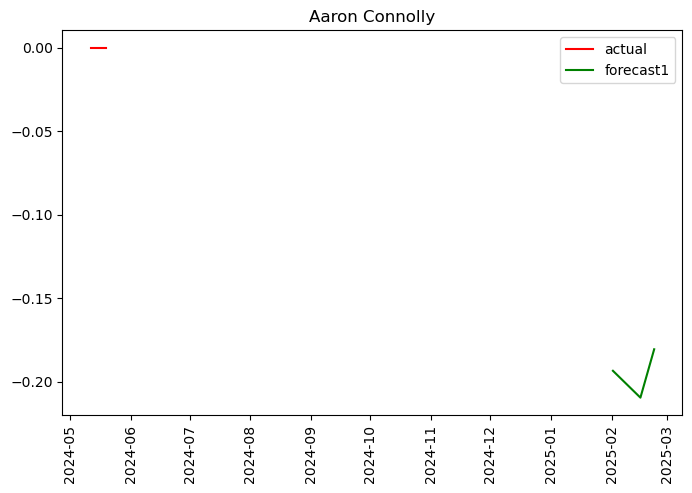

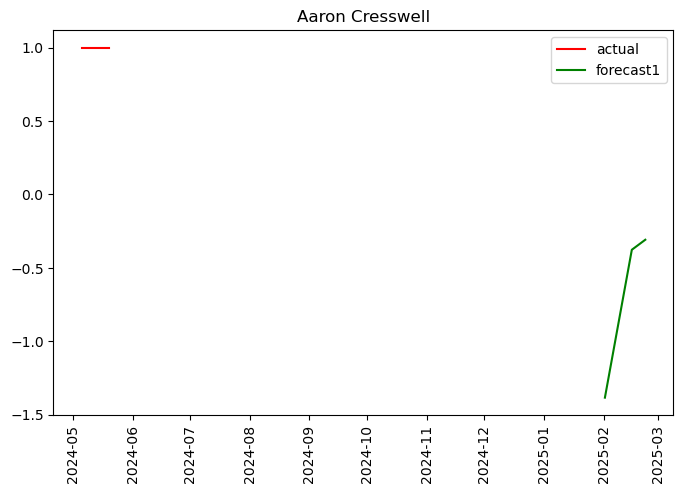

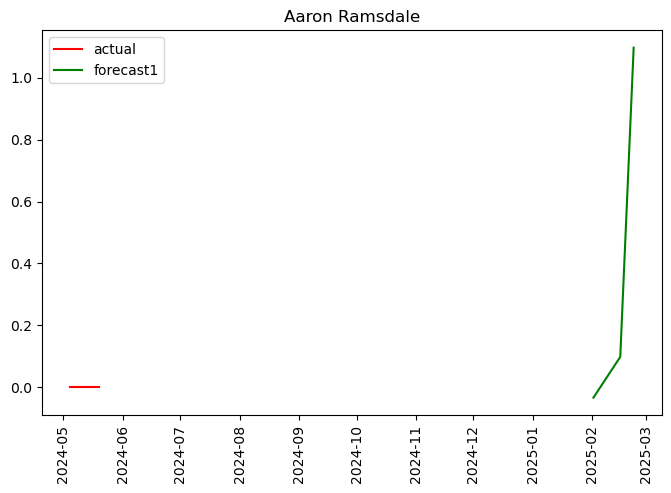

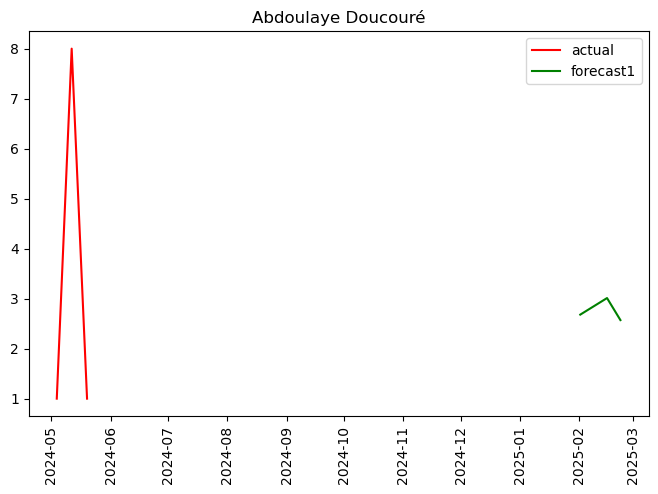

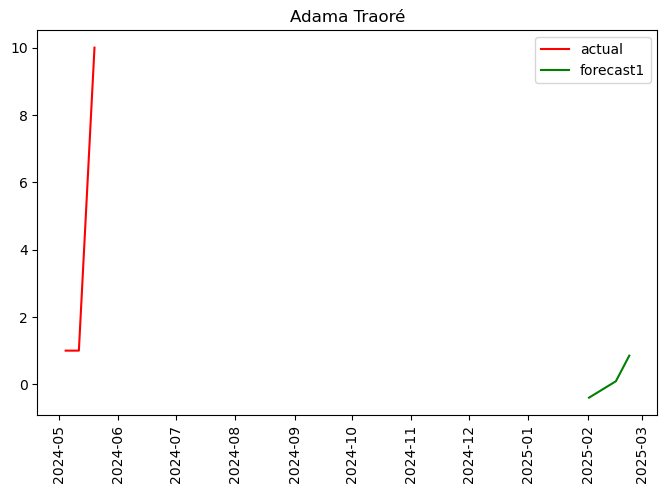

...

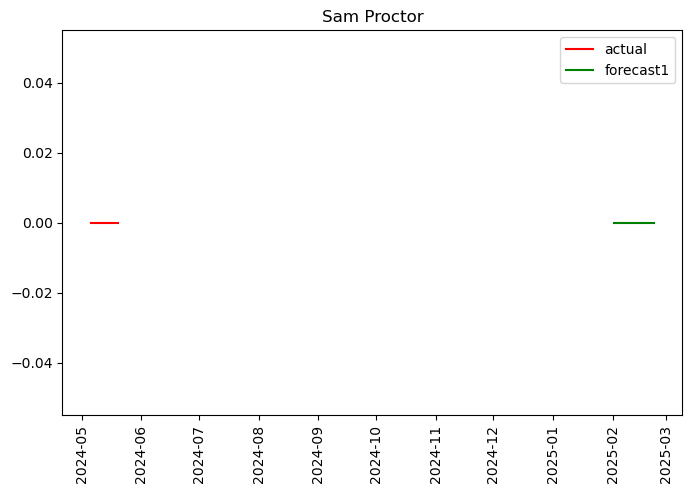

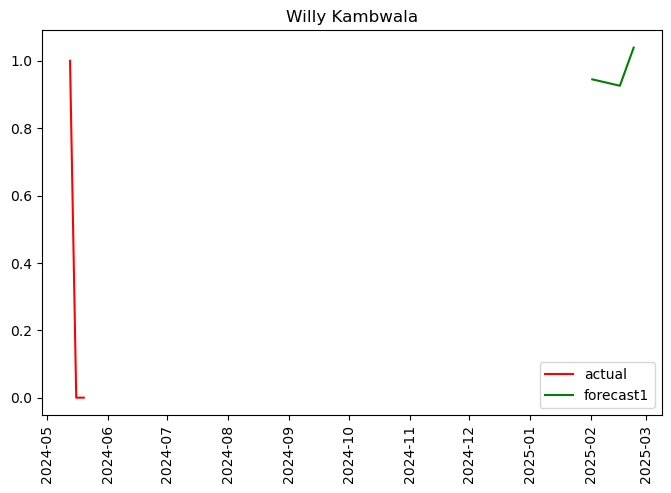

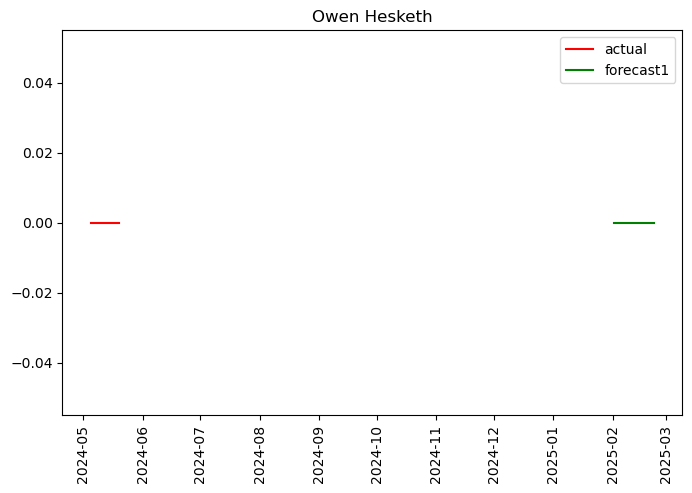

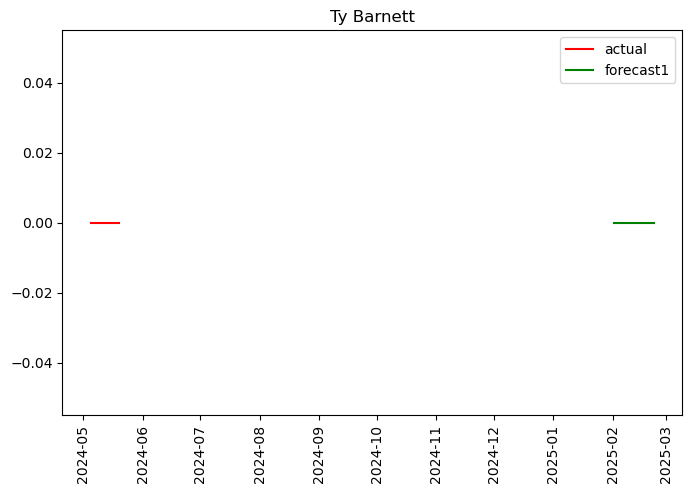

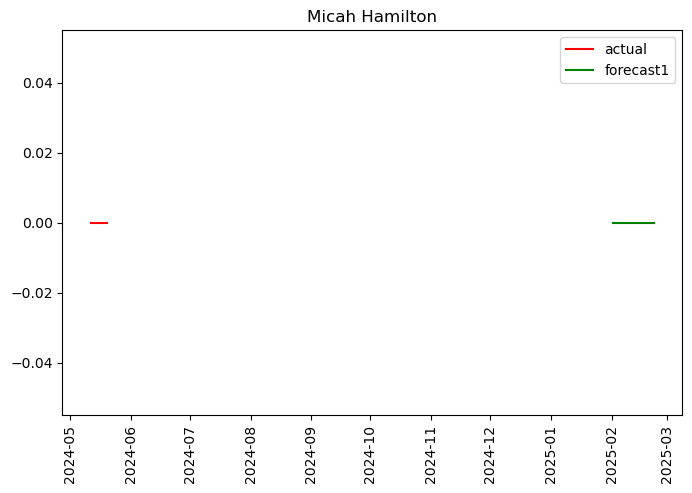

In [30]:
frcst_DF = dfs.dropna().drop_duplicates(subset= 'name').reset_index(drop=True)[['name', 'position', 'opponent_team']]
frcst_DF['score'] = frcst_DF['name'].apply(lambda x: point_frsct(dfs, x, 3))
frcst_DF['score'] = frcst_DF['score'].fillna(0)

In [71]:
top =frcst_DF.sort_values(by = ['score'], ascending=False).head(50)

In [72]:
top.loc[(top['position'] == 'FWD') | (top['position'] == 'MID')].reset_index(drop=True)
#top.loc[(top['position'] == 'DEF')].reset_index(drop=True)

,name,position,opponent_team,score
0,Cole Palmer,MID,9,9.797771
1,Bukayo Saka,MID,8,9.394029
2,Nicolas Jackson,FWD,11,8.903534
3,Alexander Isak,FWD,20,8.132734
4,Ollie Watkins,FWD,15,7.713788
5,Dominic Solanke,FWD,2,7.242776
6,Son Heung-min,MID,17,6.844836
7,Justin Kluivert,MID,19,6.702336
8,Anthony Elanga,MID,2,6.535096
9,Declan Rice,MID,14,6.510124


In [98]:
point_frsct(dfs, 'Ola_Aina', 5)

21:10:22 - cmdstanpy - INFO - Chain [1] start processing
21:10:22 - cmdstanpy - INFO - Chain [1] done processing


Player=======> Ola_Aina
Dropped due to singularity assists
Dropped due to singularity bonus
Dropped due to singularity by IQR or 3sd filter bps
Dropped due to singularity goals_conceded
Dropped due to singularity goals_scored
Dropped due to singularity saves
Dropped due to singularity by IQR or 3sd filter selected
Dropped due to singularity by IQR or 3sd filter threat
Dropped due to singularity by IQR or 3sd filter value
Dropped due to singularity xP
Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
 first argument must be string or compiled pattern


In [101]:
df[df['name'].str.lower().str.contains('lacroix')]

,name,assists,attempted_passes,big_chances_created,big_chances_missed,bonus,bps,clean_sheets,clearances_blocks_interceptions,completed_passes,...,yellow_cards,GW,position,team,xP,expected_assists,expected_goal_involvements,expected_goals,expected_goals_conceded,starts


In [ ]:
frcst_DF[frcst_DF['name'].str.contains('wel')]

### ----------Ends here-----------------

In [ ]:
        model.add_regressor("assists", standardize = False)
        model.add_regressor("bonus", standardize = False)
        model.add_regressor("bps", standardize = False)
        model.add_regressor("goals_conceded", standardize = False)
        model.add_regressor("goals_scored", standardize = False)
        model.add_regressor("selected", standardize = False)
        model.add_regressor("threat", standardize = False)
        model.add_regressor("value", standardize = False)
        model.add_regressor("xP", standardize = False)
        model.add_regressor("clean_sheets_1", standardize = False)

In [ ]:
for c in df.columns:
    exec(f'model.add_regressor("{c}", standardize = False)')

In [ ]:
for a in ['a', 'b', 'c']:
    exec(f'{a} = 1')

In [ ]:
b

In [ ]:
a

In [ ]:
import matplotlib.pyplot as plt

y_test = outdf['y']
y_test_pred = outdf['yhat']
# Calculate residuals
residuals = y_test - y_test_pred

# Plot residuals
plt.scatter(y_test_pred, residuals)
plt.hlines(y=0, xmin=min(y_test_pred), xmax=max(y_test_pred), colors='r')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()

In [ ]:
forecast1['ds']

In [ ]:
import seaborn as sns

In [ ]:
sns.boxplot(dffn['assists'])

In [ ]:
df_ref['goals_conceded'].value_counts()

In [ ]:
len(df_final)

In [ ]:
len(dffn)

In [ ]:
len(df_ref)

In [ ]:
dffnn

In [ ]:
dffnn = dffn[contin_var_final]

In [ ]:
data = dffn[[ i for i in dffn.columns if i != "total_points"]]
label = dffn['total_points']

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from imblearn.over_sampling import SMOTE

# Load data
data = dffn

# Assuming 'target' is the column you want to predict, and the rest are features
X = data.drop('total_points', axis=1)
y = data['total_points']

In [ ]:
# Handle imbalance with SMOTE
sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(X, y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.2, random_state=42)

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler on the training data and transform both training and testing data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)



In [ ]:
# Initialize the Random Forest Regressor
rf = RandomForestRegressor(n_jobs= -1, random_state=42)

# Train the model
rf.fit(X_train_scaled, y_train)

In [ ]:
# Predict on the test set
y_test_pred = rf.predict(X_test_scaled)

# Calculate evaluation metrics
mse = mean_squared_error(y_test, y_test_pred)
r2 = r2_score(y_test, y_test_pred)

print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")


In [ ]:
# Calculate Cross-Validation scores
cv_scores = cross_val_score(rf, X_train_scaled, y_train, cv=5, scoring='r2')
print(f"Cross-Validation R^2 Scores: {cv_scores}")
print(f"Average Cross-Validation R^2: {np.mean(cv_scores)}")

In [ ]:
import matplotlib.pyplot as plt

# Calculate residuals
residuals = y_test - y_test_pred

# Plot residuals
plt.scatter(y_test_pred, residuals)
plt.hlines(y=0, xmin=min(y_test_pred), xmax=max(y_test_pred), colors='r')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

# Predict on training and test sets
y_train_pred = xgb.predict(X_train_scaled)
y_test_pred = xgb.predict(X_test_scaled)

# Calculate R^2 and MSE for training set
train_r2 = r2_score(y_train, y_train_pred)
train_mse = mean_squared_error(y_train, y_train_pred)

# Calculate R^2 and MSE for test set
test_r2 = r2_score(y_test, y_test_pred)
test_mse = mean_squared_error(y_test, y_test_pred)

print(f"Training R^2: {train_r2}")
print(f"Training MSE: {train_mse}")
print(f"Test R^2: {test_r2}")
print(f"Test MSE: {test_mse}")

In [ ]:
def uniFut(col_name, fut_ds):

    m = Prophet()
    pdf = dffn[[col_name, 'ds']].rename(columns={col_name:'y'})
    m.fit(pdf)
    return m.predict(fut_ds)[['ds', 'yhat']].rename(columns={'yhat':col_name})

In [ ]:
unDF = pd.DataFrame(columns=['ds'])
for uncol in df_train.drop(['ds', 'y'], axis=1).columns:
    print(uncol)
    unDF = pd.merge(unDF, uniFut(uncol, fut), on = 'ds', how ='outer' )

In [ ]:
contin_var_final

In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score

In [ ]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data, label, test_size=0.2, random_state=42)

In [ ]:
# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler on the training data and transform both training and testing data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


In [ ]:
scale_pos_weight = (len(label) - np.sum(label)) / np.sum(label) 
xgb = XGBRegressor(scale_pos_weight=scale_pos_weight, random_state=42)

In [ ]:
xgb.fit(X_train_scaled, y_train)

In [ ]:
y_pred = xgb.predict(X_test_scaled)

In [ ]:
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

# Predict on training and test sets
y_train_pred = xgb.predict(X_train_scaled)
y_test_pred = xgb.predict(X_test_scaled)

# Calculate R^2 and MSE for training set
train_r2 = r2_score(y_train, y_train_pred)
train_mse = mean_squared_error(y_train, y_train_pred)

# Calculate R^2 and MSE for test set
test_r2 = r2_score(y_test, y_test_pred)
test_mse = mean_squared_error(y_test, y_test_pred)

print(f"Training R^2: {train_r2}")
print(f"Training MSE: {train_mse}")
print(f"Test R^2: {test_r2}")
print(f"Test MSE: {test_mse}")


In [ ]:
from sklearn.model_selection import cross_val_score

# Perform cross-validation
cv_scores = cross_val_score(xgb, X_train_scaled, y_train, cv=5, scoring='r2')

print(f"Cross-Validation R^2 Scores: {cv_scores}")
print(f"Average Cross-Validation R^2: {np.mean(cv_scores)}")


In [ ]:
import matplotlib.pyplot as plt

# Calculate residuals
residuals = y_test - y_test_pred

# Plot residuals
plt.scatter(y_test_pred, residuals)
plt.hlines(y=0, xmin=min(y_test_pred), xmax=max(y_test_pred), colors='r')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()


In [ ]:
import matplotlib.pyplot as plt

# Calculate residuals
residuals = y_test - y_test_pred

# Plot residuals
plt.scatter(y_test_pred, residuals)
plt.hlines(y=0, xmin=min(y_test_pred), xmax=max(y_test_pred), colors='r', linestyles='dashed')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()


In [ ]:
# Predict on the training set
y_train_pred = xgb.predict(X_train_scaled)

# Calculate R^2 and MSE for training set
train_r2 = r2_score(y_train, y_train_pred)
train_mse = mean_squared_error(y_train, y_train_pred)

# Calculate R^2 and MSE for test set
test_r2 = r2_score(y_test, y_test_pred)
test_mse = mean_squared_error(y_test, y_test_pred)

print(f"Training R^2: {train_r2}")
print(f"Training MSE: {train_mse}")
print(f"Test R^2: {test_r2}")
print(f"Test MSE: {test_mse}")


In [ ]:
for biv in ["clean_sheets", "penalties_missed", "penalties_saved",  "was_home", "red_cards", "yellow_cards"]:
    print(biv, stats.pointbiserialr(df[biv], df['total_points']))


In [ ]:

# Create a sample DataFrame
data = {'Binary': [0, 1, 0, 1, 0, 1],
        'Continuous': [2.3, 3.4, 2.1, 4.3, 2.2, 4.5]}
df = pd.DataFrame(data)

# Calculate point-biserial correlation
binary = df['Binary']
continuous = df['Continuous']
correlation, p_value = stats.pointbiserialr(binary, continuous)

print(f"Point-Biserial Correlation: {correlation}")
print(f"P-value: {p_value}")


In [ ]:
chi2_contingency(pd.crosstab(df['was_home'], df['yellow_cards']))

In [ ]:
clean_sheets: #penalties_missed, was_home, yellow_cards
#penalties_missed: yellow_cards
#was_home: yellow_cards
red_cards: 
#yellow_cards

In [ ]:
yellow_cards, penalties_missed

In [ ]:
spearmanr(df.iloc[:,0], df.iloc[:,1])

In [ ]:
df.columns

In [ ]:
df.iloc[:,0]

In [ ]:
for col in df.columns:
    df[col]

In [ ]:
df.head()

In [ ]:
len(df)

In [ ]:
 df1 = df.dropna()

In [ ]:
len(df1)

In [ ]:
print([i for i in df.iloc[1]])

In [ ]:
dffn.columns

In [ ]:
df['name'][df['name'].str.contains('sala')]

In [ ]:
ddf = df[df['name'] == player]


ddf.set_index("kickoff_time", inplace=True)
if not (ddf.sort_index()[:"2023"].empty or ddf.sort_index()["2024":].empty):    
    ddf = ddf.sort_index().asfreq("W", method="bfill")
    ddf.reset_index(inplace=True)
    ddf.rename({"kickoff_time":"ds", "total_points":"y"}, axis=1, inplace=True)
    ddf['ds'] = ddf['ds'].apply(lambda x:x.tz_localize(None))
    ###m = Prophet(changepoint_prior_scale=0.01, interval_width = 0.95)
    m = Prophet(changepoint_prior_scale=0.01, interval_width = 0.95)
    #m = Prophet(growth='flat', interval_width = 0.95)
    m.fit(ddf)
    future = m.make_future_dataframe(periods=50)
    forecast = m.predict(future)
    out = forecast.set_index('ds')['yhat'].resample("D").median().tail(10).mean()
else:
    out = 0
    print(" Obsolete player found ---------------:", player)
return out
        


In [ ]:
def point_frsct(player):
    try:
        
        ddf = df[df['name'] == player]

        ddf.set_index("kickoff_time", inplace=True)
        if not (ddf.sort_index()[:"2023"].empty or ddf.sort_index()["2024":].empty):    
            ddf = ddf.sort_index().asfreq("W", method="bfill")
            ddf.reset_index(inplace=True)
            ddf.rename({"kickoff_time":"ds", "total_points":"y"}, axis=1, inplace=True)
            ddf['ds'] = ddf['ds'].apply(lambda x:x.tz_localize(None))
            ###m = Prophet(changepoint_prior_scale=0.01, interval_width = 0.95)
            m = Prophet(changepoint_prior_scale=0.01, interval_width = 0.95)
            #m = Prophet(growth='flat', interval_width = 0.95)
            m.fit(ddf)
            future = m.make_future_dataframe(periods=50)
            forecast = m.predict(future)
            out = forecast.set_index('ds')['yhat'].resample("D").median().tail(10).mean()
        else:
            out = 0
            print(" Obsolete player found ---------------:", player)
        return out
        
    except Exception as e:
        print("Exception found !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!\n", e) 
        print(ddf)
    

In [ ]:
frcst_DF = df.dropna().drop_duplicates(subset= 'name')
frcst_DF['score'] = frcst_DF['name'].apply(point_frsct)
frcst_DF['score'] = frcst_DF['score'].fillna(0)

In [ ]:
#df = df[["name", "kickoff_time", "total_points", "position", "team"]]

In [ ]:
frcst_DF.sort_values(by = ['score'], ascending=False).head(30)

In [ ]:
#player_df = pd.read_csv("/Users/gokul/Documents/code/FPL/Fantasy-Premier-League/data/2023-24/cleaned_players.csv")
#player_df['name'] = player_df.apply(lambda x: re.sub(r'[^\w]|[_\d]', '', str(x['first_name']+x['second_name'])).lower(), axis=1)
#f_df = pd.merge(frcst_DF, player_df, on= 'name', how='full')[['name', 'element_type', 'score']]

#--- Analysis

In [ ]:
frcst_DF = frcst_DF.sort_values(by = ['score'], ascending=False).reset_index()

In [ ]:
#frcst_DF['position'] = frcst_DF['position'].str.replace('MID|FWD', 'MID-FWD', regex=True)
fdf = frcst_DF.groupby('position').head(20).sort_values(by = ['position', 'score'], ascending = False)

In [ ]:
top = frcst_DF.sort_values(by = ['score'], ascending=False).head(100)

In [ ]:
top[['position', 'score']].groupby('position').mean()

In [ ]:
fdf[fdf['position'] == 'MID']

#--- Individual Analysis

In [ ]:
%matplotlib inline

In [ ]:
for player in fdf[fdf['position'] == 'FWD']['name'][:10]:

#player = "mateokovačić"
    ddf = df[df['name'] == player].sort_index()
    #ddf = ddf[["kickoff_time", "total_points"]]
    
    #ddf = ddf.set_index("kickoff_time").sort_index().asfreq("D", method="pad")
    ddf = ddf.set_index("kickoff_time").sort_index().asfreq("W", method="bfill")
    #ddf['total_points'] = ddf['total_points'].interpolate(method='linear')
    ddf.reset_index(inplace=True)
    ddf.rename({"kickoff_time":"ds", "total_points":"y"}, axis=1, inplace=True)
    ddf['ds'] = ddf['ds'].apply(lambda x:x.tz_localize(None))
    m = Prophet(changepoint_prior_scale=0.01, interval_width = 0.95)
    #m = Prophet(growth='flat', interval_width = 0.95)
    m.fit(ddf)
    future = m.make_future_dataframe(periods=50)
    forecast = m.predict(future)
    
    out = forecast.set_index('ds')['yhat'].resample("D").median().tail(10).mean()
    pd.concat([ddf.set_index('ds')['y'], forecast.set_index('ds')['yhat']], axis=1).plot(title=player+" - "+str(out))

In [ ]:
m.plot(forecast)

In [ ]:
m.plot_components(forecast)

#-----------------

In [ ]:
forecast[["ds", "yhat", "yhat_lower", "yhat_upper"]].tail(10)